# MBA em Ciência de Dados - TCC
# Predição da Radiação Solar para Produção de Hidrogênio Verde: Análise comparativa de métodos de Aprendizado de Máquina

## Exploratory Data Analysis
**Material Produzido por:** Mateus Vasconcelos Albuquerque

**Cemeai - ICMC/USP São Carlos**


---------------------------------------------------------------------------------------------------------





## **CRISP-DS**

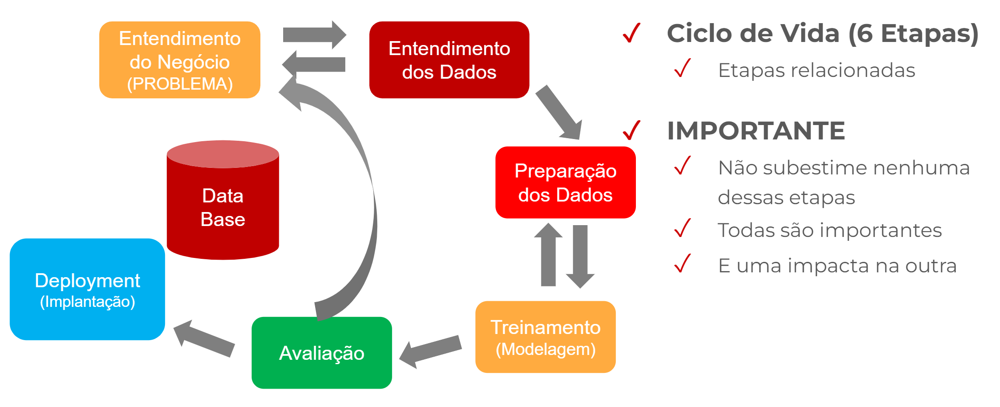

## **2. Entendimento dos Dados**

### 2.1. Imports iniciais

In [52]:
import pandas as pd
from pandas.plotting import lag_plot
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import yaml
import os

#### 2.1.1 Leitura do arquivo de configuração

In [53]:
# Leitura do arquivo de configuração

# folder para carregar os config files
CONFIG_PATH = "config/"

# Função para carregar os dados
def load_config(config_name):
    with open(os.path.join(CONFIG_PATH, config_name)) as file:
        config = yaml.safe_load(file)

    return config

In [54]:
config = load_config("data_preprocessing_config_jaguaruana.yaml")

# mostrar todas as colunas
pd.set_option("display.max_columns", None)

#### 2.1.2. Leitura dos dados pré-processados

In [55]:
# Leitura dos dados a partir do CSV
codigo_wmo = config["input_data_parameters"]["codigo_wmo"]
estacao = config["input_data_parameters"]["estacao"]

input_dir = config["output_directory_preprocessing"]

filepath = f"{input_dir}/preprocessed_data_{codigo_wmo}_{estacao}.csv"

data = pd.read_csv(
    filepath,
    index_col=0,
)

### 2.2. Correlação entre variáveis

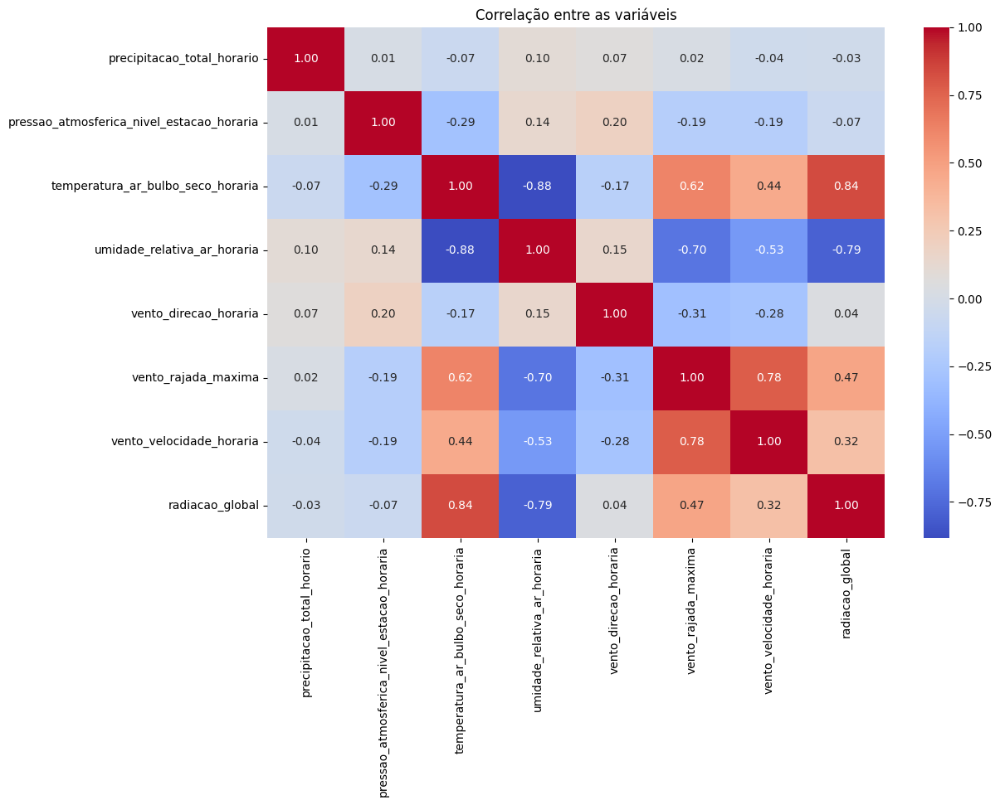

In [56]:
# plot dos valores da correlação entre as variáveis retirando a coluna year
plt.figure(figsize=(12, 8))
sns.heatmap(
    data.drop(columns=["year", "hora", "mes", "semana", "dia_ano"]).corr(),
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
)
plt.title("Correlação entre as variáveis")
plt.show()

### 2.3. Tratamento de Valores 0

Temos inúmeros valores iguais a 0 na base. Enquanto eles fazem sentido físico, podem impactar análises estatísticas, como decomposição sazonal multiplicativa, etc. Vamos adicionar um epsilon bem pequeno, o qual será retirado ao fim das previsões

In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  int64  


In [58]:
data.head()

,precipitacao_total_horario,pressao_atmosferica_nivel_estacao_horaria,temperatura_ar_bulbo_seco_horaria,umidade_relativa_ar_horaria,vento_direcao_horaria,vento_rajada_maxima,vento_velocidade_horaria,radiacao_global,year,hora,mes,semana,dia_ano
2015-01-01 00:00:00,0.0,NaN,28.061093,65.304377,NaN,5.943152,2.035874,0.0,2015,0,1,1,1
2015-01-01 01:00:00,0.0,NaN,28.061093,65.304377,NaN,5.943152,2.035874,0.0,2015,1,1,1,1
2015-01-01 02:00:00,0.0,NaN,28.061093,65.304377,NaN,5.943152,2.035874,0.0,2015,2,1,1,1
2015-01-01 03:00:00,0.0,NaN,28.061093,65.304377,NaN,5.943152,2.035874,0.0,2015,3,1,1,1
2015-01-01 04:00:00,0.0,NaN,28.061093,65.304377,NaN,5.943152,2.035874,0.0,2015,4,1,1,1


In [59]:
# para 8 primeiras colunas, adicionar 0.01
data.iloc[:, :8] = data.iloc[:, :8] + 0.01

data.head()

,precipitacao_total_horario,pressao_atmosferica_nivel_estacao_horaria,temperatura_ar_bulbo_seco_horaria,umidade_relativa_ar_horaria,vento_direcao_horaria,vento_rajada_maxima,vento_velocidade_horaria,radiacao_global,year,hora,mes,semana,dia_ano
2015-01-01 00:00:00,0.01,NaN,28.071093,65.314377,NaN,5.953152,2.045874,0.01,2015,0,1,1,1
2015-01-01 01:00:00,0.01,NaN,28.071093,65.314377,NaN,5.953152,2.045874,0.01,2015,1,1,1,1
2015-01-01 02:00:00,0.01,NaN,28.071093,65.314377,NaN,5.953152,2.045874,0.01,2015,2,1,1,1
2015-01-01 03:00:00,0.01,NaN,28.071093,65.314377,NaN,5.953152,2.045874,0.01,2015,3,1,1,1
2015-01-01 04:00:00,0.01,NaN,28.071093,65.314377,NaN,5.953152,2.045874,0.01,2015,4,1,1,1


In [60]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  int64  


### 2.4. Precipitação - EDA univariada

In [61]:
variavel = "precipitacao_total_horario"
label = "Precipitação Global (mm)"

In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  int64  


#### 2.4.1 Estatísticas descritivas

In [63]:
data[variavel].describe()

count    43824.000000
mean         0.048750
std          0.503177
min          0.010000
25%          0.010000
50%          0.010000
75%          0.010000
max         25.010000
Name: precipitacao_total_horario, dtype: float64

Pela análise das métricas descritivas principais da variável Precipitação, vemos que a maior parte dos dados são de fato 0. Faz sentido visto se tratar de uma estação no semiárido nordestino, onde não chove na maior parte do tempo.

A média é puxada para 0 apesar do valor máximo ser de 42 mm

#### 2.4.2. Coeficiente de Variação

In [64]:
def calcula_cv(data, variavel):
    # Cálculo do Coeficiente de Variação
    cv = data[variavel].std() / data[variavel].mean() * 100

    return cv

In [65]:
print(calcula_cv(data, variavel))

1032.1490297630417


Temos, nesse, caso, uma distribuição altamente heterogênea

#### 2.4.3. Visualização de perfil

In [66]:
def plota_perfil_geral(data, variavel, label, inicio="2015-01-01", fim="2019-12-31"):
    import matplotlib.dates as mdates
    from matplotlib.ticker import MaxNLocator
    
    # Garantindo que o índice seja datetime
    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    # Filtrando os dados para o intervalo de tempo
    data_filtrada = data.loc[inicio:fim]

    # Plotando os dados
    data_filtrada[variavel].plot(figsize=(10, 6))

    # Adicionando rótulos e título
    plt.ylabel(label, fontsize=16)

    # Configurando o eixo x com formatação de data
    # plt.gca().xaxis.set_major_locator(MaxNLocator(5))  # Máximo de 5 ticks no eixo x
    # plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Formato YYYY-MM-DD

    # Ajustando estilos
    plt.xticks(fontsize=10, rotation=45)
    plt.yticks(fontsize=14)
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()

    # Exibindo o gráfico
    plt.show()

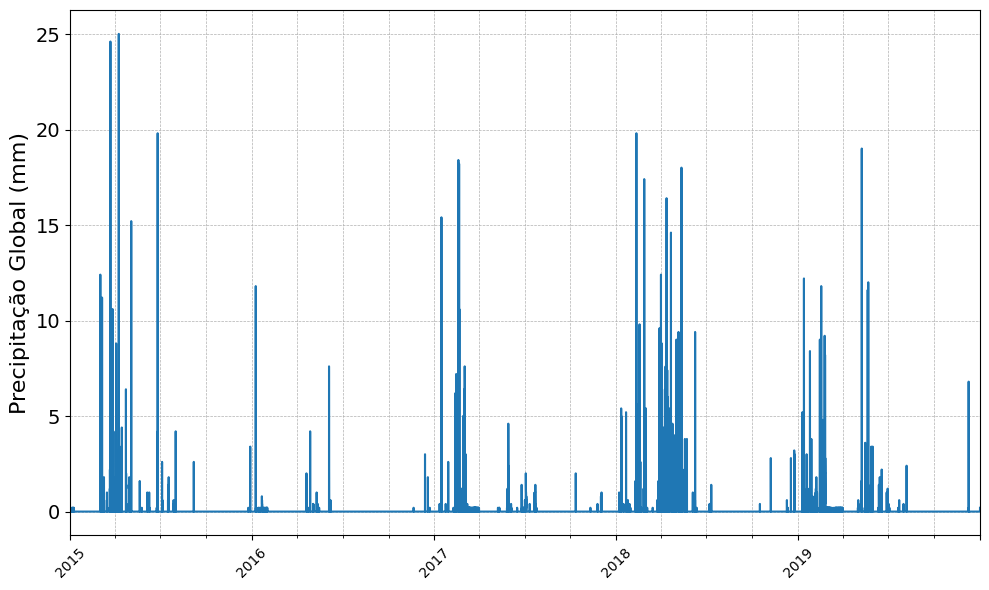

In [67]:
plota_perfil_geral(data, variavel, label)

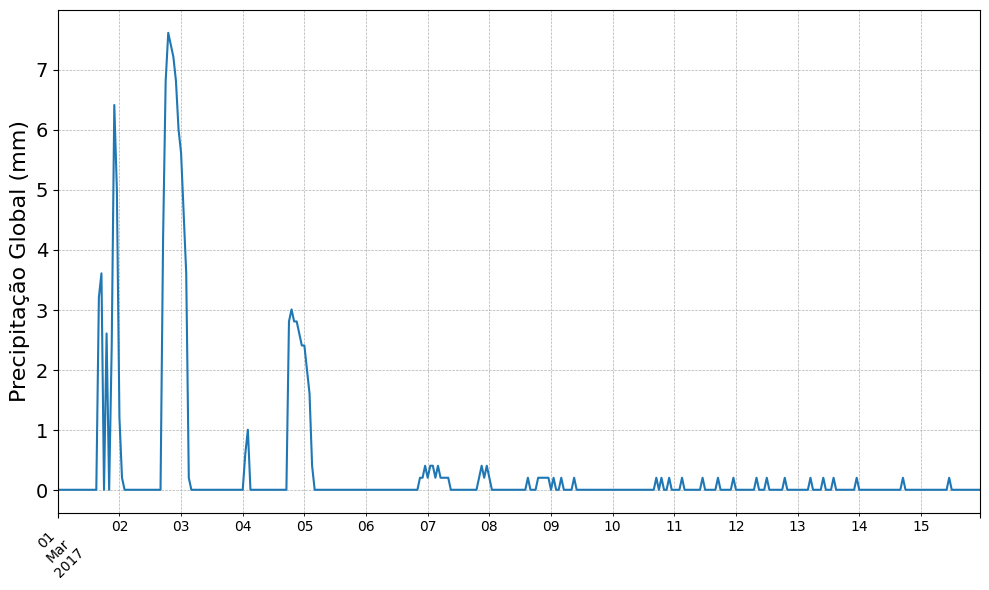

In [68]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Visualmente, percebemos o padrão para a Precipitação de diversos valores 0 e algum picos de chuva espalhados (--> Dirac)

#### 2.4.4. Média móvel e desvio padrão móvel

In [69]:
def show_estat_moveis(
    data, variavel, label, inicio="2015-01-01", fim="2019-12-31", window=168
):
    # Garantindo que o índice seja datetime
    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    # Média móvel e desvio padrão móvel
    data["MMS"] = data[variavel].rolling(window=window).mean()
    data["DP-X"] = data[variavel].rolling(window=window).std()

    # Filtrando os dados para o intervalo de tempo
    data_filtrada = data.loc[inicio:fim]

    # Criando o gráfico
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Selecionando cores do colormap padrão
    cmap = plt.get_cmap("tab10")
    color1 = cmap(0)  
    color2 = cmap(1)  
    color3 = cmap(2)  

    # Primeiro eixo y (variável principal)
    ax1.plot(
        data_filtrada.index,
        data_filtrada[variavel],
        label=variavel,
        color=color1,
        alpha=0.7,
    )
    ax1.plot(
        data_filtrada.index,
        data_filtrada["MMS"],
        label="Média Móvel",
        color=color2,
        linestyle="--",
    )
    ax1.set_ylabel(label, fontsize=16)
    ax1.tick_params(axis="y", labelcolor=color2)
    ax1.grid(True, which="major", linestyle="--", linewidth=0.5)

    # Segundo eixo y (média móvel e desvio padrão)
    ax2 = ax1.twinx()
    ax2.plot(
        data_filtrada.index,
        data_filtrada["DP-X"],
        label="Desvio Padrão Móvel",
        color=color3,
        linestyle=":",
    )
    ax2.tick_params(axis="y", labelcolor=color3)

    # Adicionando legenda
    fig.legend(loc="upper left", bbox_to_anchor=(0.1, 0.9), fontsize=12)

    # Ajustando o layout
    plt.tight_layout()

    # Exibindo o gráfico
    plt.show()

    # Remoção de variáveis de média móvel e desvio padrão
    data.drop(columns=["MMS", "DP-X"], inplace=True)


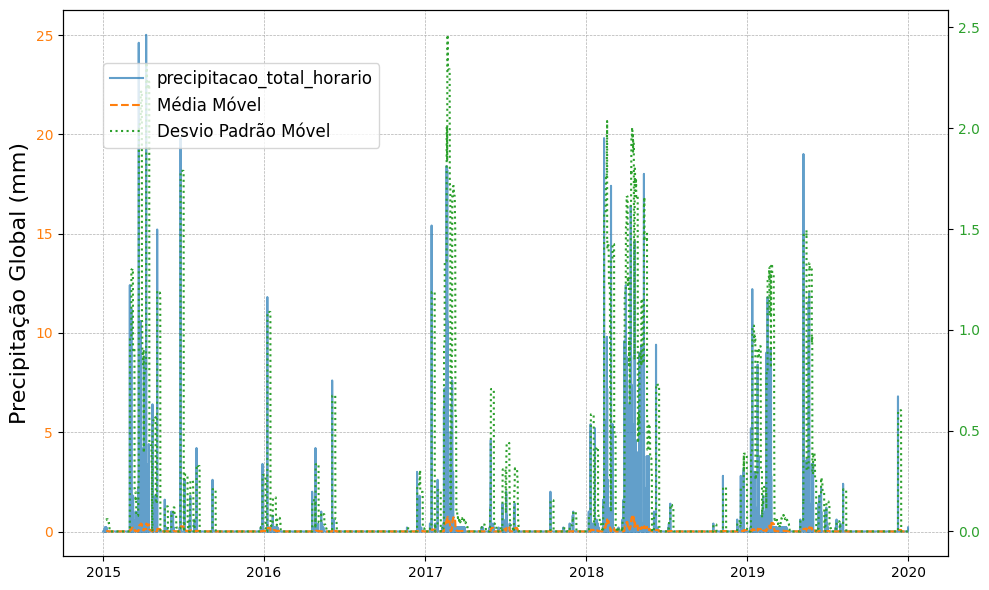

In [70]:
show_estat_moveis(data, variavel, label)

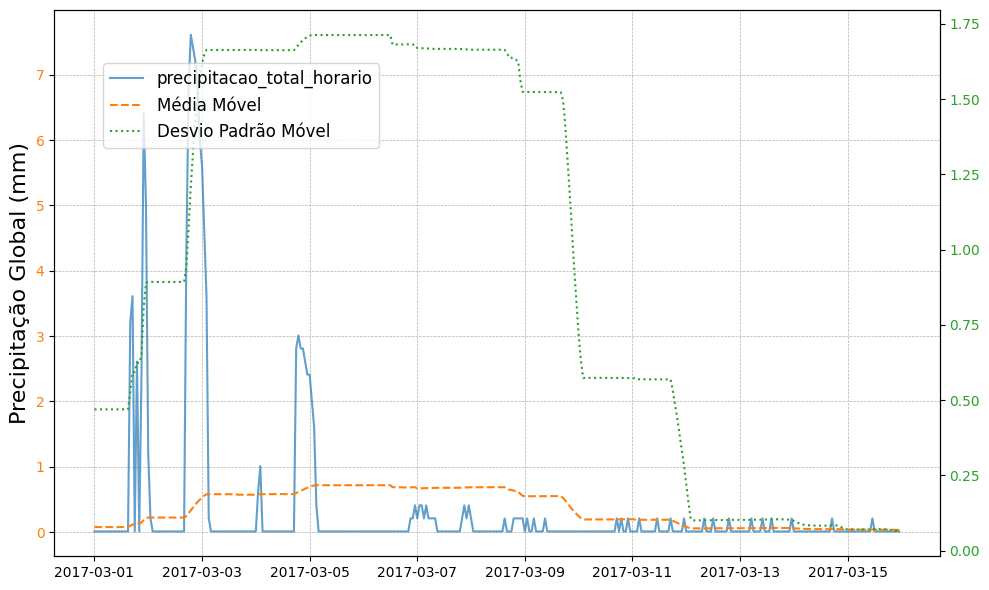

In [71]:
show_estat_moveis(data, variavel, label, inicio, fim)

#### 2.4.5. Boxplot geral

In [72]:
def plota_boxplot_geral(data, variavel, label):
    # Configurando a figura
    plt.figure(figsize=(20, 15))

    mean=data[variavel].mean()
    median=data[variavel].median()
    mode=data[variavel].mode().values[0]

    # Primeiro subplot: histograma com KDE
    plt.subplot(2, 1, 1)
    sns.histplot(data, x=variavel, kde=True)
    plt.ylabel("Frequência", fontsize=25)
    # plt.title("Distribuição da Radiação Global", fontsize=20)
    # remove xlabel
    plt.xlabel(None)

    plt.axvline(mean, color='r', linestyle='--', label="Mean")
    plt.axvline(median, color='g', linestyle='-', label="Median")
    plt.axvline(mode, color='b', linestyle='-', label="Mode")
    plt.legend(fontsize=20)


    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)

    # Segundo subplot: boxenplot
    plt.subplot(2, 1, 2)
    sns.boxenplot(
        data[variavel],
        orient="h",
        flier_kws={"marker": "d", "s": 90},  # Corrigido para `size`
        k_depth="tukey",
    )
    plt.xlabel(label, fontsize=25)
    plt.xticks(fontsize=22)
    plt.yticks([])  # Remover ticks do eixo y para o boxenplot
    # plt.title("Boxenplot da Radiação Global", fontsize=20)

    plt.axvline(mean, color='r', linestyle='--')
    plt.axvline(median, color='g', linestyle='-')
    plt.axvline(mode, color='b', linestyle='-')

    # Ajustando o layout
    plt.tight_layout()

    # Exibindo o gráfico
    plt.show()

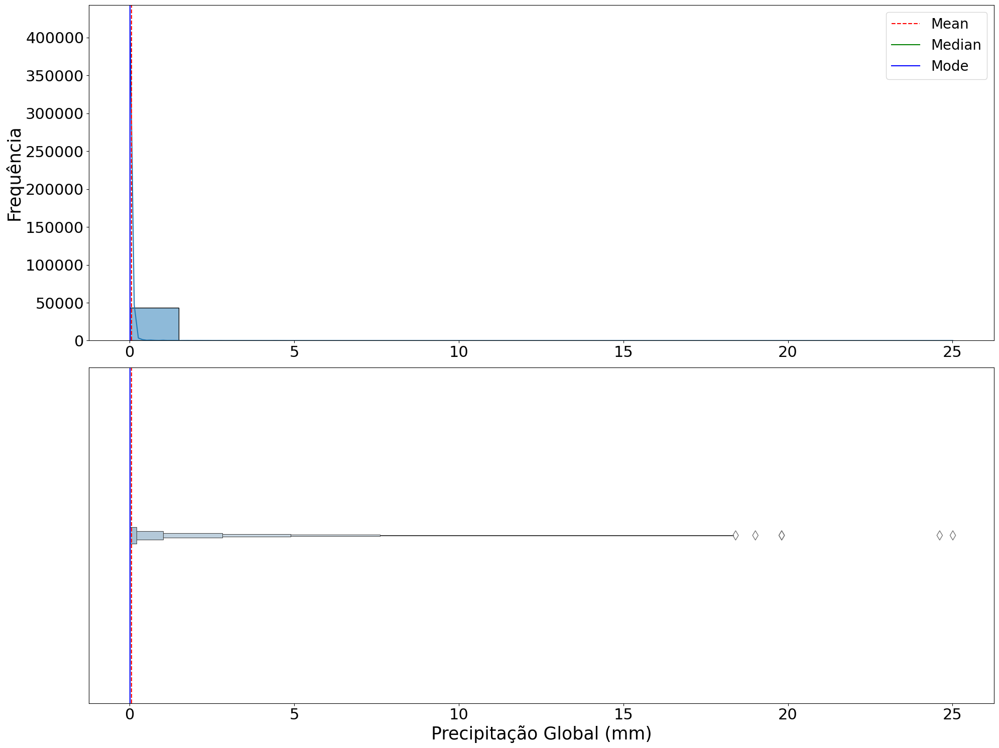

In [73]:
plota_boxplot_geral(data, variavel, label)

#### 2.4.6. Boxplot por semana e hora do dia

In [74]:
def plota_boxplot_semana_hora(data, variavel, label):
    # Criando a figura e os subgráficos (2 gráficos, 1 coluna)
    fig, axes = plt.subplots(2, 1, figsize=(15, 12))  # 2 linhas, 1 coluna

    # Boxplot por Semana
    sns.boxplot(
        x="semana",
        y=variavel,
        data=data,
        showmeans=True,
        meanline=True,
        meanprops={"color": "red", "linestyle": "--"},
        ax=axes[0],  # Primeiro gráfico
    )
    axes[0].set_title("Boxplot por Semana", fontsize=16)
    axes[0].set_xlabel("Semana", fontsize=14)
    axes[0].set_ylabel(label, fontsize=14)
    axes[0].tick_params(axis='both', which='major', labelsize=12)

    # Boxplot por Hora
    sns.boxplot(
        x="hora",
        y=variavel,
        data=data,
        showmeans=True,
        meanline=True,
        meanprops={"color": "red", "linestyle": "--"},
        ax=axes[1],  # Segundo gráfico
    )
    axes[1].set_title("Boxplot por Hora", fontsize=16)
    axes[1].set_xlabel("Hora", fontsize=14)
    axes[1].set_ylabel(label, fontsize=14)
    axes[1].tick_params(axis='both', which='major', labelsize=12)

    # Ajustando o layout para que os gráficos não se sobreponham e adicionando mais espaço
    plt.subplots_adjust(hspace=0.3)

    # Exibindo os gráficos
    plt.show()

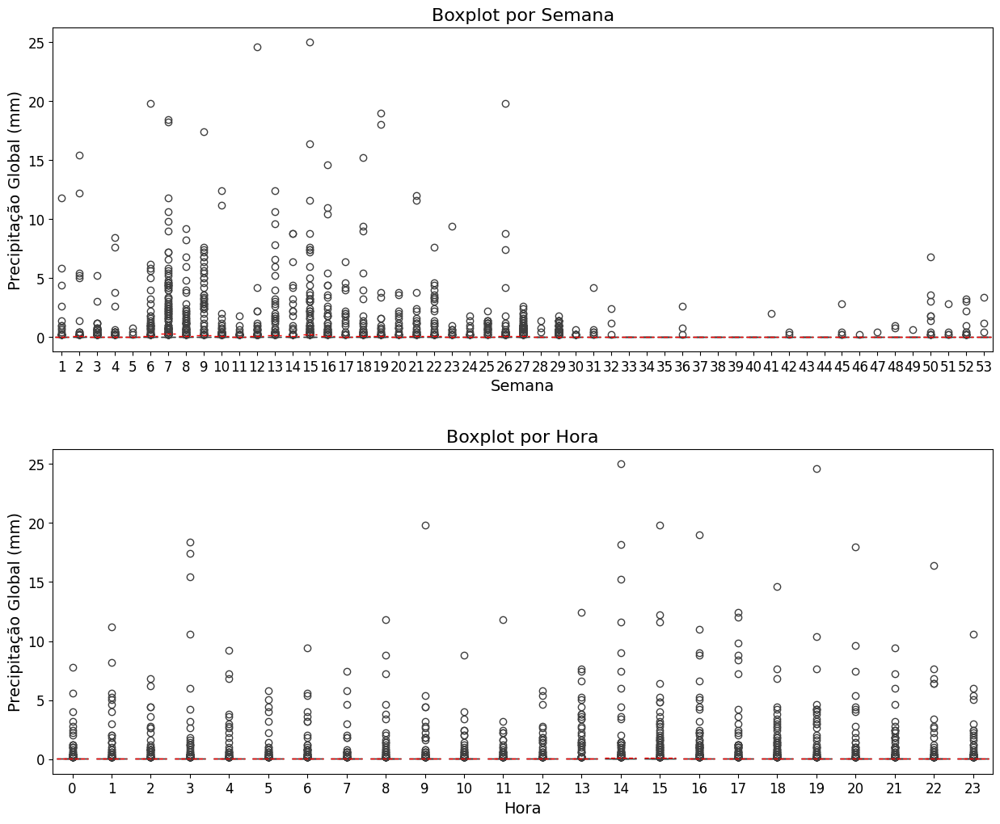

In [75]:
plota_boxplot_semana_hora(data, variavel, label)

#### 2.4.7. Teste de Estacionariedade (Dickey-Fuller)

In [76]:
def dickey_fuller(data, variavel, tipo="geral"):
    from statsmodels.tsa.stattools import adfuller

    # Teste para a série original
    if tipo == "1_diff":
        result = adfuller(np.diff(data["radiacao_global"]), autolag="AIC")
    elif tipo == "2_diff":
        result = adfuller(
            np.diff(np.diff(data["radiacao_global"])), autolag="AIC"
        )
    else:
        result = adfuller(data[variavel], autolag="AIC")
    print("ADF Statistic: %f" % result[0])
    print("p-value: %f" % result[1])
    print("Critical Values:")
    for key, value in result[4].items():
        print("\t%s: %.3f" % (key, value))

In [77]:
dickey_fuller(data, variavel)

ADF Statistic: -22.993900
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Dessa forma, como o p-valor é suficientemente pequeno, podemos rejeitar a hipótese nulae, portanto, tomar que a série original é estacionária ou tendência-estacionária

In [78]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -50.892012
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [79]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -63.710835
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Mesma coisa para primeiras e segundas diferenças

#### 2.4.8. Decomposição em Tendência e Sazonalidade

In [80]:
def decompoe_tendencia_sazonalidade(
    data,
    variavel,
    modelo="multiplicative",
    periodo=24,
    inicio="2015-01-01",
    fim="2019-12-31",
):
    from statsmodels.tsa.seasonal import seasonal_decompose
    from pylab import rcParams

    # Teste do modelo aditivo com período de 7 dias (suposição inicial)
    result = seasonal_decompose(
        data.loc[inicio:fim, variavel],
        model=modelo,
        period=periodo,
    )

    rcParams["figure.figsize"] = 10, 6

    fig = result.plot()

    # Removendo o título superior
    fig.suptitle("")  # Define o título superior como vazio

    # Personalizando os ticks e labels
    for ax in fig.axes:
        ax.tick_params(axis="x", bottom=False, labelbottom=False)  # Remove os ticks no eixo x
        ax.set_xlabel("")  # Remove o nome do eixo x
        ax.tick_params(axis="y", labelsize=14)  # Ajusta o tamanho dos ticks no eixo y
        ax.set_ylabel(ax.get_ylabel(), fontsize=16)  # Aumenta o tamanho do label do eixo y

    # Exibe o gráfico
    plt.tight_layout()

    plt.show()

##### 2.4.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [81]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

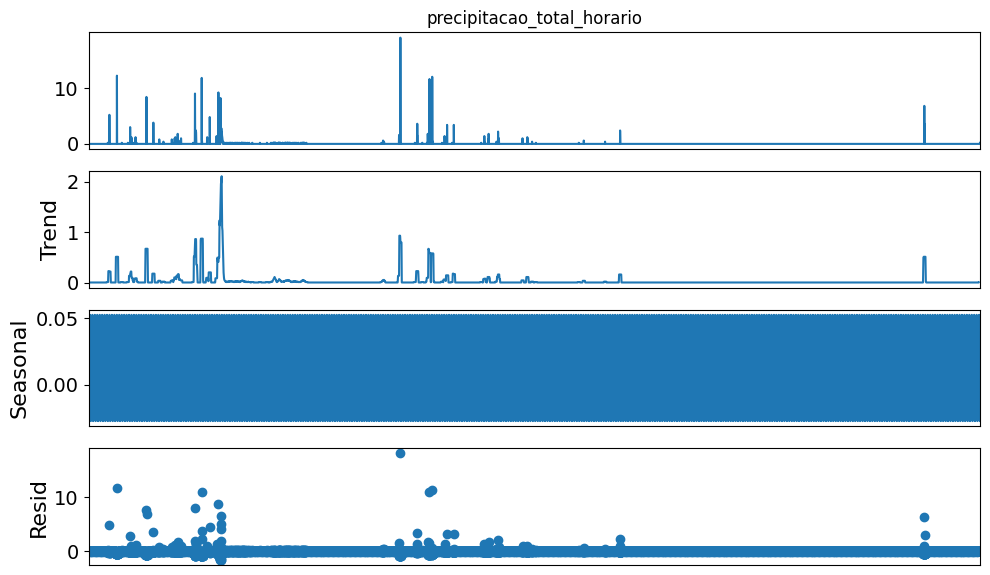

In [82]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.4.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [83]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

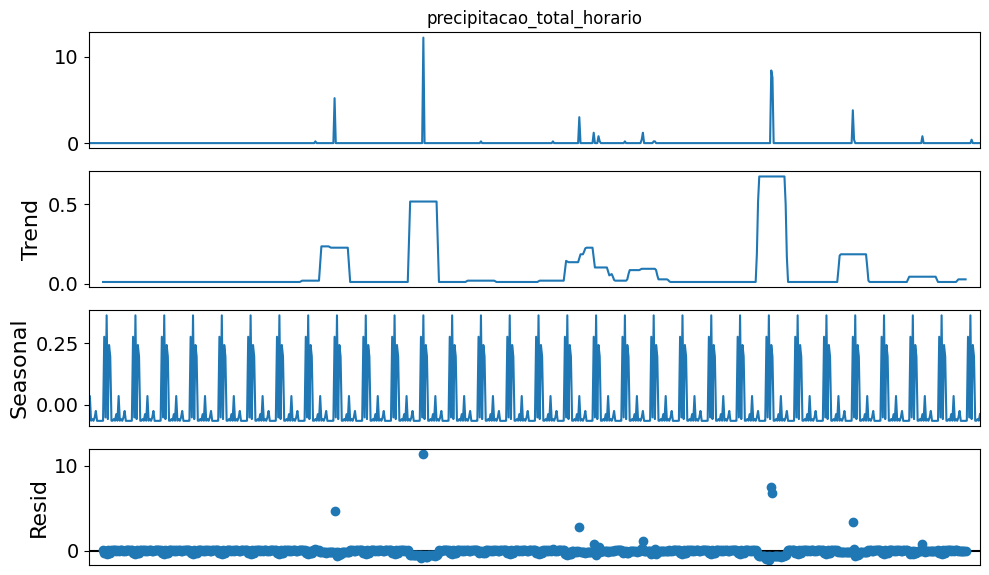

In [84]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.4.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [85]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

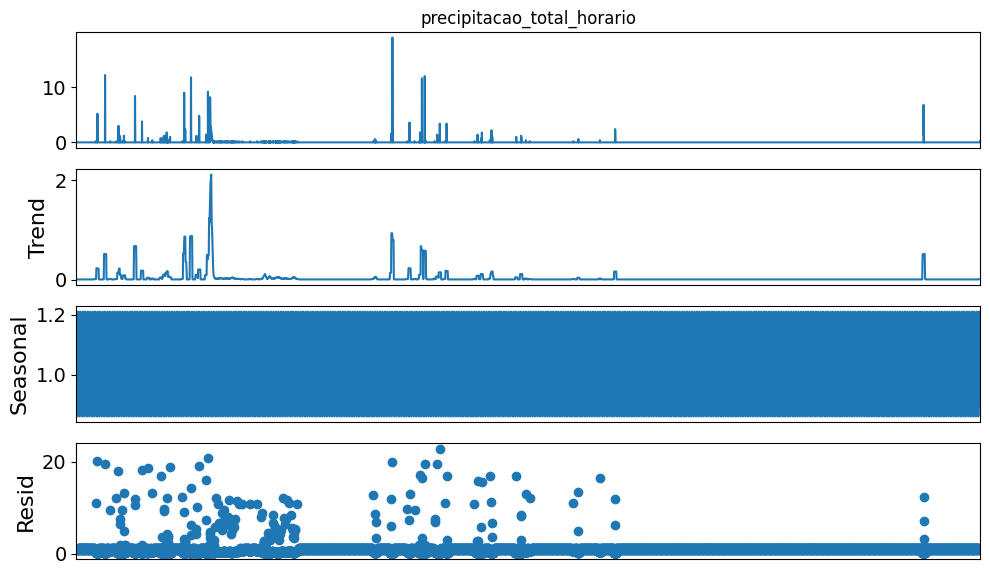

In [86]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.4.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [87]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

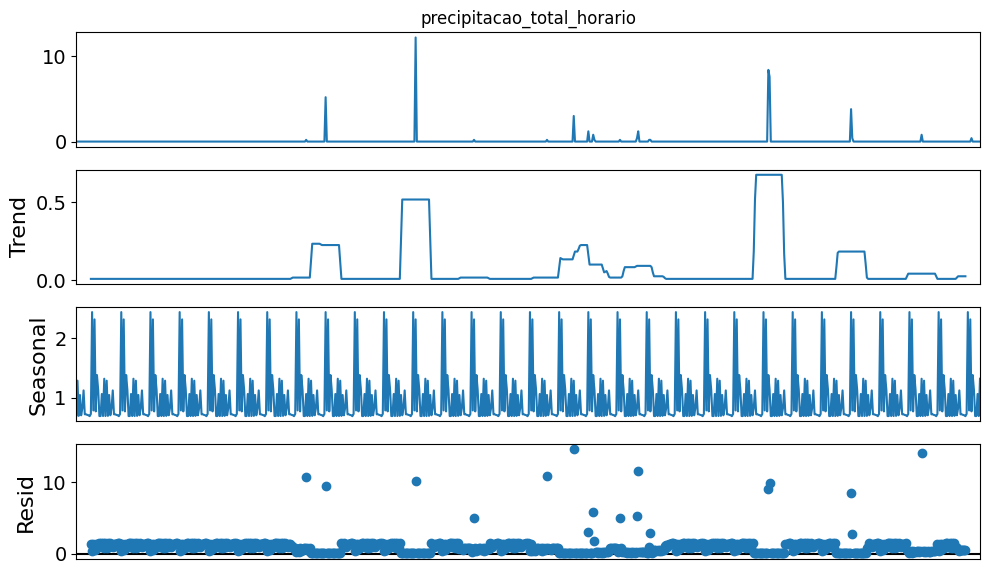

In [88]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.4.9. Análise de Autocorrelação

In [89]:
def plot_acf_pacf(data, variavel, lags=50):
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    # Configurações
    y_label = "Autocorrelação"
    lags = 50

    # Criando os subgráficos em um quadro 2x2
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharey=False)

    # Gráfico ACF da série original (canto superior esquerdo)
    plot_acf(
        data[variavel], 
        lags=lags, 
        ax=axes[0, 0], 
        title="ACF - Série Original"
    )
    axes[0, 0].set_ylabel(y_label, fontsize=14)
    axes[0, 0].set_xlabel("Lags", fontsize=14)

    # Gráfico PACF da série original (canto inferior esquerdo)
    plot_pacf(
        data[variavel], 
        lags=lags, 
        ax=axes[1, 0], 
        title="PACF - Série Original"
    )
    axes[1, 0].set_ylabel(y_label, fontsize=14)
    axes[1, 0].set_xlabel("Lags", fontsize=14)

    # Primeira diferença da série
    diff_data = data[variavel].diff().dropna()

    # Gráfico ACF da primeira diferença (canto superior direito)
    plot_acf(
        diff_data, 
        lags=lags, 
        ax=axes[0, 1], 
        title="ACF - Primeira Diferença"
    )
    axes[0, 1].set_ylabel("")
    axes[0, 1].set_xlabel("Lags", fontsize=14)

    # Gráfico PACF da primeira diferença (canto inferior direito)
    plot_pacf(
        diff_data, 
        lags=lags, 
        ax=axes[1, 1], 
        title="PACF - Primeira Diferença"
    )
    axes[1, 1].set_ylabel("")
    axes[1, 1].set_xlabel("Lags", fontsize=14)

    # Ajustando os ticks e labels
    for ax_row in axes:
        for ax in ax_row:
            ax.tick_params(axis="both", labelsize=12)

    # Ajustando o layout para evitar sobreposição
    plt.tight_layout()
    plt.show()

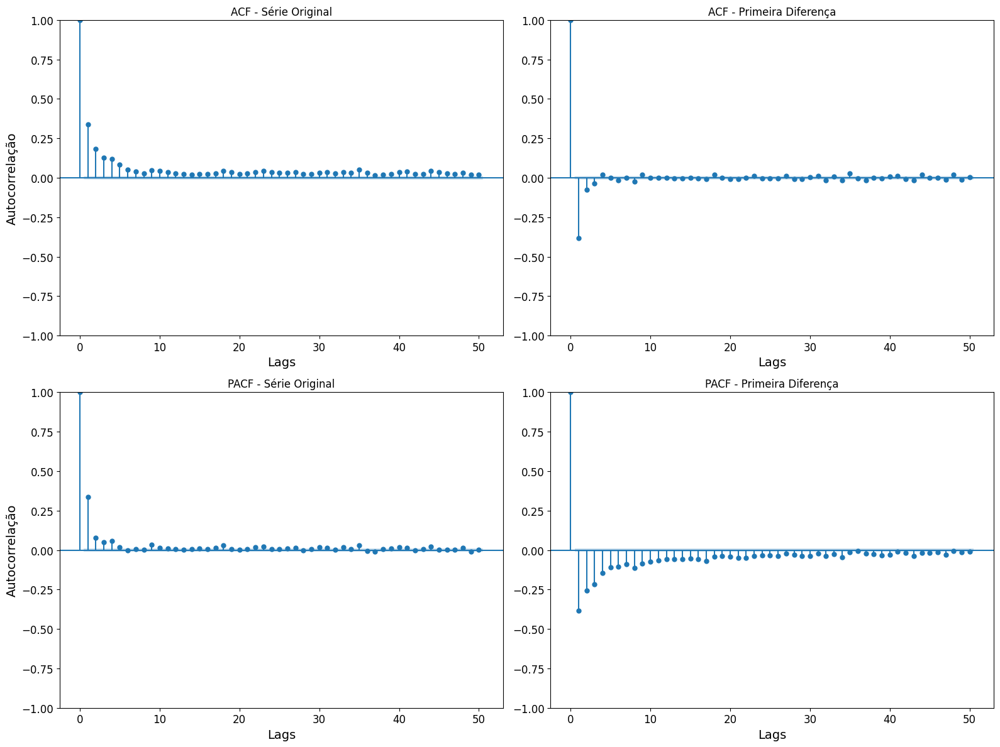

In [90]:
plot_acf_pacf(data, variavel)

Como já visualizado, não temos uma sazonalidade bem definida

### 2.5. Pressão Atmosférica - EDA univariada

In [91]:
variavel = "pressao_atmosferica_nivel_estacao_horaria"
label = "Pressão Atmosférica (mB)"

#### 2.5.1 Estatísticas descritivas

In [92]:
data[variavel].describe()

count    43816.000000
mean      1010.371723
std          2.234524
min       1004.310000
25%       1008.910000
50%       1010.410000
75%       1011.910000
max       1016.610000
Name: pressao_atmosferica_nivel_estacao_horaria, dtype: float64

Vemos que os dados se concentram por volta de 1000 mB, como esperado, com a média quase coincidindo com a mediana, logo, sem assimetria da distribuição.

#### 2.5.2. Coeficiente de Variação

In [93]:
print(calcula_cv(data, variavel))

0.22115861676767443


Temos, portanto, uma dispersão moderada dos dados, mas bem menor do que para a variável de Precipitação. Isso faz sentido visto a variável de precipitação ser predomiunantemente 0 com "picos" em alguns pontos de maior pluviosidade.

#### 2.5.3. Visualização de perfil

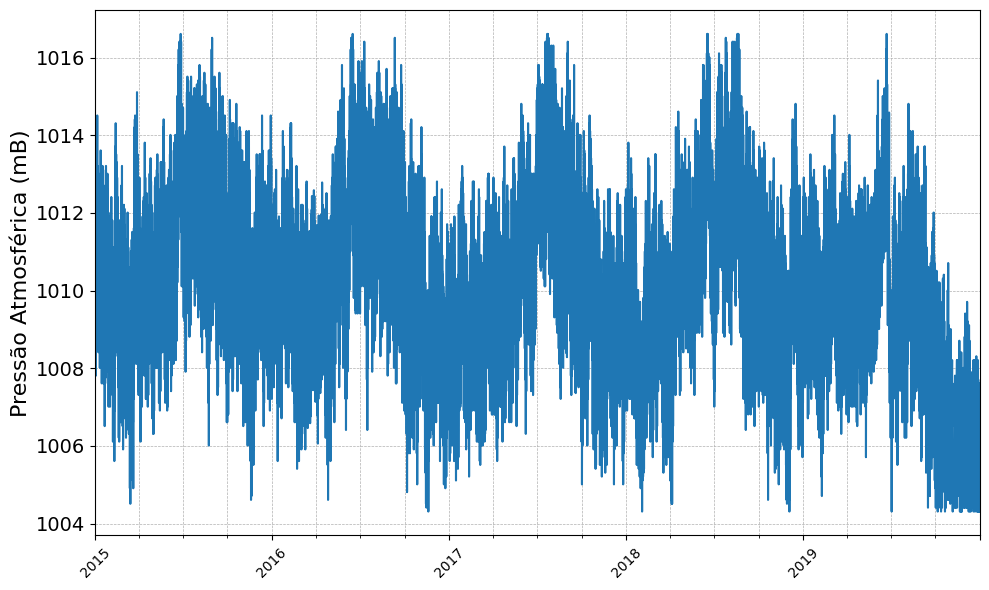

In [94]:
plota_perfil_geral(data, variavel, label)

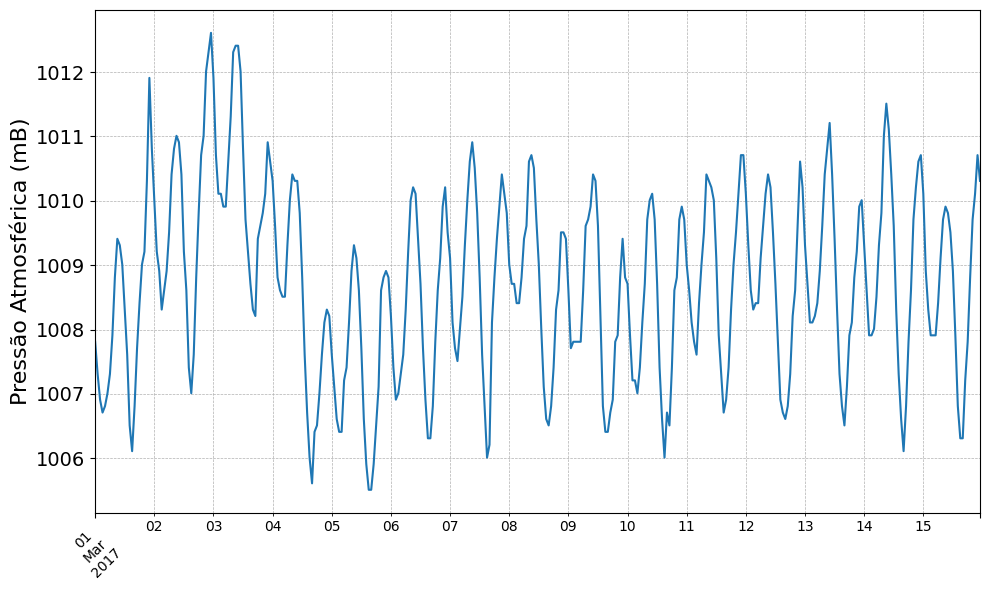

In [95]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual aparente dos dados, com uma segunda sazonalidade diária, quando olhamos no detalhe, padrão comum para variáveis atmosféricas

#### 2.5.4. Média móvel e desvio padrão móvel

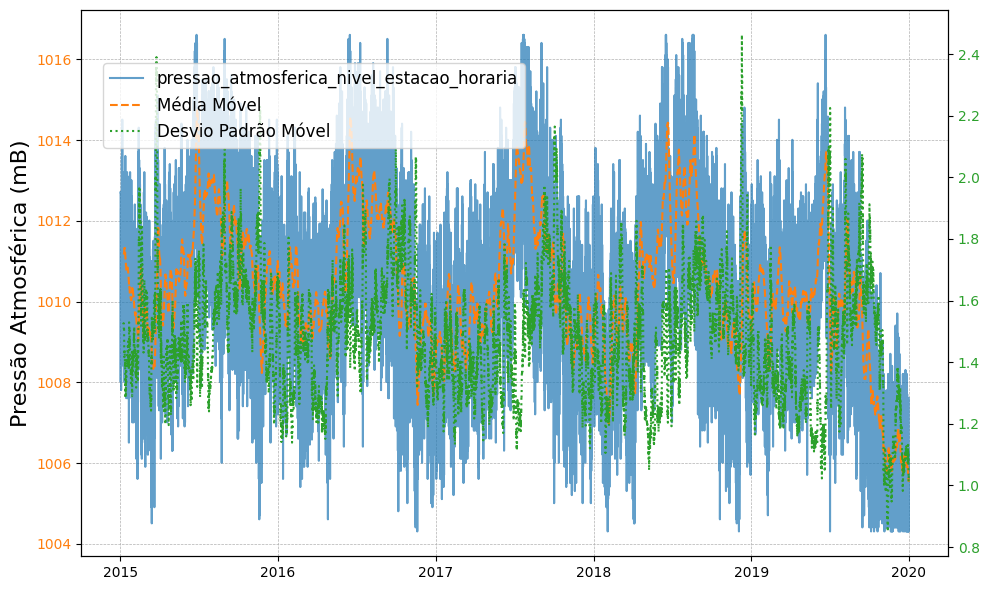

In [96]:
show_estat_moveis(data, variavel, label)

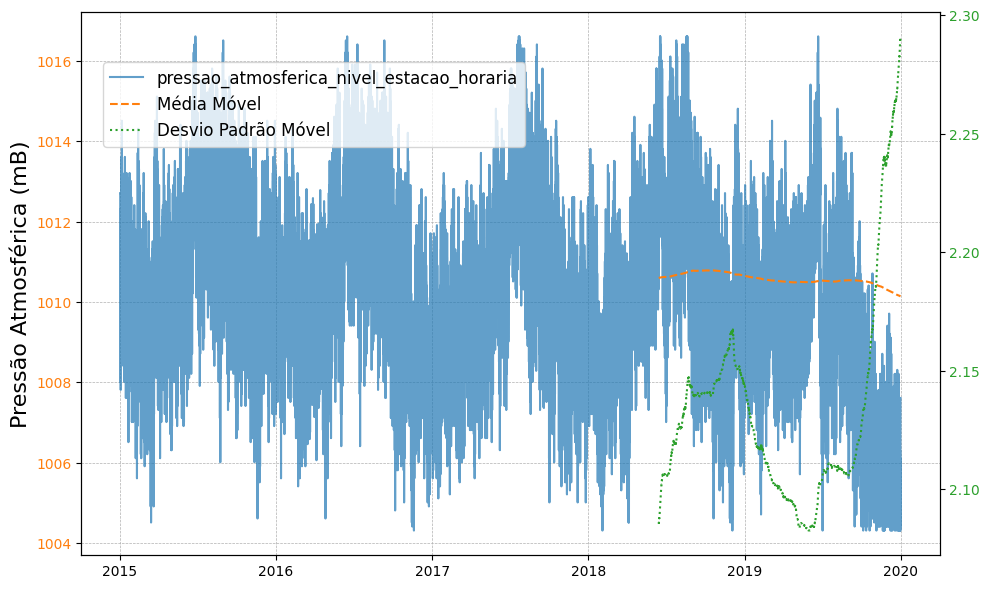

In [97]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

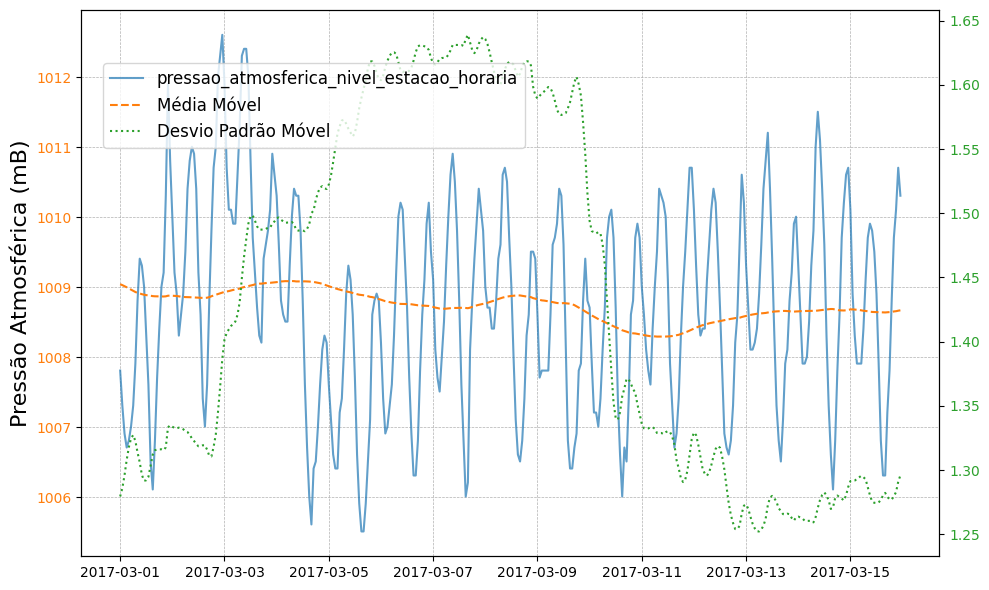

In [98]:
show_estat_moveis(data, variavel, label, inicio, fim)

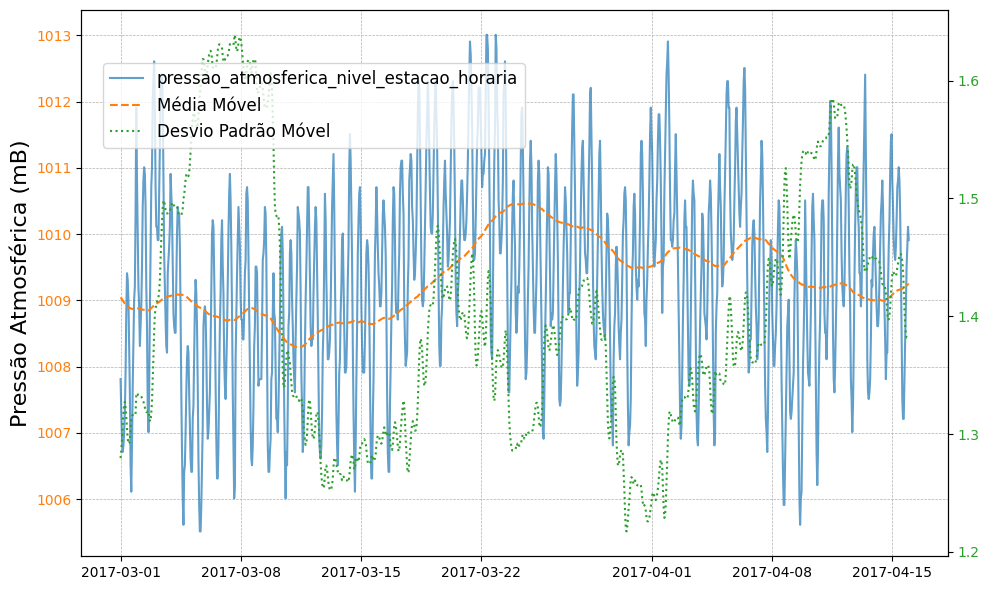

In [99]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Vemos a média móvel semanal com a sazonalidade anual esperada, porém se considerarmos uma janela maior, vemos que fica relativamente estável em 1001 mB

#### 2.5.5. Boxplot geral

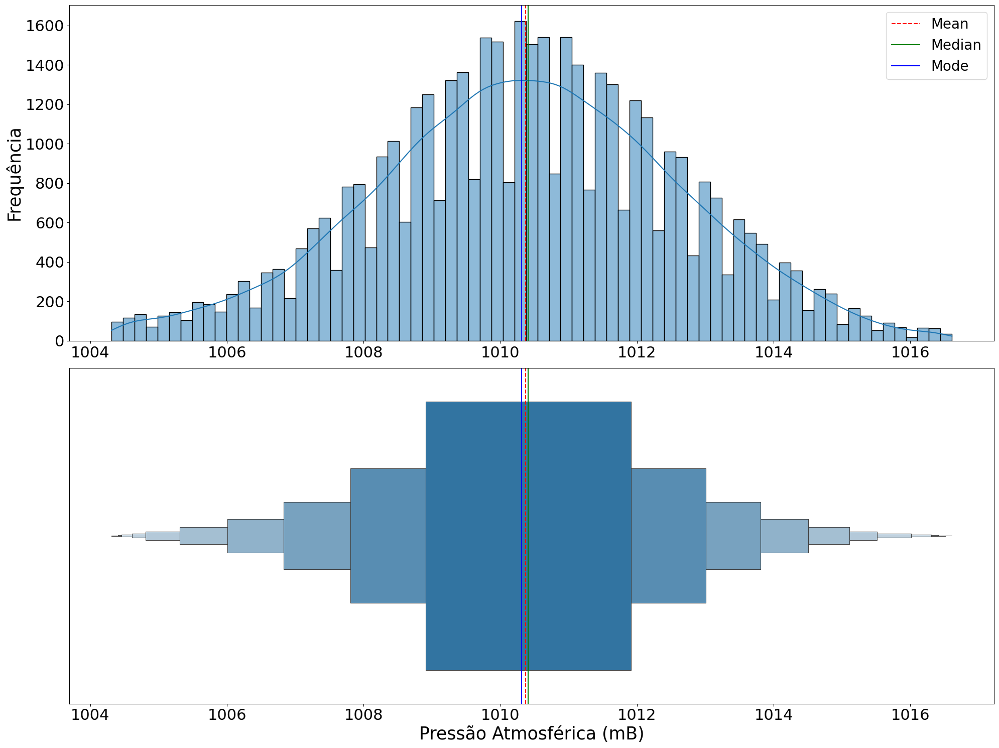

In [100]:
plota_boxplot_geral(data, variavel, label)

Identificamos o padrão de simetria esperado pelas estatísticas descritivas e média-mediana e moda bem próximas

#### 2.5.6. Boxplot por semana e hora do dia

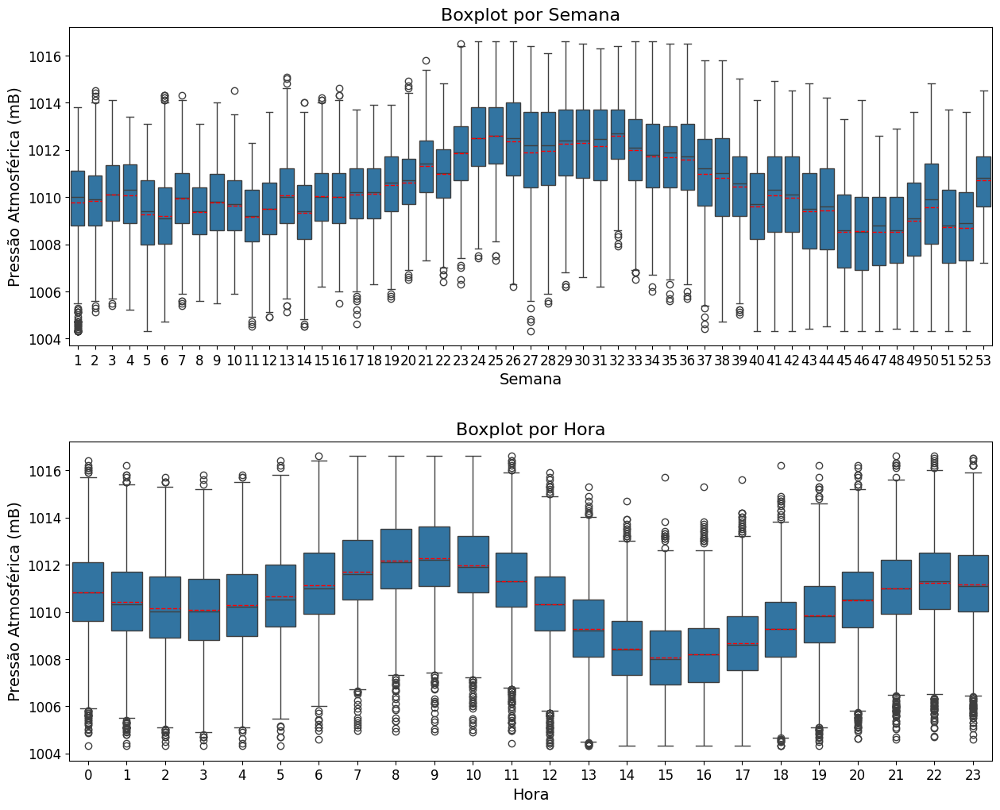

In [101]:
plota_boxplot_semana_hora(data, variavel, label)

Identificamos maiores valores de Pressão Atmosféricas no meio do ano e próximo às 9h da manhã. Menores valores são observados nos meses de outurbo-novembro e no final da tarde.

#### 2.5.7. Teste de Estacionariedade (Dickey-Fuller)

In [102]:
dickey_fuller(data, variavel)

MissingDataError: exog contains inf or nans

In [190]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [191]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Vemos a estacionariedade dos dados desde o primeiro teste

#### 2.5.8. Decomposição em Tendência e Sazonalidade

##### 2.5.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [103]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

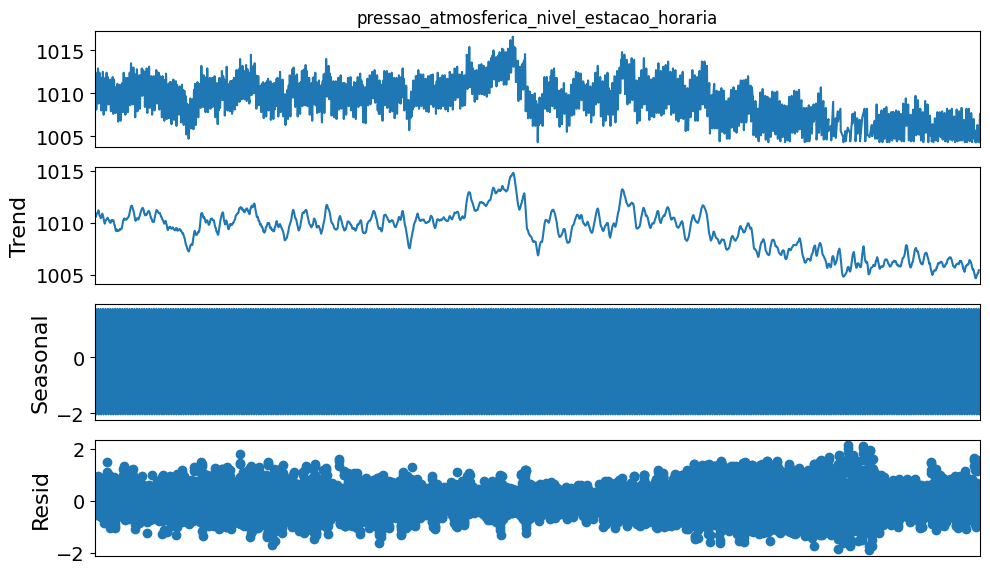

In [104]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.5.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [105]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

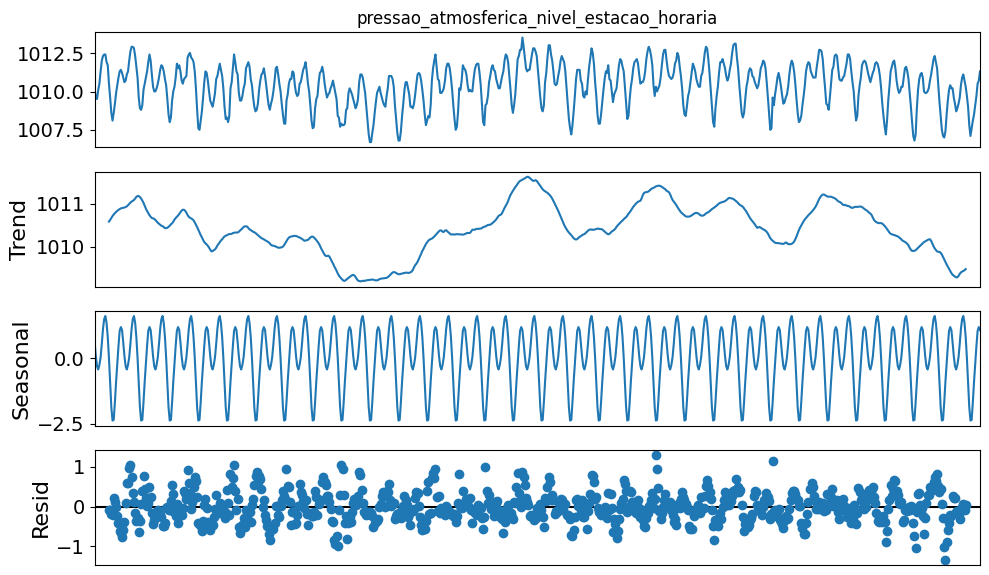

In [106]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.5.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [107]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

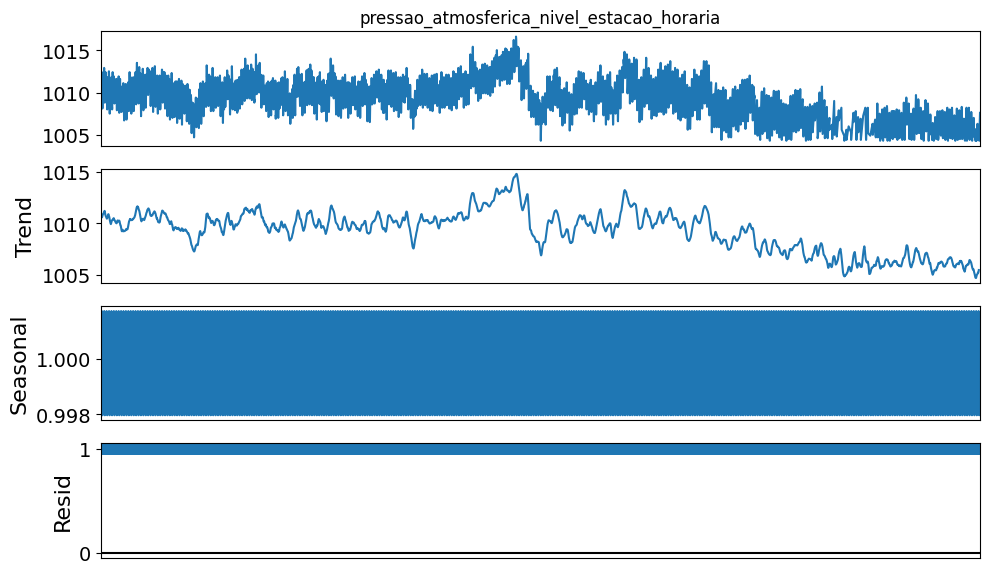

In [108]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.5.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [109]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

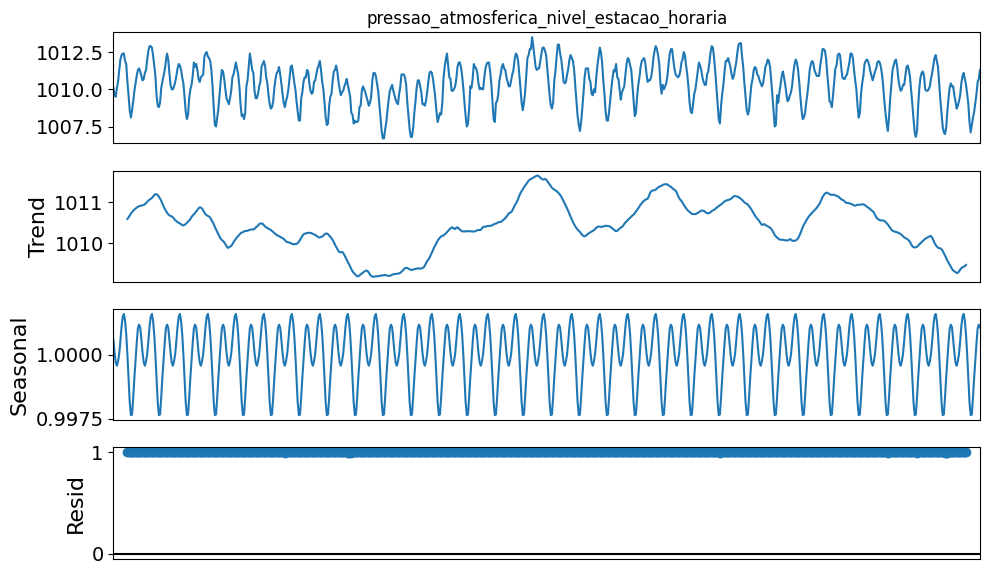

In [110]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.5.9. Análise de Autocorrelação

/Users/mateusalbuquerque/opt/anaconda3/envs/mba_usp/lib/python3.11/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


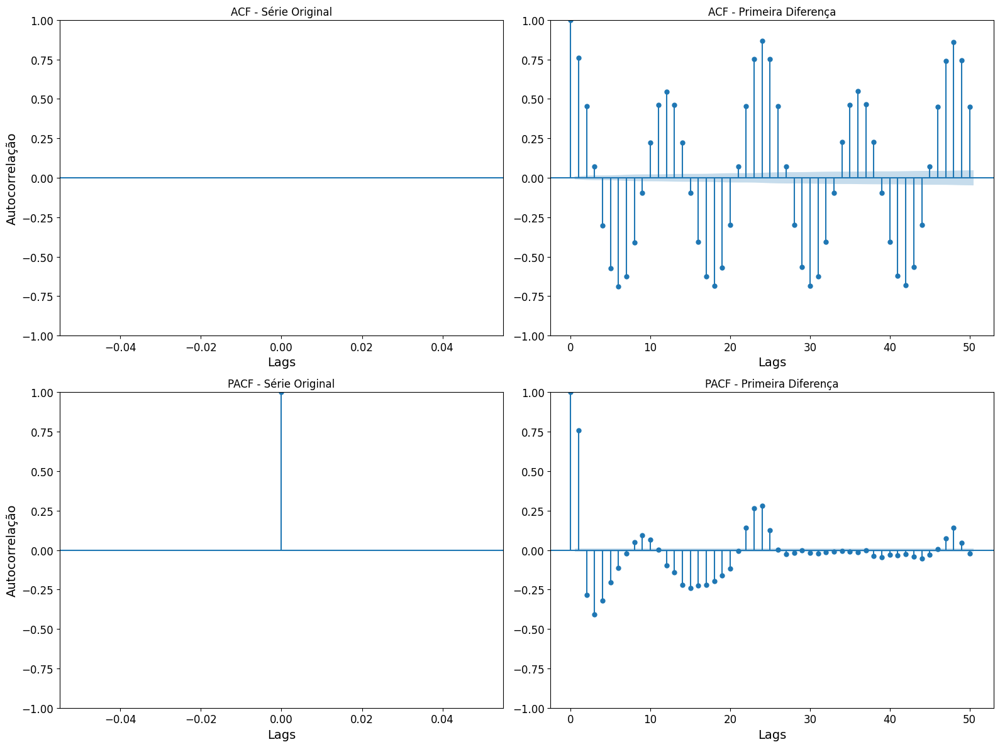

In [111]:
plot_acf_pacf(data, variavel)

Vemos o padrão sazonal dos dados

In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.6. Temperatura do Ar - EDA univariada

In [113]:
variavel = "temperatura_ar_bulbo_seco_horaria"
label = "Temperatura do Ar (°C)"

#### 2.6.1 Estatísticas descritivas

In [114]:
data[variavel].describe()

count    43824.000000
mean        28.071093
std          3.416470
min         19.410000
25%         25.410000
50%         27.510000
75%         30.610000
max         44.810000
Name: temperatura_ar_bulbo_seco_horaria, dtype: float64

Vemos dados concentrados em torno de 26-27 graus com média bem próxima da variância. Temperatura mínima e máxima fazem sentido. Variação de 4,2 graus

#### 2.6.2. Coeficiente de Variação

In [115]:
print(calcula_cv(data, variavel))

12.170776988349541


Identificamos uma forte dispersão dos dados

#### 2.6.3. Visualização de perfil

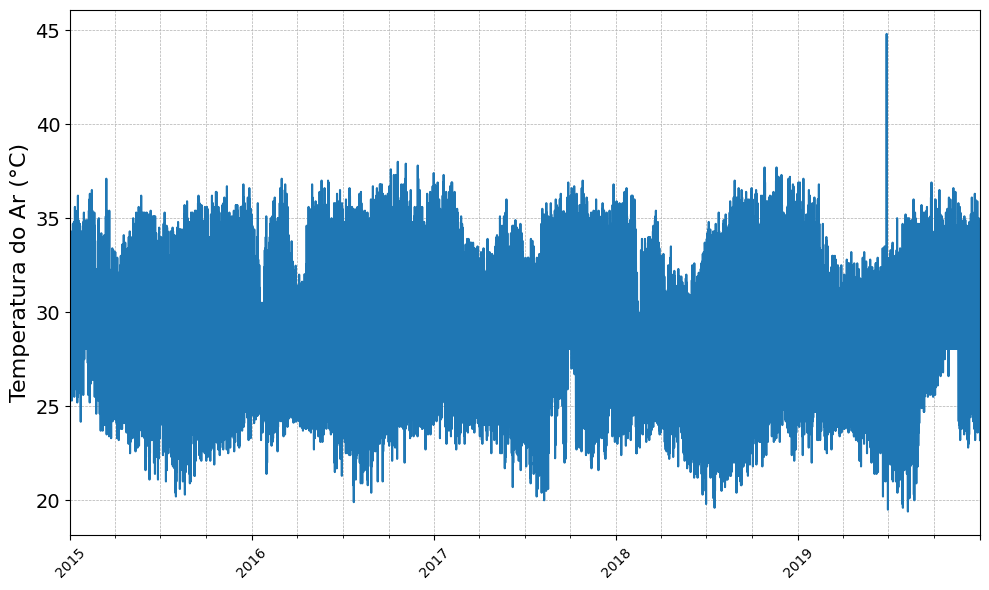

In [116]:
plota_perfil_geral(data, variavel, label)

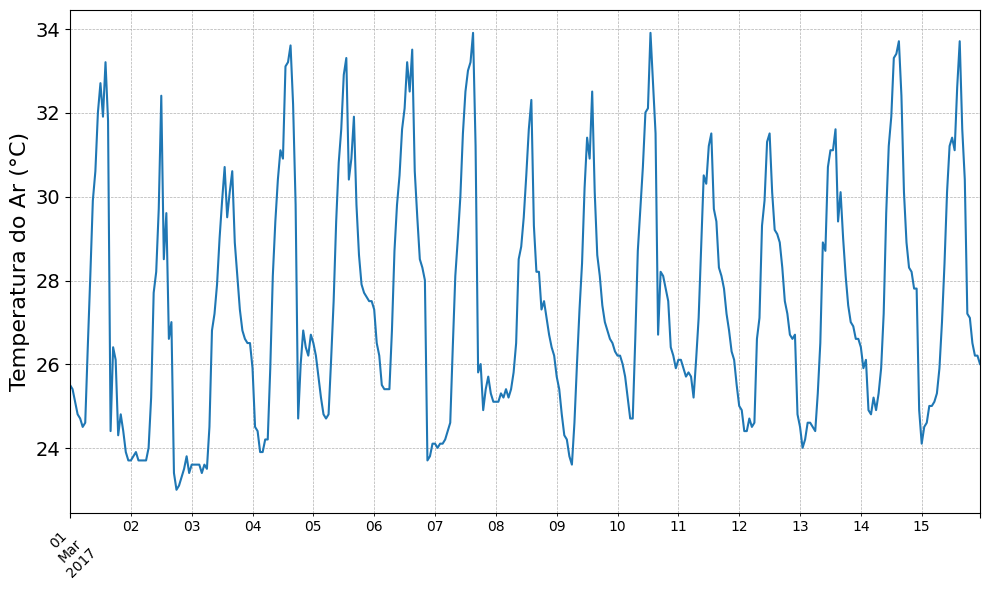

In [117]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual aparente dos dados, com uma segunda sazonalidade diária, quando olhamos no detalhe, padrão comum para variáveis atmosféricas

#### 2.6.4. Média móvel e desvio padrão móvel

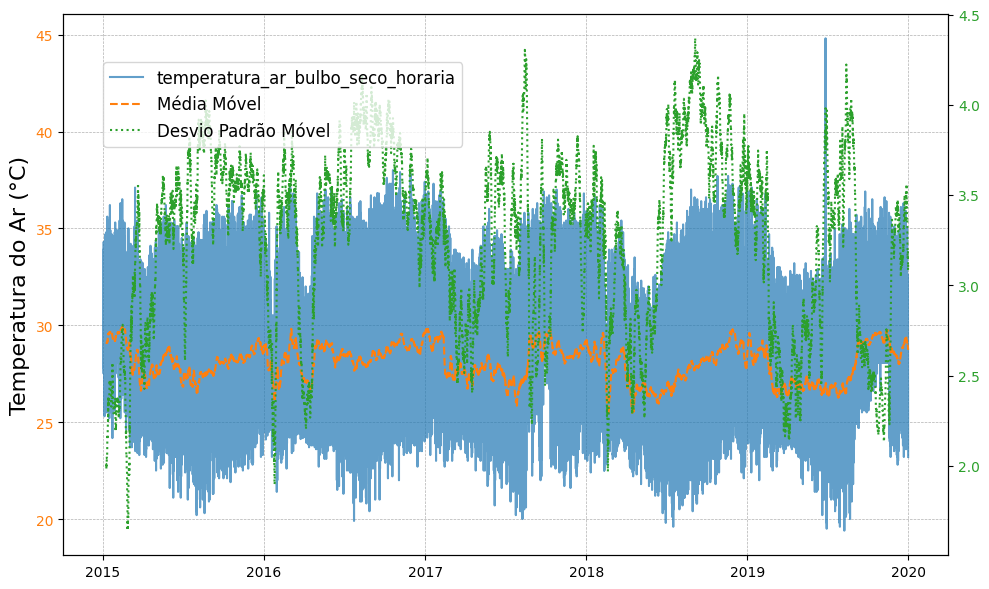

In [118]:
show_estat_moveis(data, variavel, label)

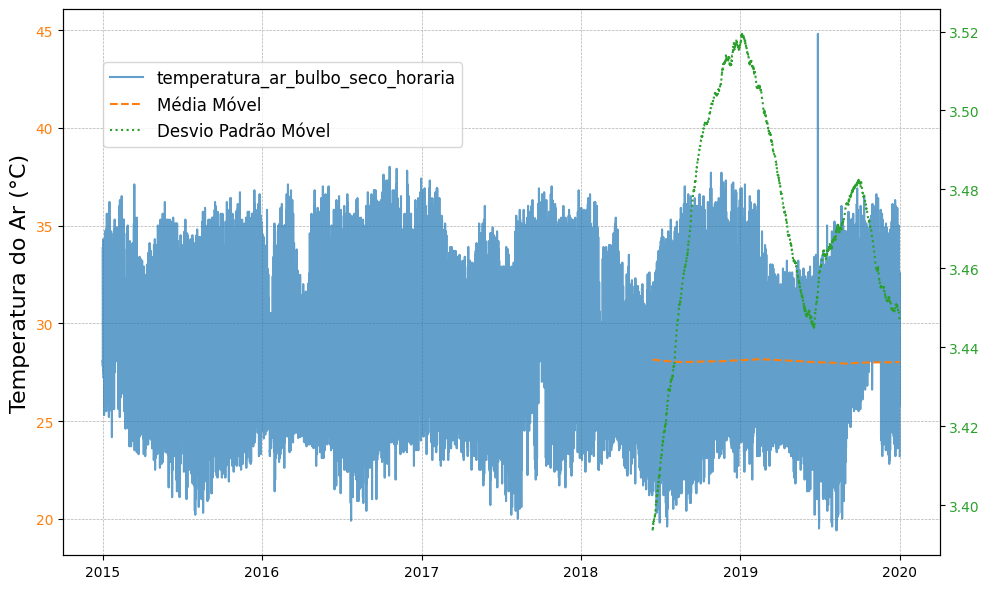

In [119]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

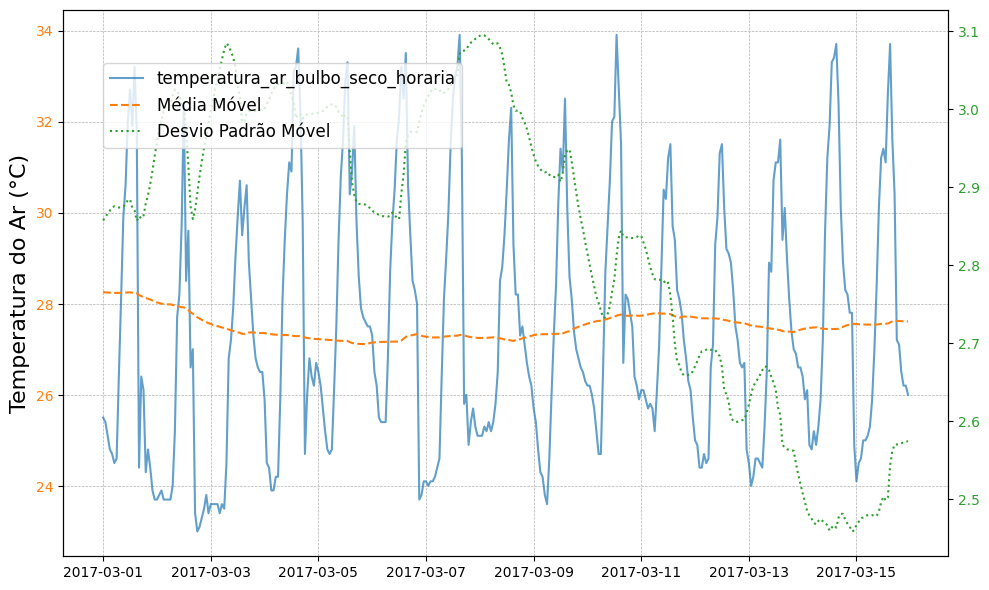

In [120]:
show_estat_moveis(data, variavel, label, inicio, fim)

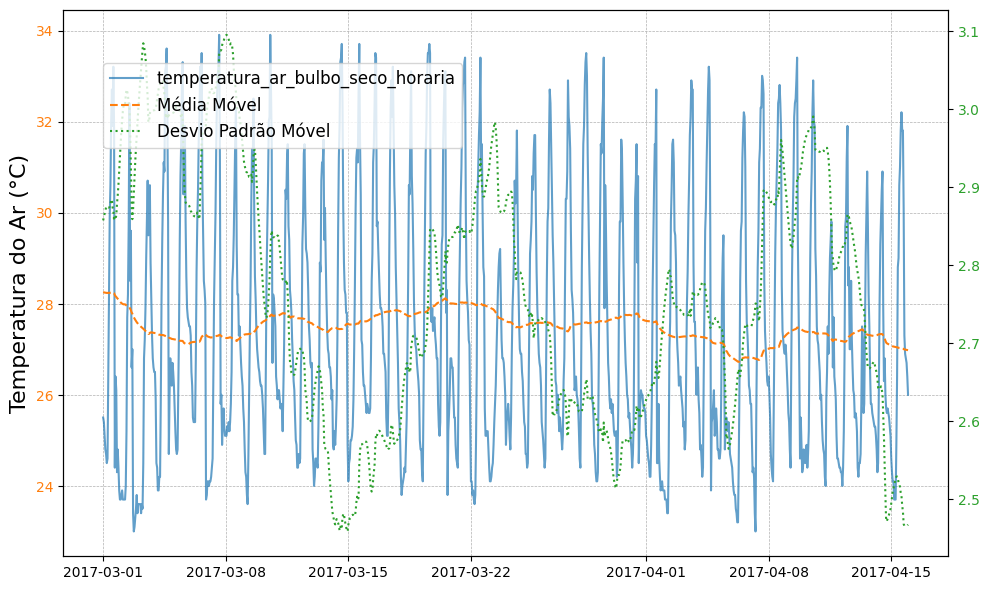

In [121]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Vemos a média móvel semanal com a sazonalidade anual esperada, porém se considerarmos uma janela maior, vemos que fica relativamente estável em 28 graus, aproximadamente

#### 2.6.5. Boxplot geral

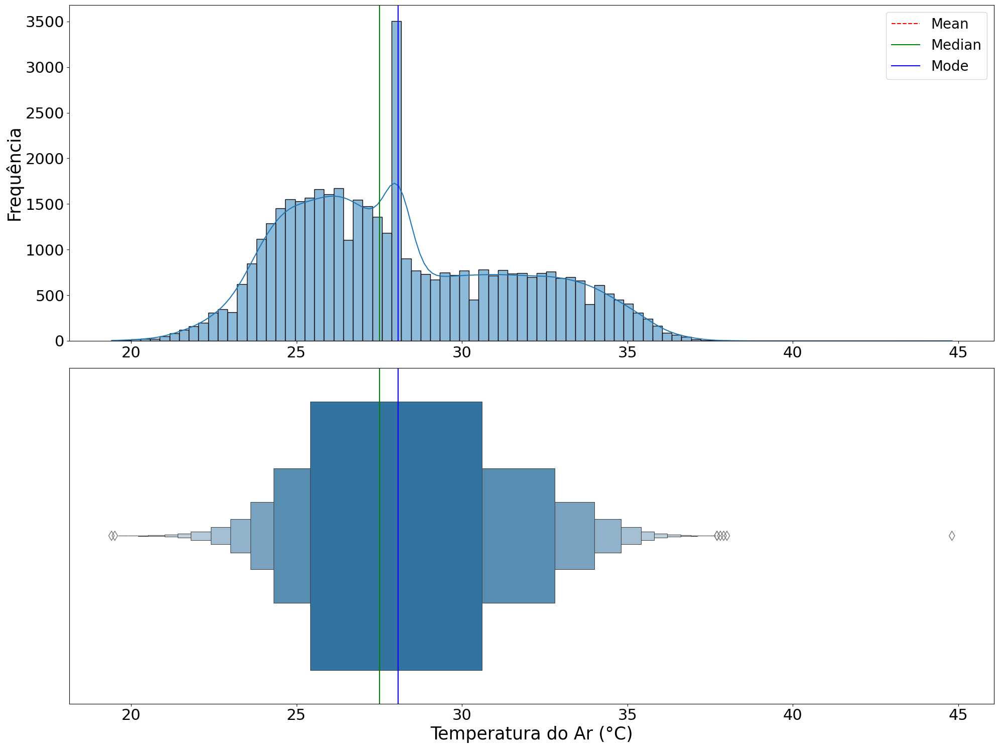

In [122]:
plota_boxplot_geral(data, variavel, label)

Vemos claramente a assimetria dos dados com uma mediana menor do que a média e uma moda ainda menor. Vemos também a dispersão destes.

#### 2.6.6. Boxplot por semana e hora do dia

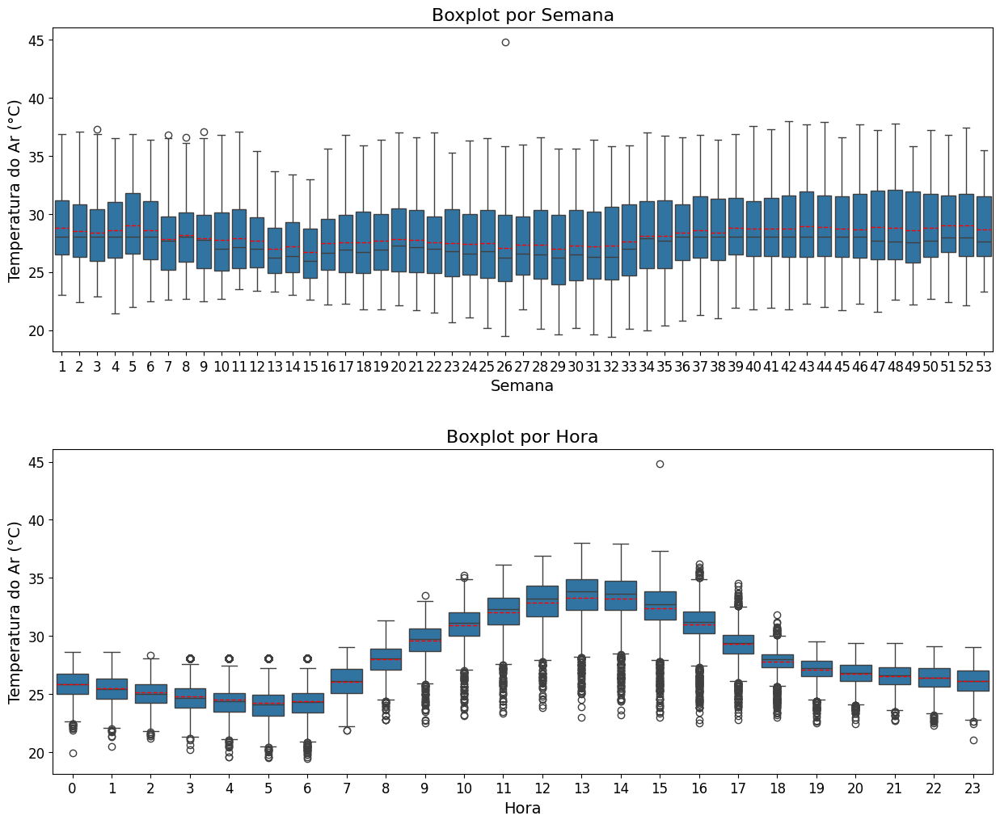

In [123]:
plota_boxplot_semana_hora(data, variavel, label)

Identificamos a média de temperatura relativamente estável durante todo o ano com uma maior variabilidade no segundo semestre. Vemos maiores temperaturas no período da tarde, onde temos menor pressão atmosférica também.

#### 2.6.7. Teste de Estacionariedade (Dickey-Fuller)

In [124]:
dickey_fuller(data, variavel)

ADF Statistic: -11.758138
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [125]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -50.892012
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [126]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -63.710835
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


#### 2.6.8. Decomposição em Tendência e Sazonalidade

##### 2.6.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [127]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

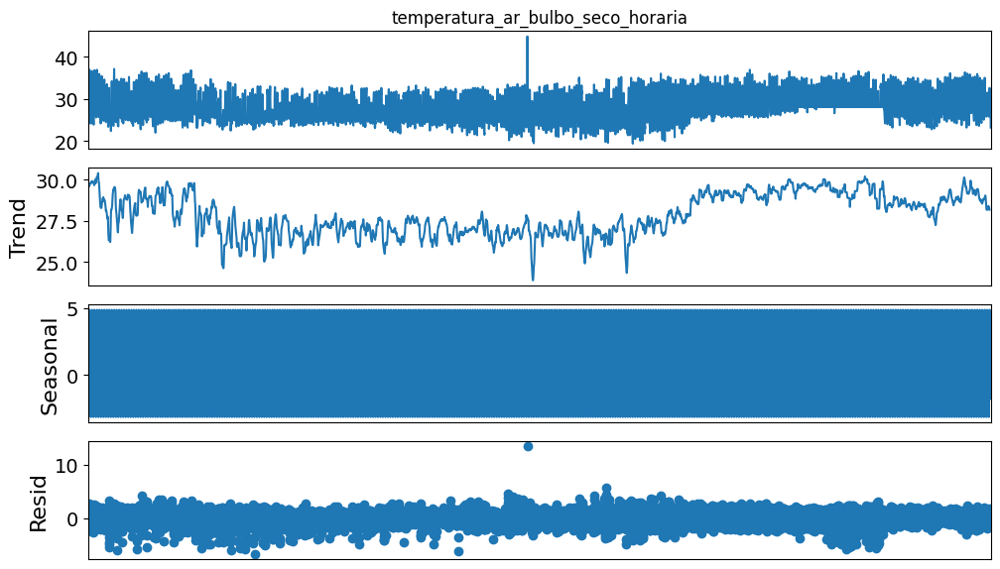

In [128]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.6.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [129]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

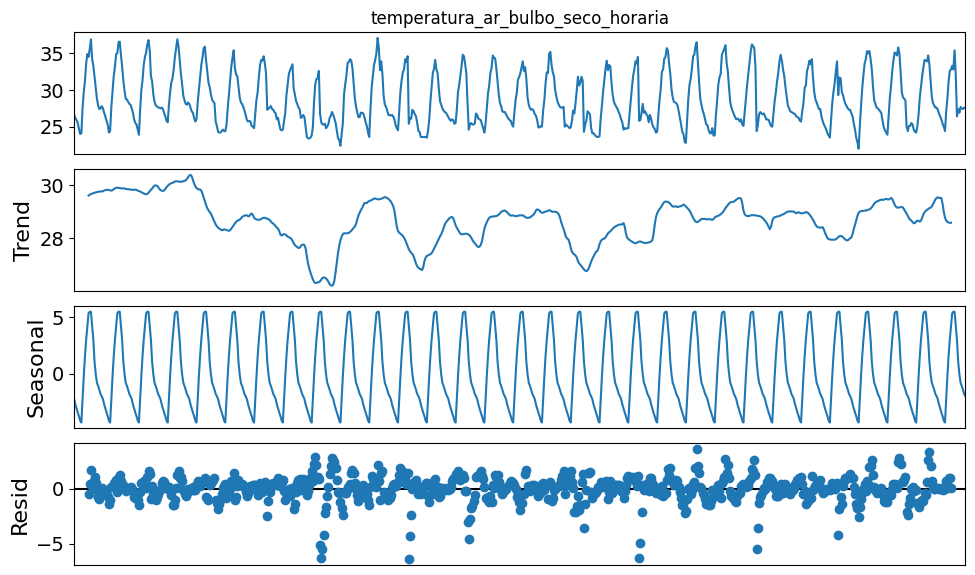

In [130]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.6.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [131]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

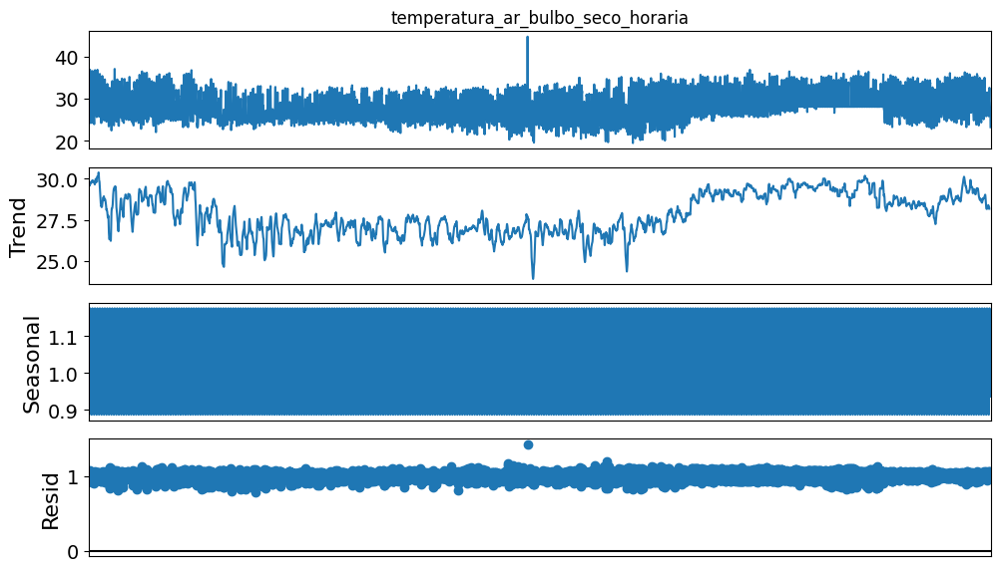

In [132]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.6.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [133]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

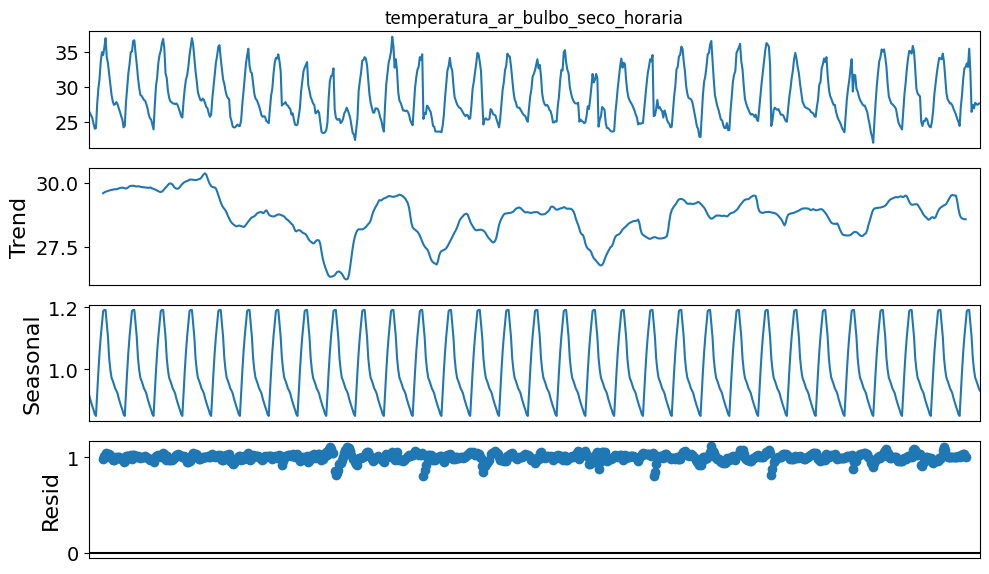

In [134]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

O modelo multiplicativo apresenta menores resíduos. Vemos a tendência de crescimento da temperatura anual e a sazonalidade diária

#### 2.6.9. Análise de Autocorrelação

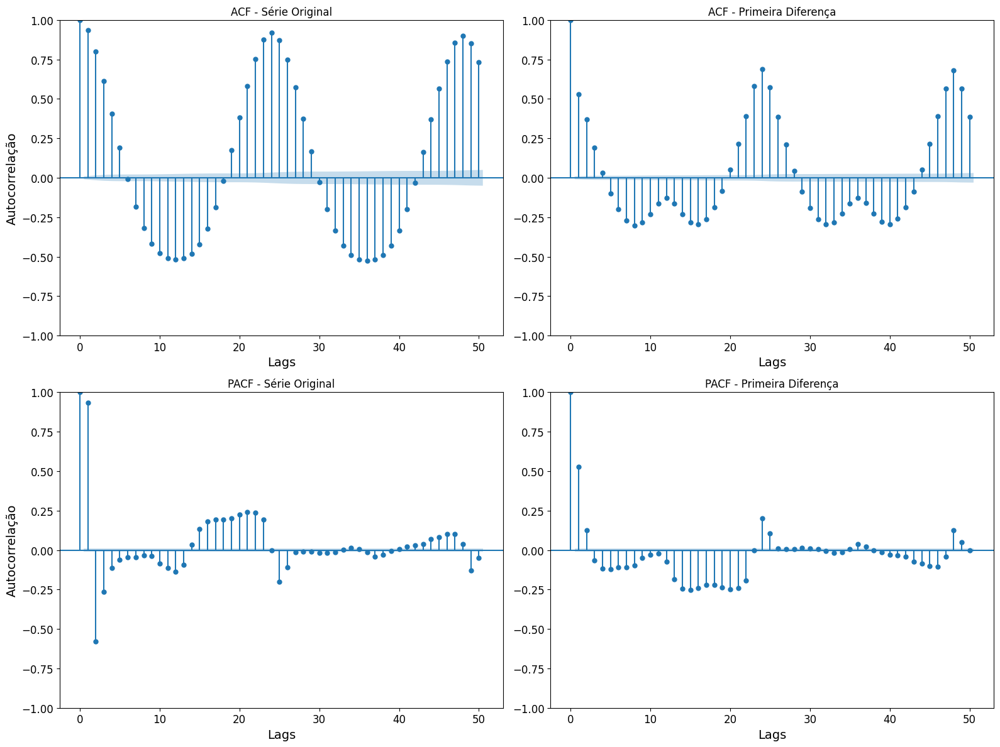

In [135]:
plot_acf_pacf(data, variavel)

Vemos o padrão sazonal dos dados

In [136]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.7. Umidade Relativa do Ar - EDA univariada

In [137]:
variavel = "umidade_relativa_ar_horaria"
label = "Umidade Relativa do Ar (%)"

#### 2.7.1 Estatísticas descritivas

In [138]:
data[variavel].describe()

count    43824.000000
mean        65.314377
std         17.162530
min         14.010000
25%         53.010000
50%         67.010000
75%         78.010000
max        100.010000
Name: umidade_relativa_ar_horaria, dtype: float64

Média menor que a mediana, logo, assimetria da distribuição. Discrepância entre mínimo e máximo e grande desvio padrão, indicando alta variabilidade.

#### 2.7.2. Coeficiente de Variação

In [139]:
print(calcula_cv(data, variavel))

26.276803650273163


Alta variabilidade da distribuição.

#### 2.7.3. Visualização de perfil

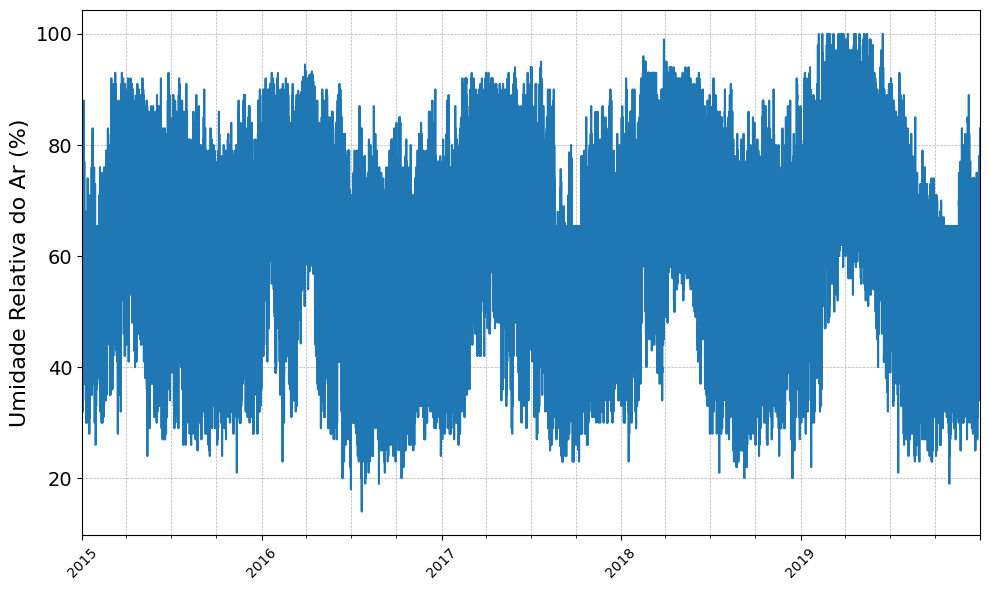

In [140]:
plota_perfil_geral(data, variavel, label)

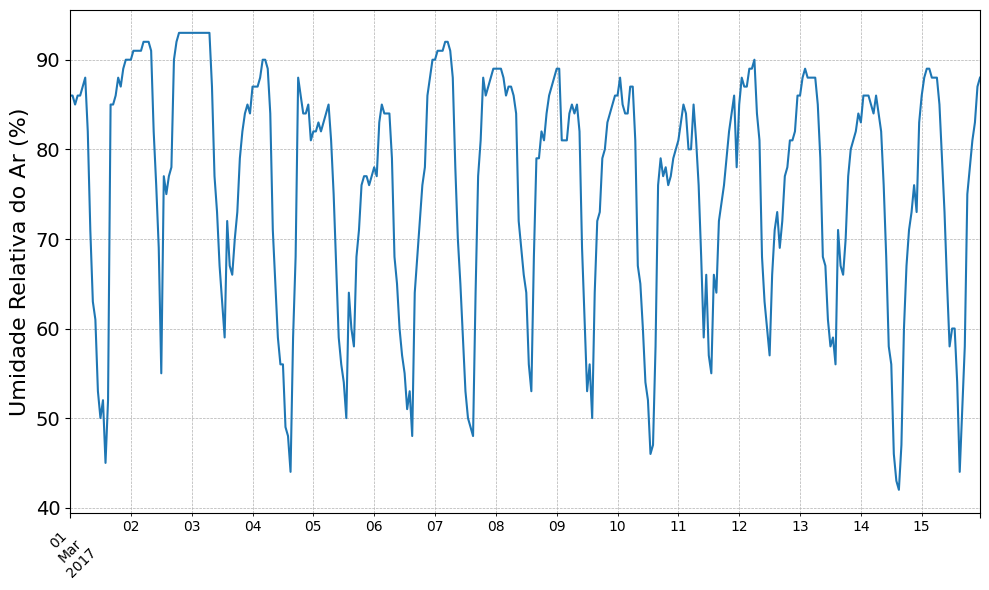

In [141]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual aparente dos dados, com uma segunda sazonalidade diária, quando olhamos no detalhe, padrão comum para variáveis atmosféricas

#### 2.7.4. Média móvel e desvio padrão móvel

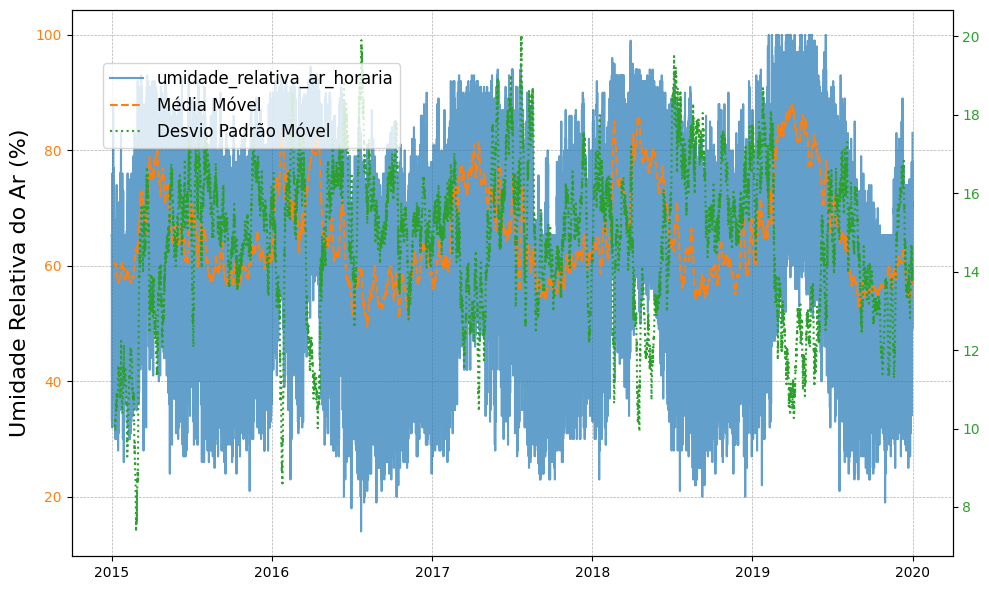

In [142]:
show_estat_moveis(data, variavel, label)

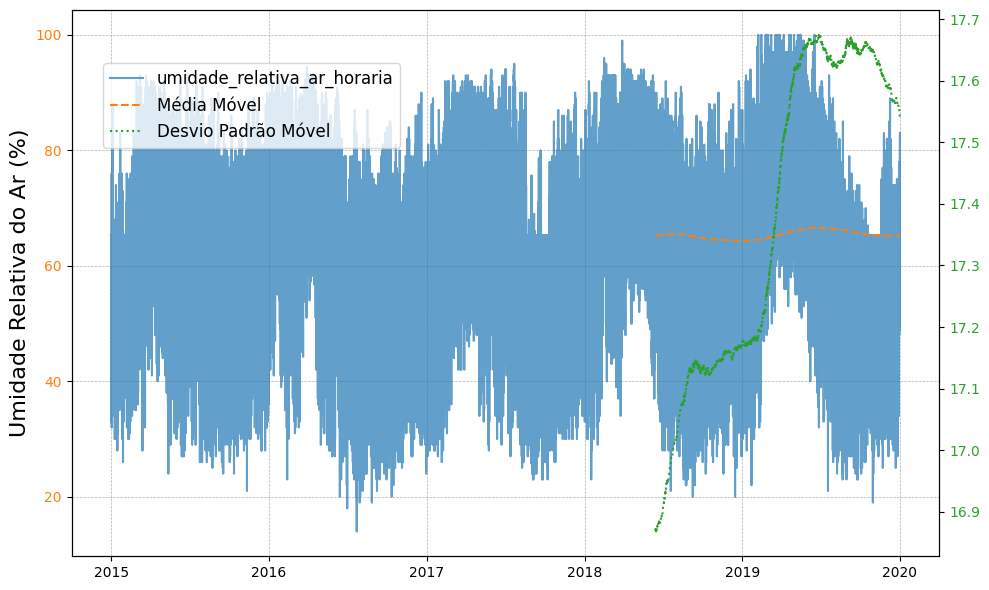

In [143]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

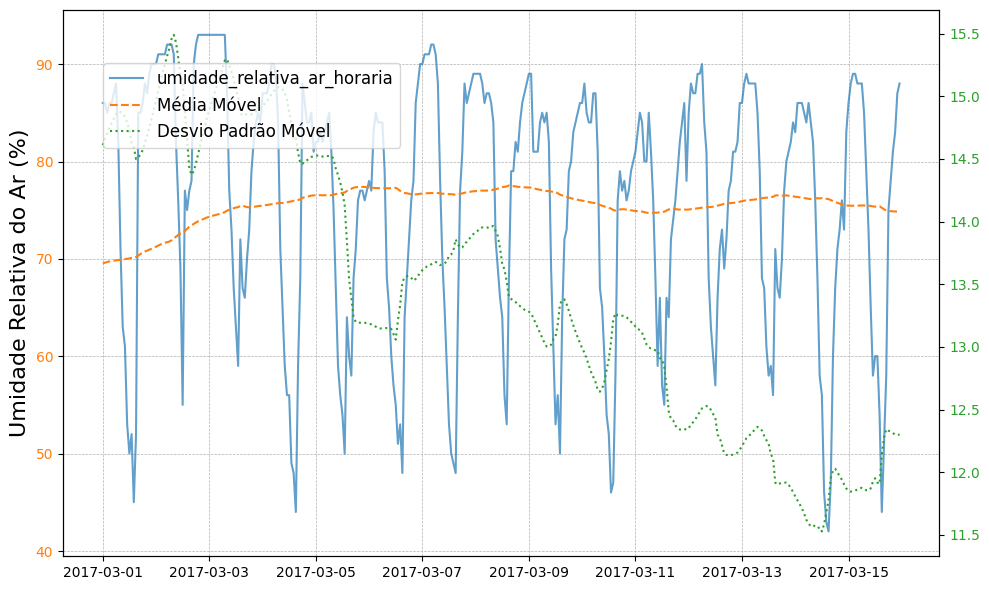

In [144]:
show_estat_moveis(data, variavel, label, inicio, fim)

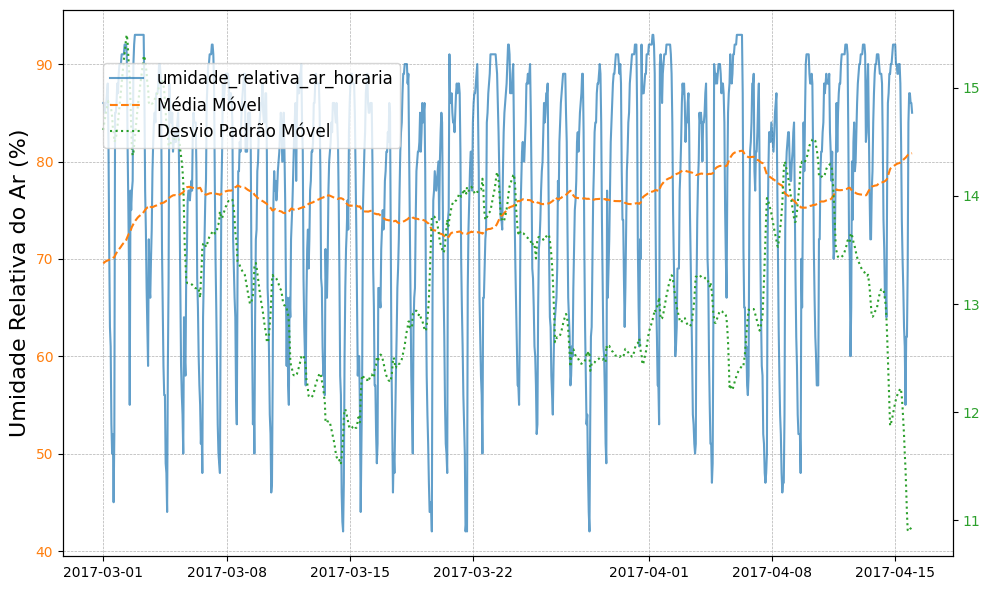

In [145]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Vemos a média móvel semanal com a sazonalidade anual esperada, porém se considerarmos uma janela maior, vemos que fica relativamente estável em 75%, aproximadamente

#### 2.7.5. Boxplot geral

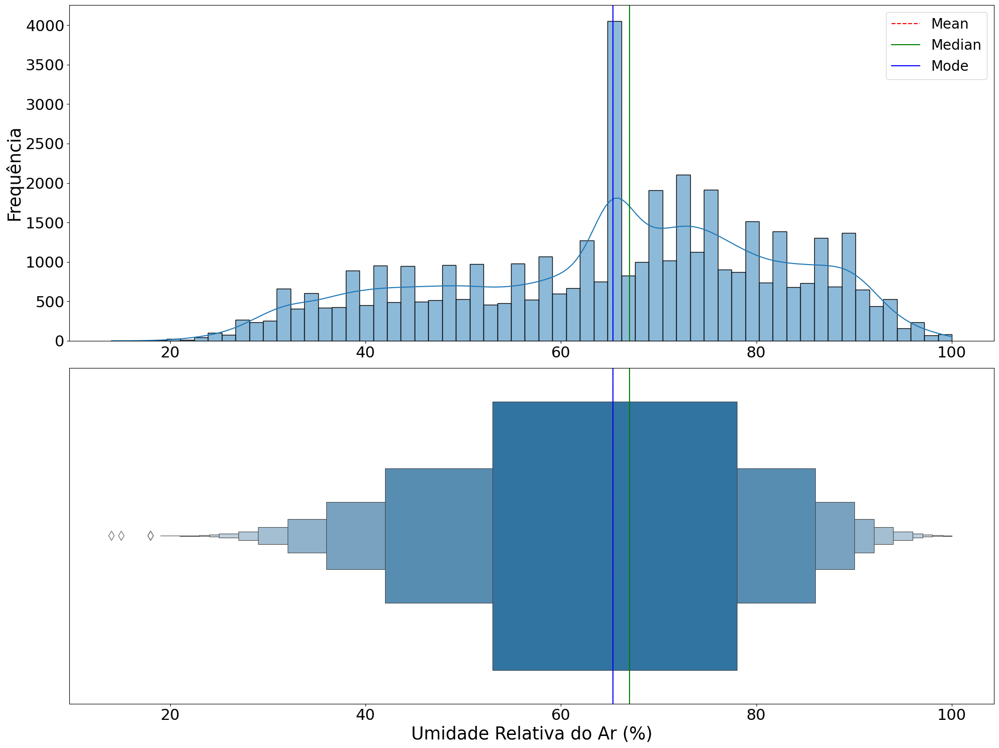

In [146]:
plota_boxplot_geral(data, variavel, label)

Vemos claramente a assimetria dos dados (contrária à temperatura) com uma mediana maior do que a média e uma moda ainda maior. Vemos também a dispersão destes.

#### 2.7.6. Boxplot por semana e hora do dia

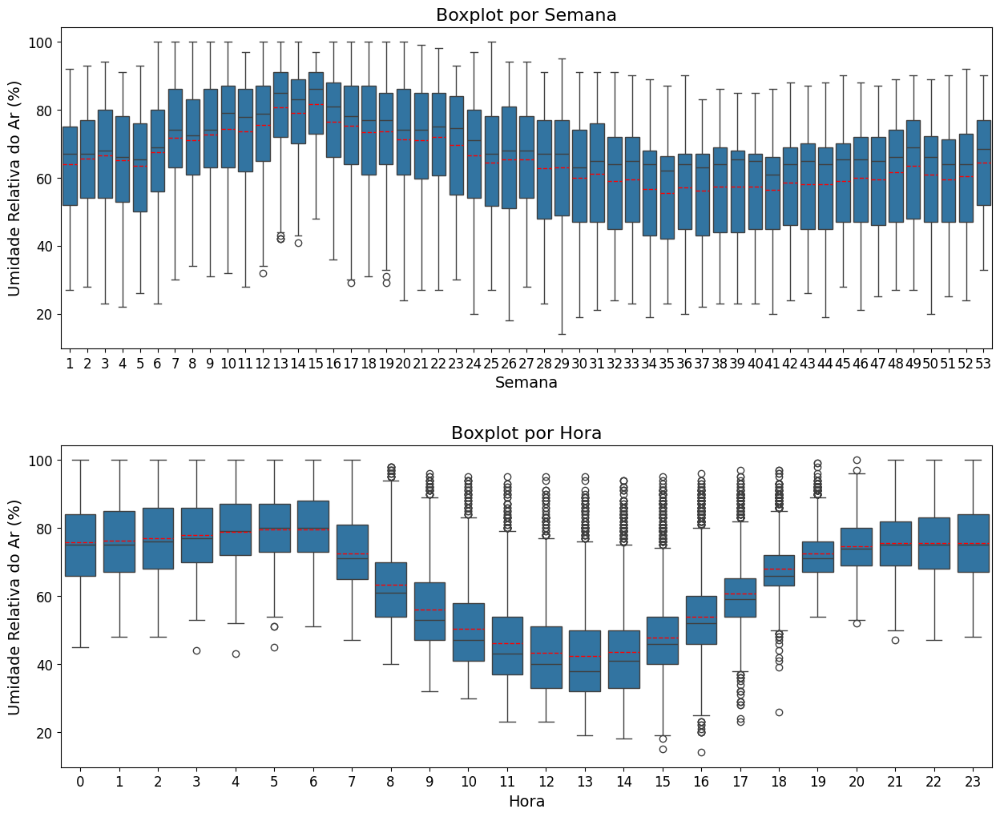

In [147]:
plota_boxplot_semana_hora(data, variavel, label)

Identificamos a média de umidade relativamente estável durante todo o ano com uma maior variabilidade no segundo semestre e maiores valores no primeiro semestre. Vemos menores umidades no período da tarde, onde temos menor pressão atmosférica também.

#### 2.7.7. Teste de Estacionariedade (Dickey-Fuller)

In [148]:
dickey_fuller(data, variavel)

ADF Statistic: -9.391155
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [149]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -50.892012
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [150]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -63.710835
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Distribuição estacionária ou tendência-estacionária

#### 2.7.8. Decomposição em Tendência e Sazonalidade

##### 2.7.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [151]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

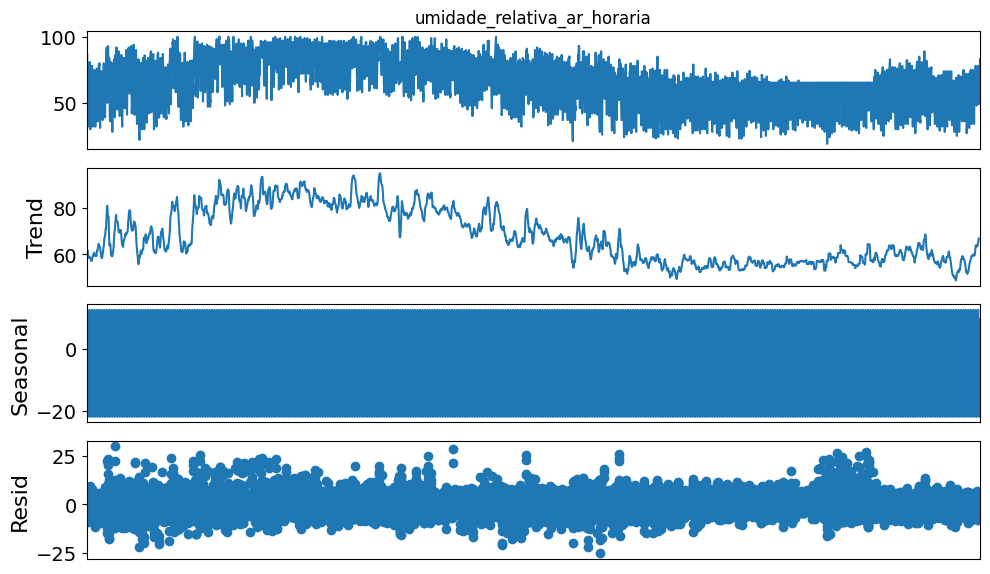

In [152]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.7.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [153]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

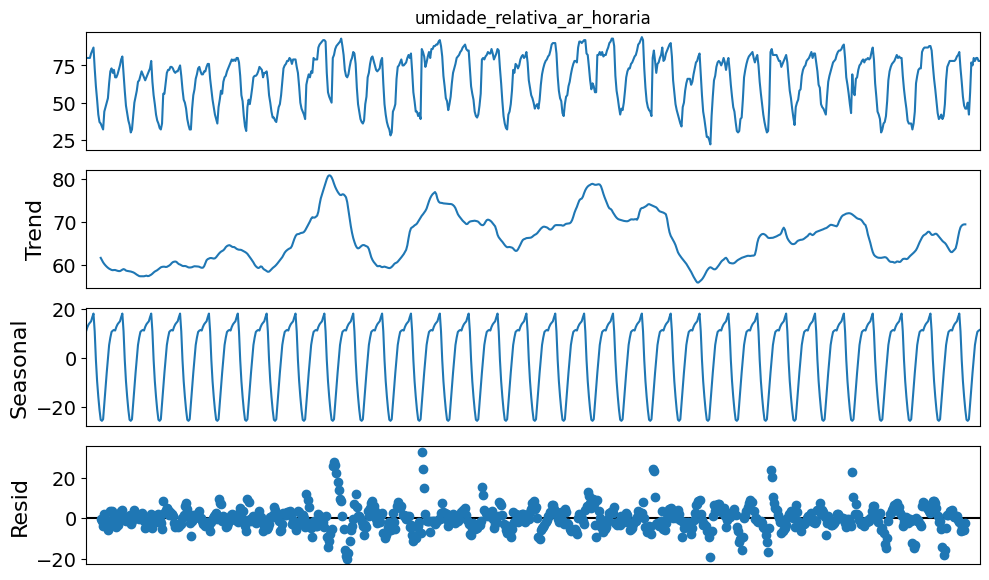

In [154]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.7.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [155]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

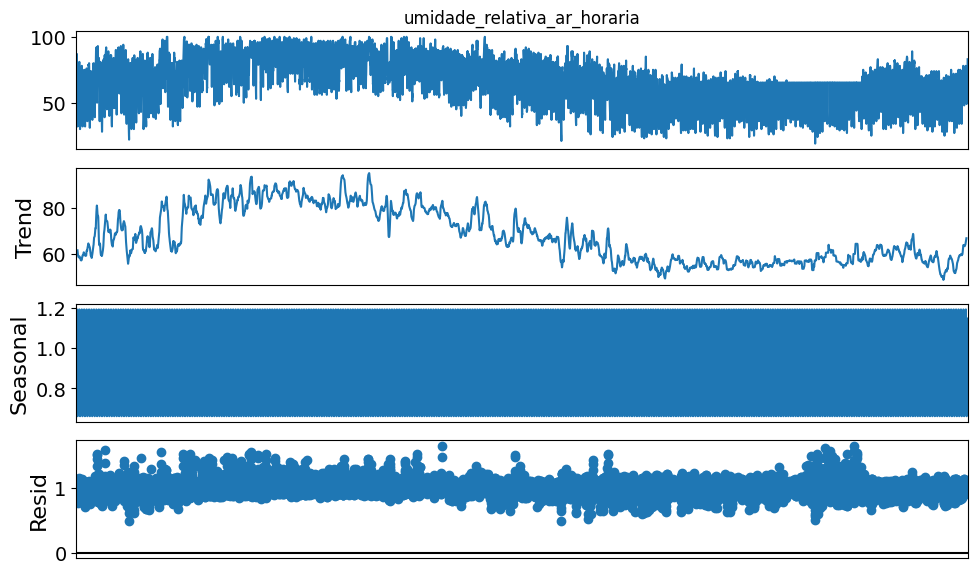

In [156]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.7.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [157]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

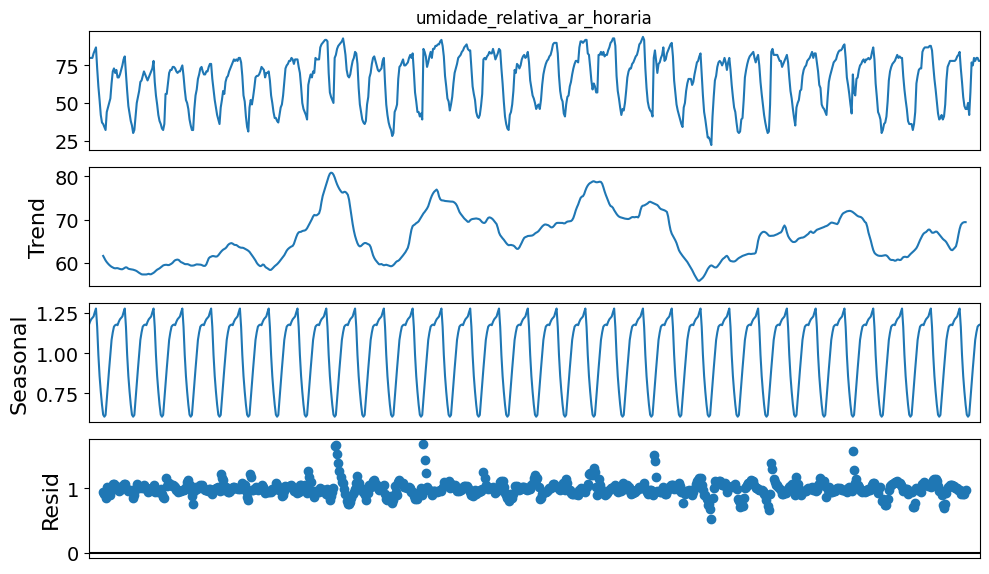

In [158]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Menores resíduos para o modelo multiplicativo
- Vemos a tendência de umidade maior no começo do ano e o padrão sazonal diário

#### 2.7.9. Análise de Autocorrelação

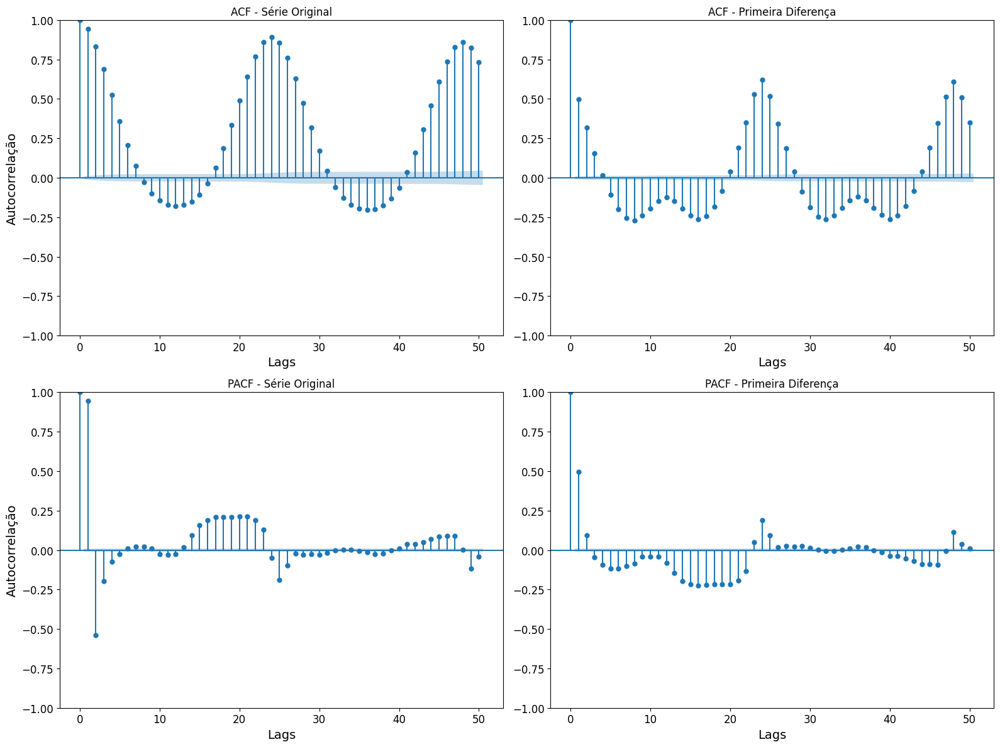

In [159]:
plot_acf_pacf(data, variavel)

Vemos o padrão sazonal dos dados

In [160]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.8. Direção do Vento - EDA univariada

In [161]:
variavel = "vento_direcao_horaria"
label = "Direção do Vento (°)"

#### 2.8.1 Estatísticas descritivas

In [162]:
data[variavel].describe()

count    43816.000000
mean        81.045556
std         52.292013
min          1.010000
25%         45.010000
50%         74.010000
75%        103.010000
max        344.010000
Name: vento_direcao_horaria, dtype: float64

- Média maior do que a mediana, logo distribuição assimétrica
- Desvio quase da magnitude da média => alta variabilidade

#### 2.8.2. Coeficiente de Variação

In [163]:
print(calcula_cv(data, variavel))

64.52175212418692


Alta variabilidade dos dados

#### 2.8.3. Visualização de perfil

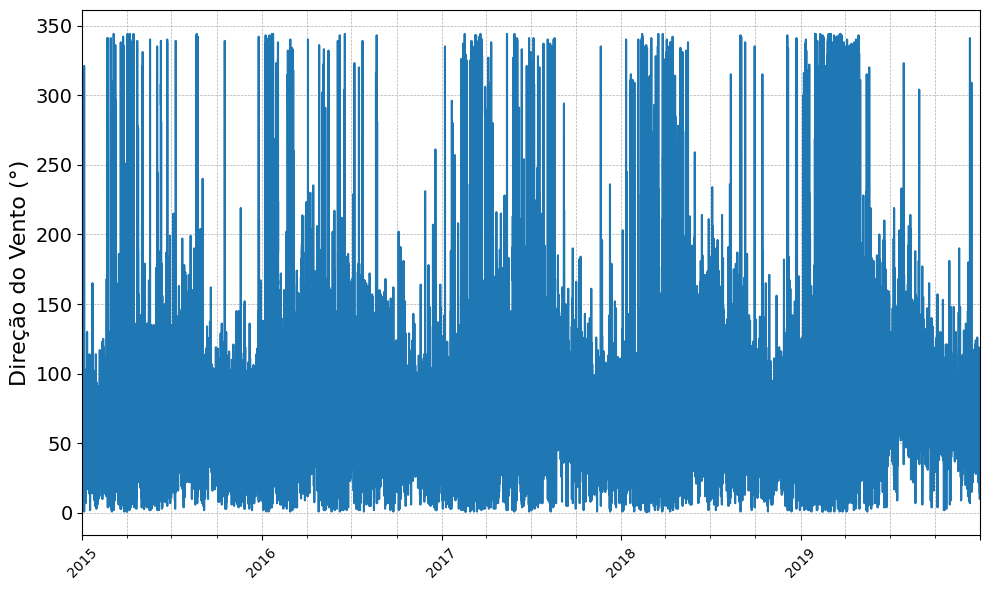

In [164]:
plota_perfil_geral(data, variavel, label)

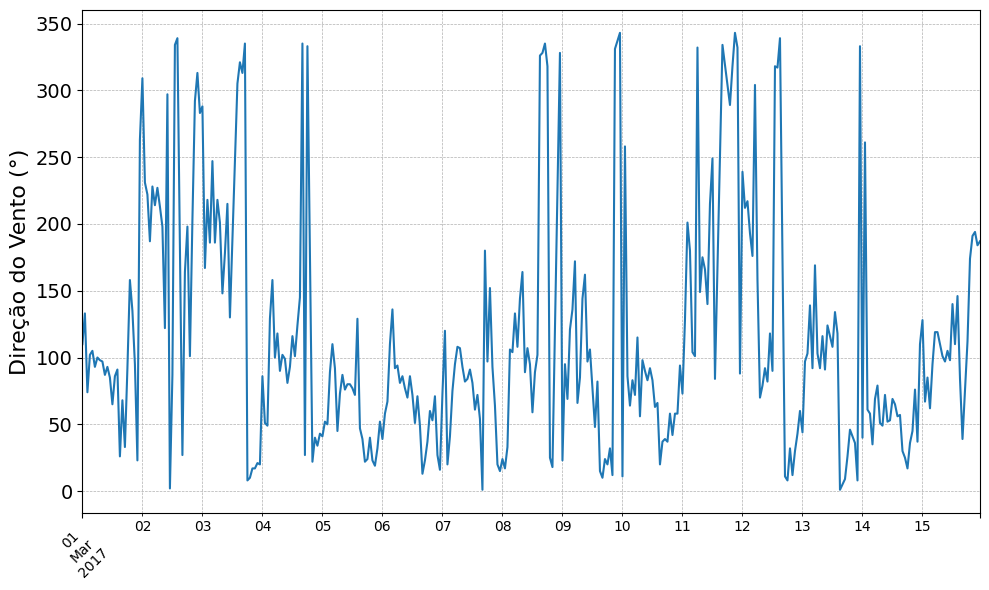

In [165]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

- Temos algum tipo de sazonalidade anual
- Não temos diária

#### 2.8.4. Média móvel e desvio padrão móvel

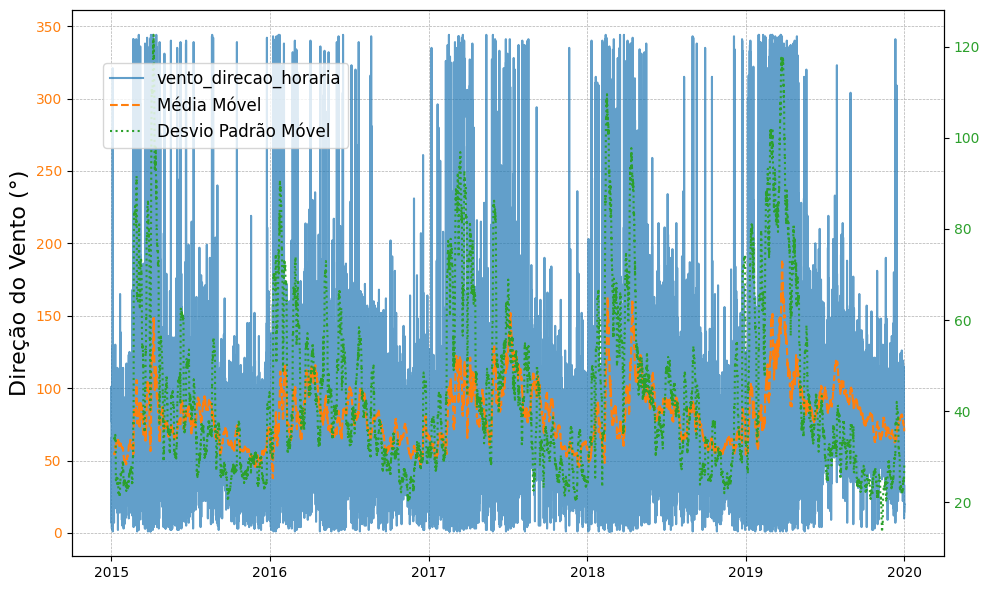

In [166]:
show_estat_moveis(data, variavel, label)

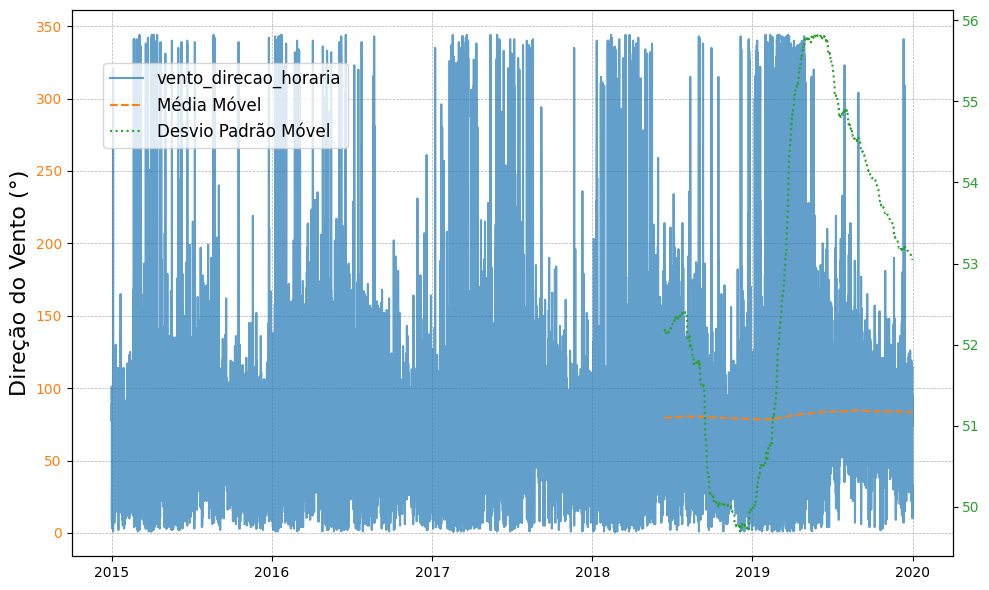

In [167]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

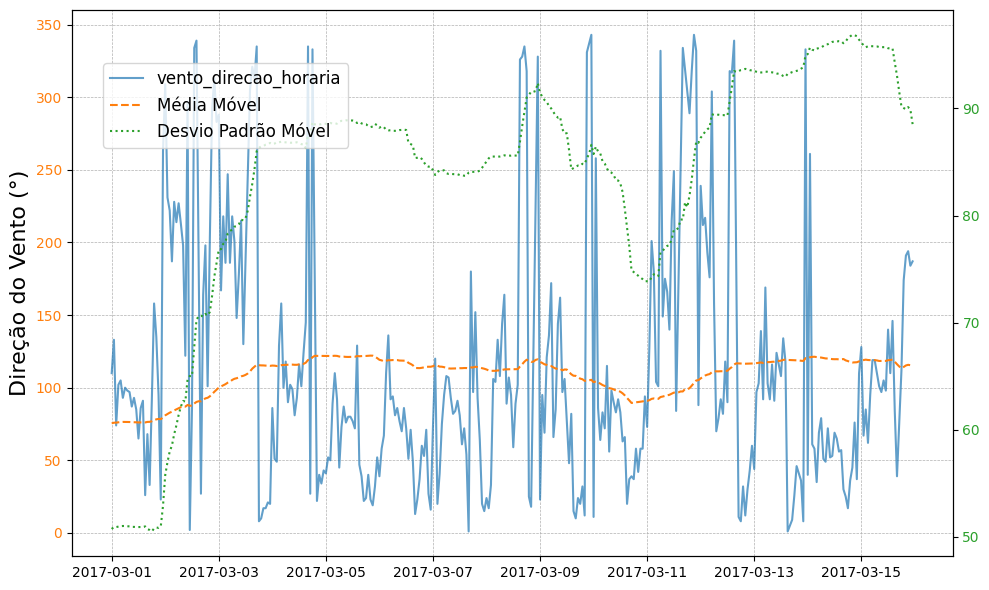

In [168]:
show_estat_moveis(data, variavel, label, inicio, fim)

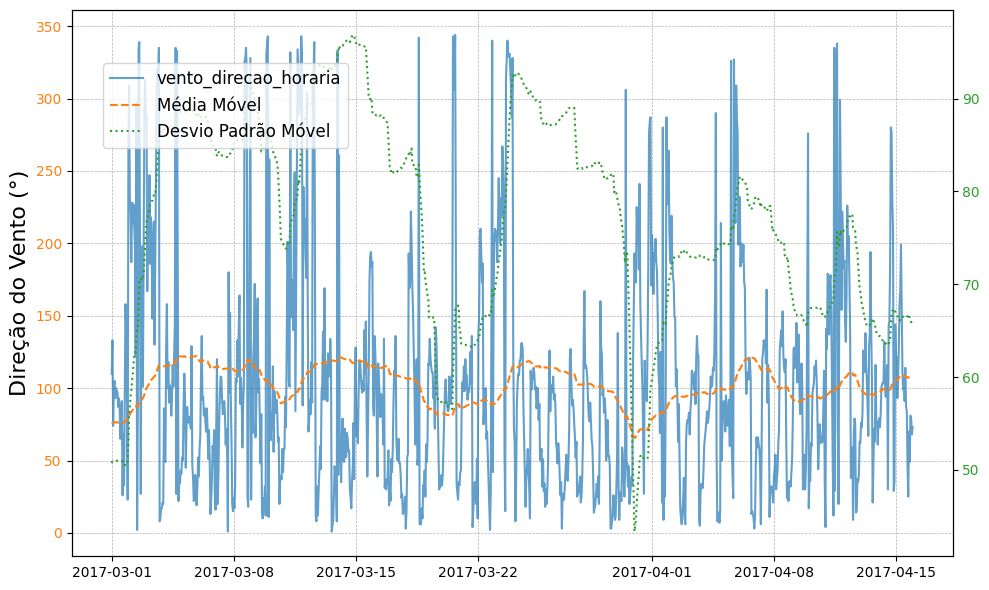

In [169]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

Média estável se considerarmos maior janela

#### 2.8.5. Boxplot geral

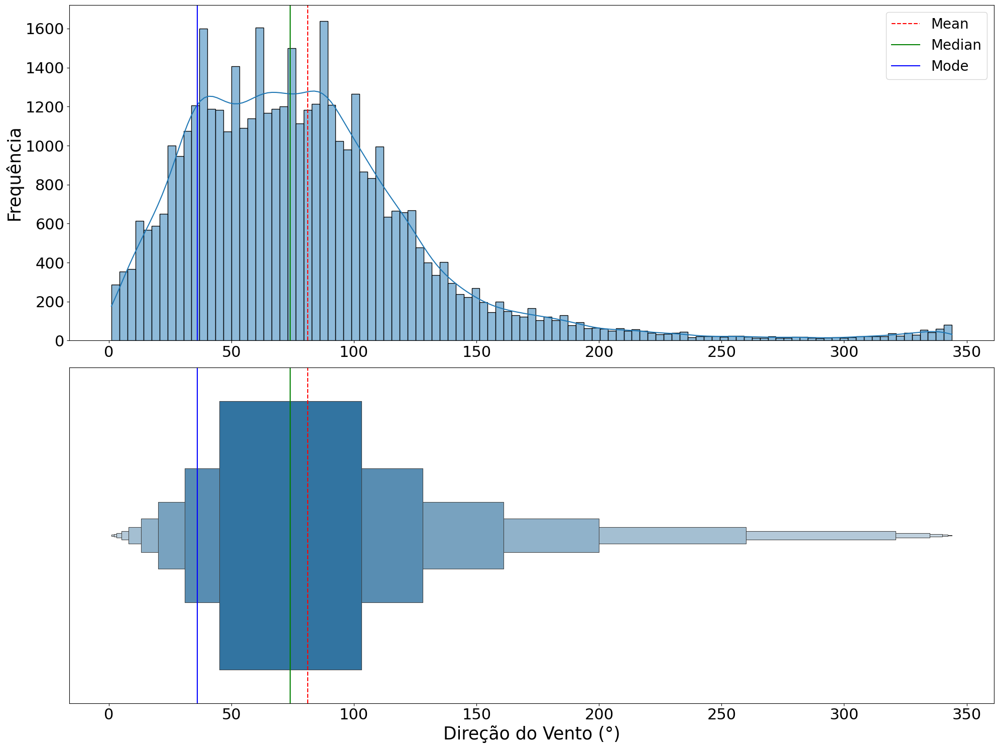

In [170]:
plota_boxplot_geral(data, variavel, label)

Confirmamos a assimetria da distribuição

#### 2.8.6. Boxplot por semana e hora do dia

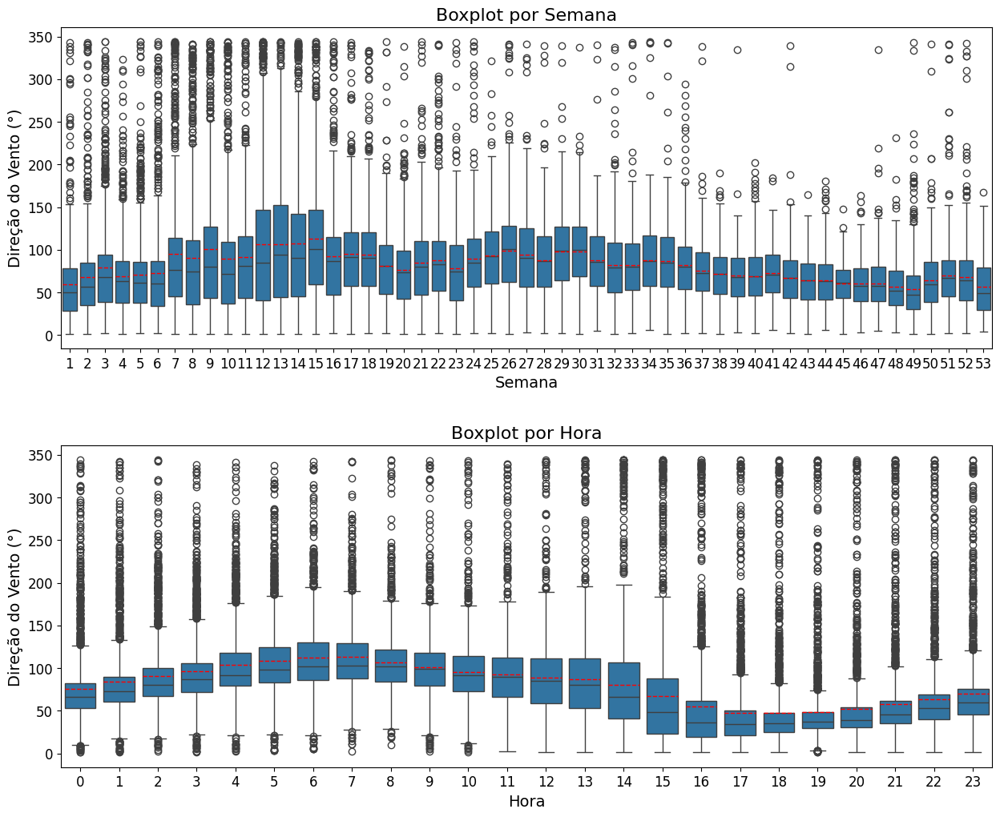

In [171]:
plota_boxplot_semana_hora(data, variavel, label)

- Aparentemente o vento sopra mais próximo dos 160 graus pela manhã e mais próximo dos 50 graus no final do dia

#### 2.8.7. Teste de Estacionariedade (Dickey-Fuller)

In [172]:
dickey_fuller(data, variavel)

MissingDataError: exog contains inf or nans

In [289]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -46.323019
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [290]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -64.430540
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


- Distribuição Estacionária ou Tendência-Estacionária

#### 2.8.8. Decomposição em Tendência e Sazonalidade

##### 2.8.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [173]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

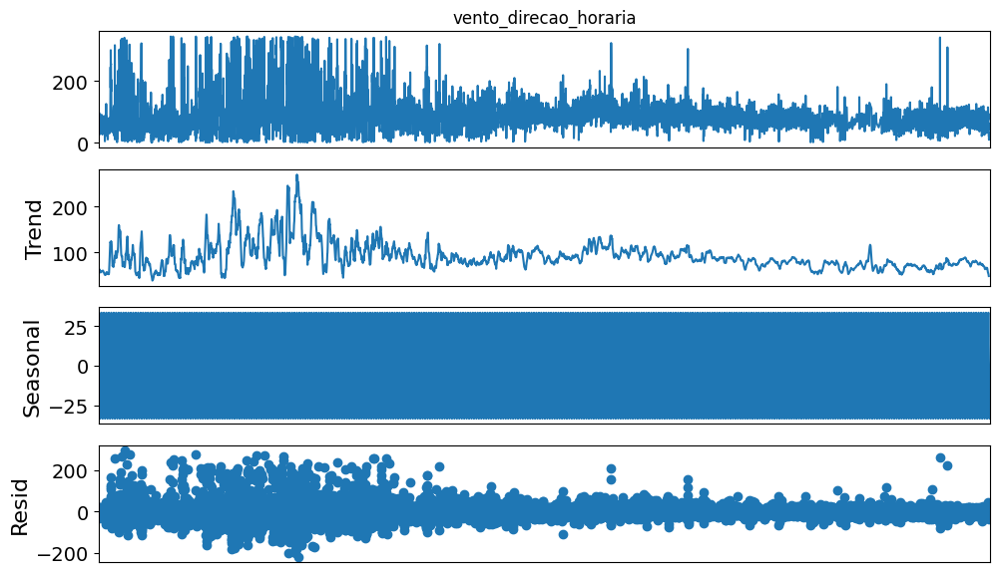

In [174]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.8.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [175]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

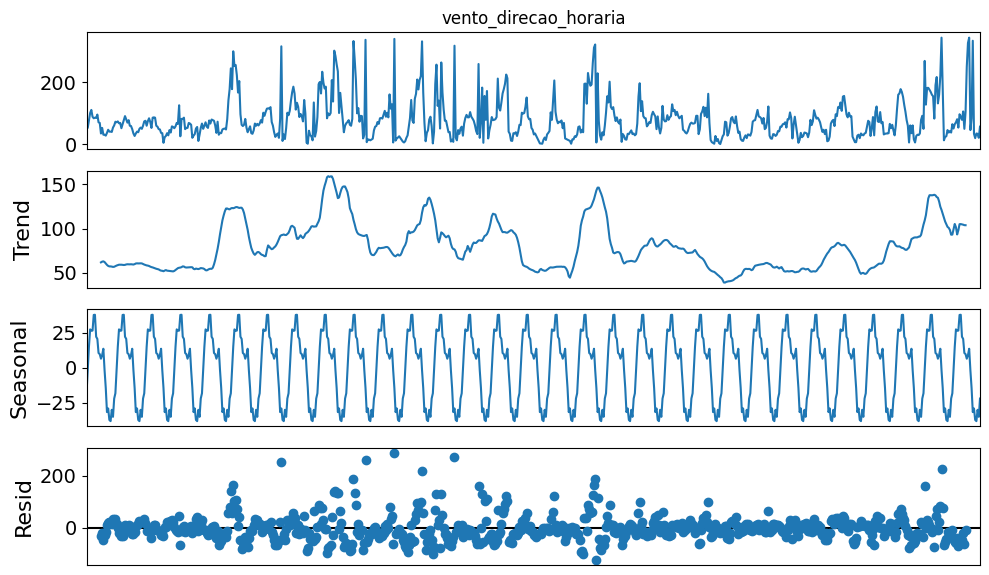

In [176]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.8.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [177]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

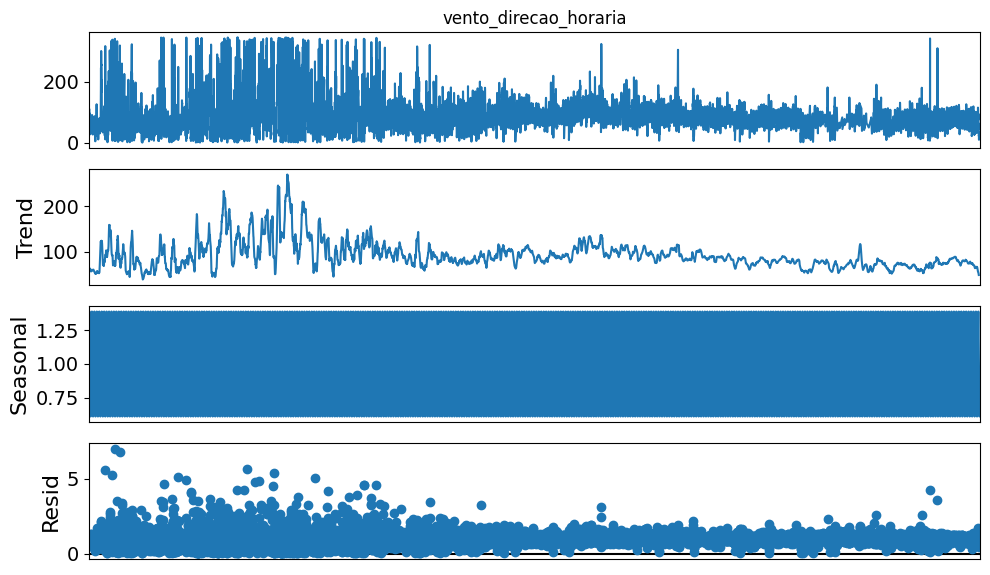

In [178]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.8.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [179]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

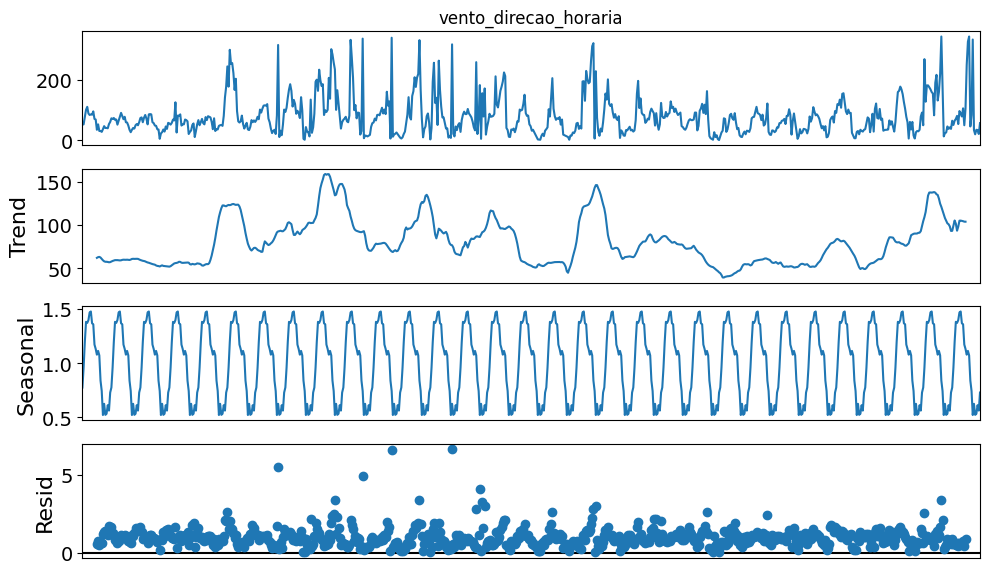

In [180]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Modelo multiplicativo captura melhor os dados e, como esperado, a sazonalidade n~åo é muito definitiva para janelas menores

#### 2.8.9. Análise de Autocorrelação

/Users/mateusalbuquerque/opt/anaconda3/envs/mba_usp/lib/python3.11/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


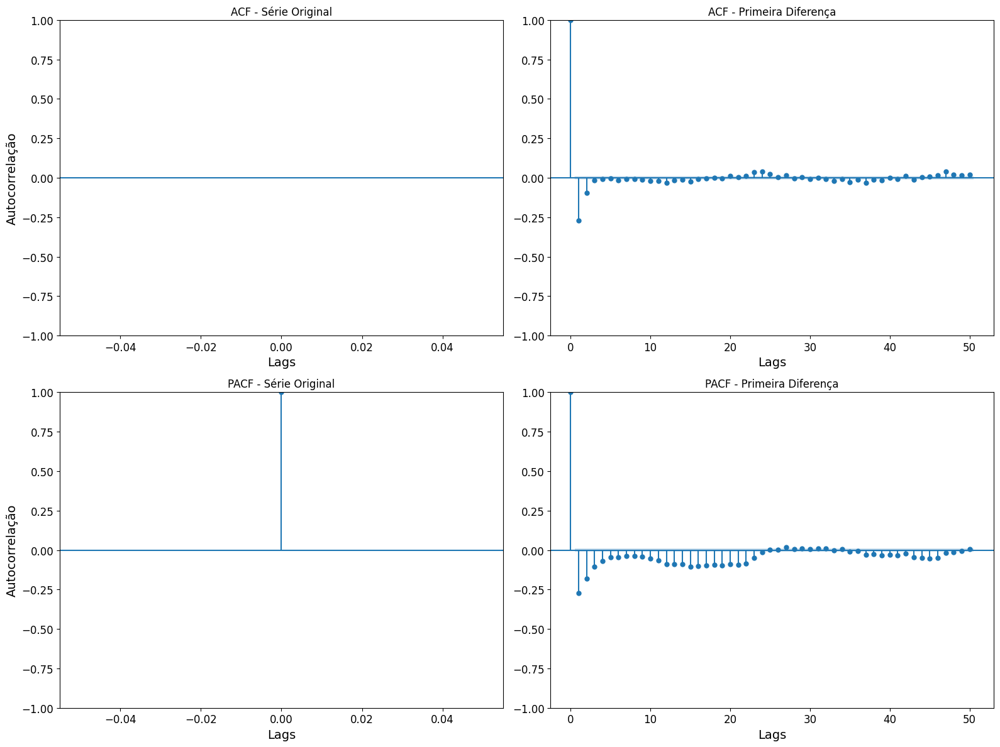

In [181]:
plot_acf_pacf(data, variavel)

In [182]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.9. Rajada Máxima do Vento - EDA univariada

In [183]:
variavel = "vento_rajada_maxima"
label = "Rajada Máxima (m/s)"

#### 2.9.1 Estatísticas descritivas

In [184]:
data[variavel].describe()

count    43824.000000
mean         5.953152
std          3.636433
min          0.010000
25%          3.310000
50%          6.210000
75%          8.810000
max         17.610000
Name: vento_rajada_maxima, dtype: float64

#### 2.9.2. Coeficiente de Variação

In [185]:
print(calcula_cv(data, variavel))

61.08416319738894


#### 2.9.3. Visualização de perfil

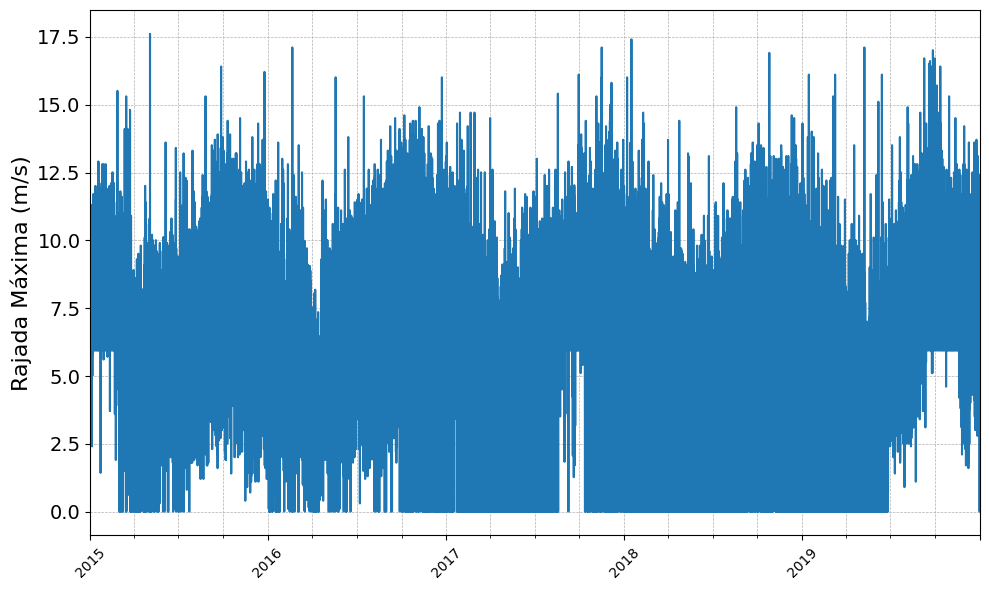

In [186]:
plota_perfil_geral(data, variavel, label)

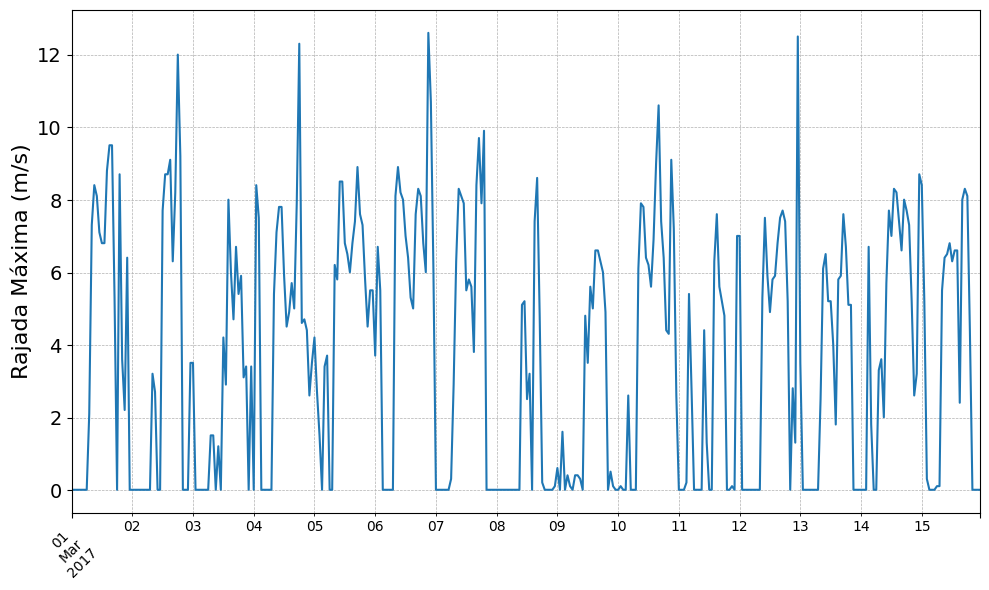

In [187]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

Vemos uma sazonalidade anual e uma leve sazonalidade diária

#### 2.9.4. Média móvel e desvio padrão móvel

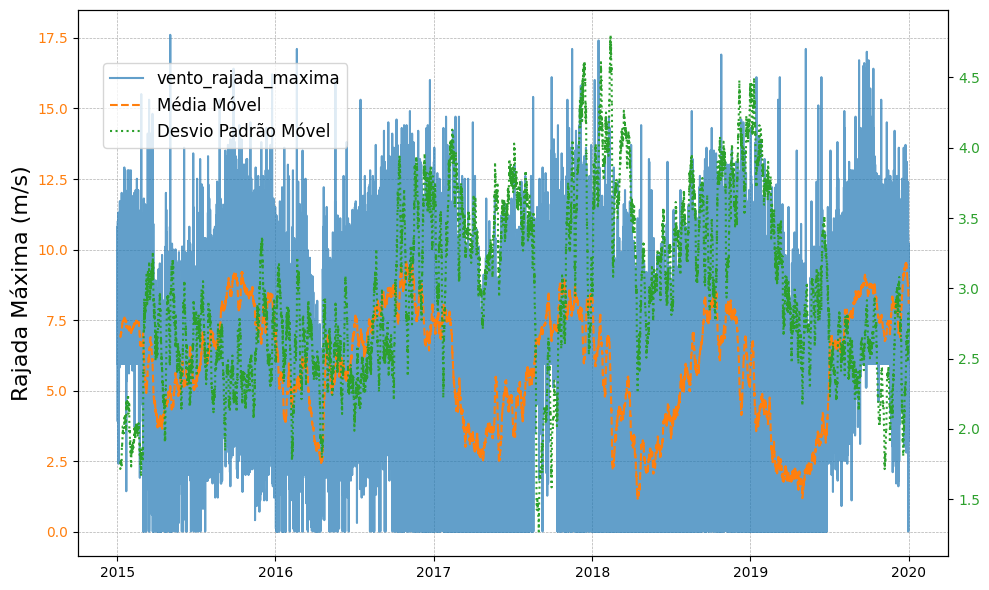

In [188]:
show_estat_moveis(data, variavel, label)

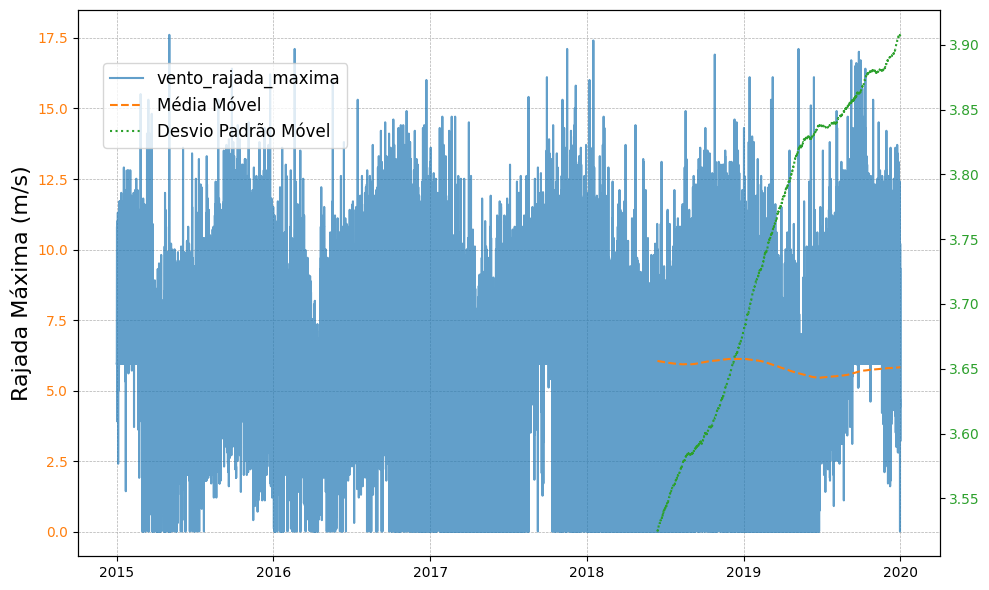

In [189]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

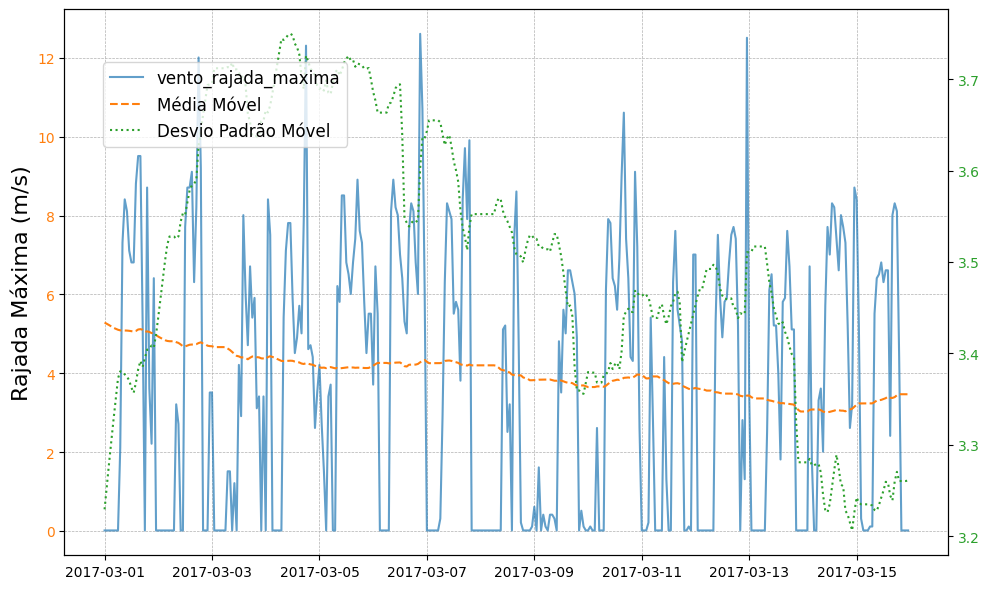

In [190]:
show_estat_moveis(data, variavel, label, inicio, fim)

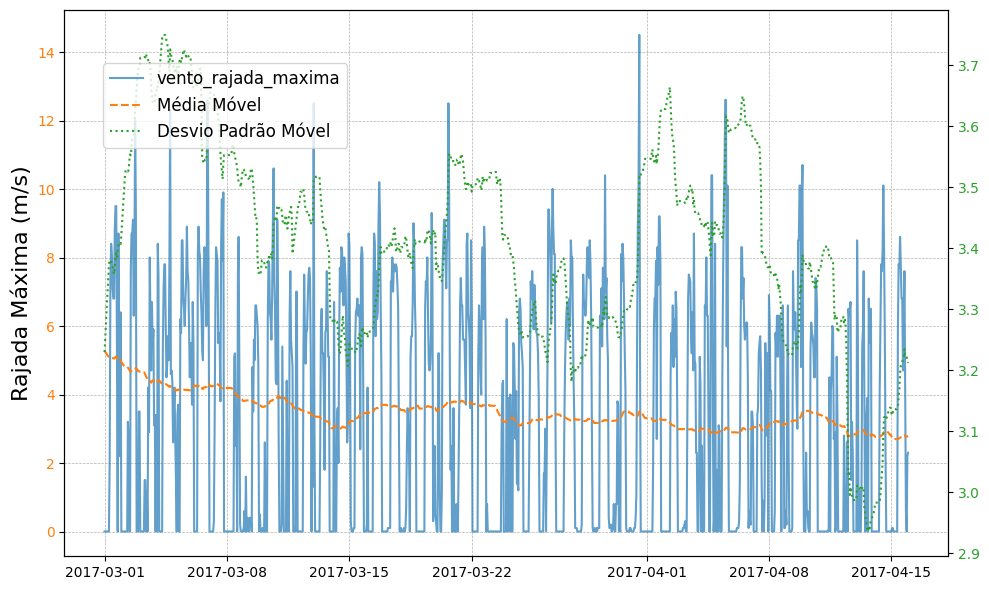

In [191]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

- Mesmo padrão para as outras variáveis

#### 2.9.5. Boxplot geral

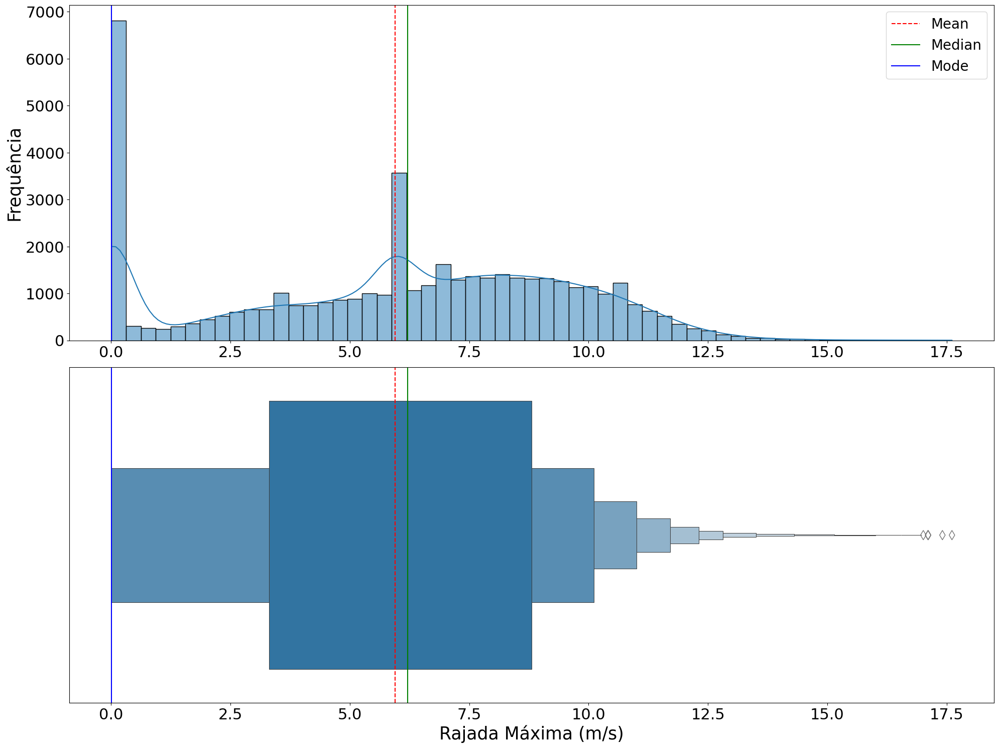

In [192]:
plota_boxplot_geral(data, variavel, label)

Vemos uma distribuição com baixa assimetria mas com moda bem desviantes da média-mediana. Maior parte dos valores iguais a 0 (sem vento).

#### 2.9.6. Boxplot por semana e hora do dia

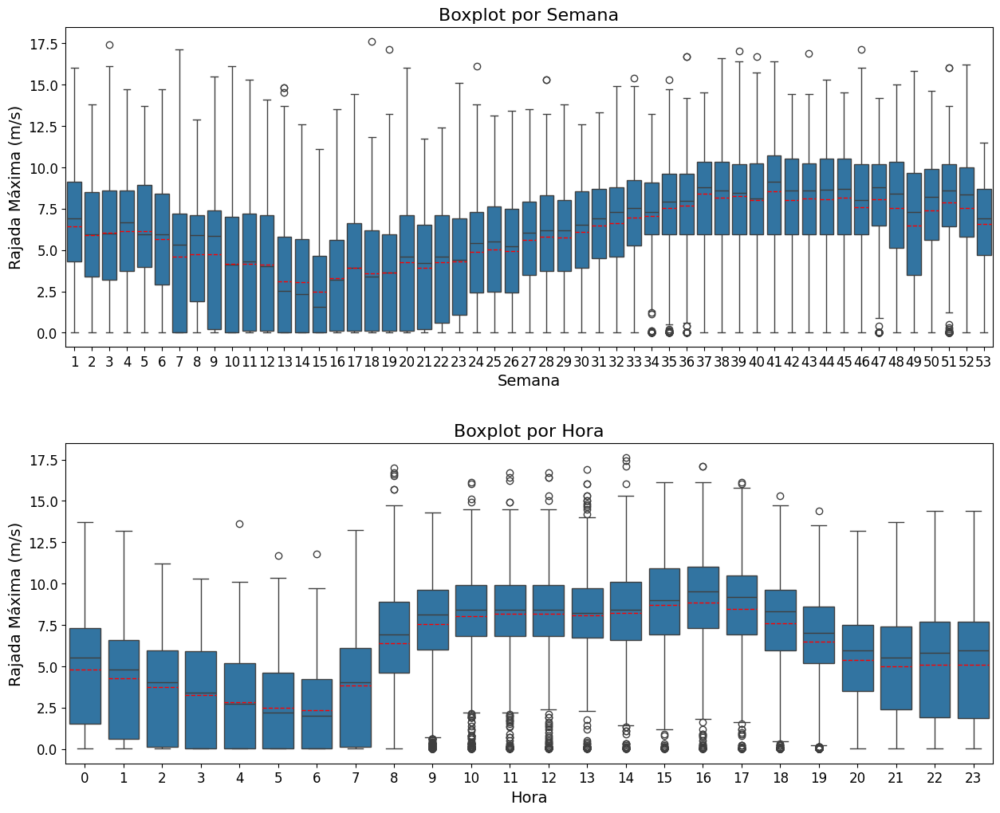

In [193]:
plota_boxplot_semana_hora(data, variavel, label)

- Menores valores de Rajada Máxima no primeiro semestre e maiores valores no segundo semestre
- Maiores valores no período da tarde - início da noite

#### 2.9.7. Teste de Estacionariedade (Dickey-Fuller)

In [194]:
dickey_fuller(data, variavel)

ADF Statistic: -8.217903
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [195]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -50.892012
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [196]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -63.710835
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


- Distribuição estacionária ou tendência-estacionária

#### 2.9.8. Decomposição em Tendência e Sazonalidade

##### 2.9.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [197]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

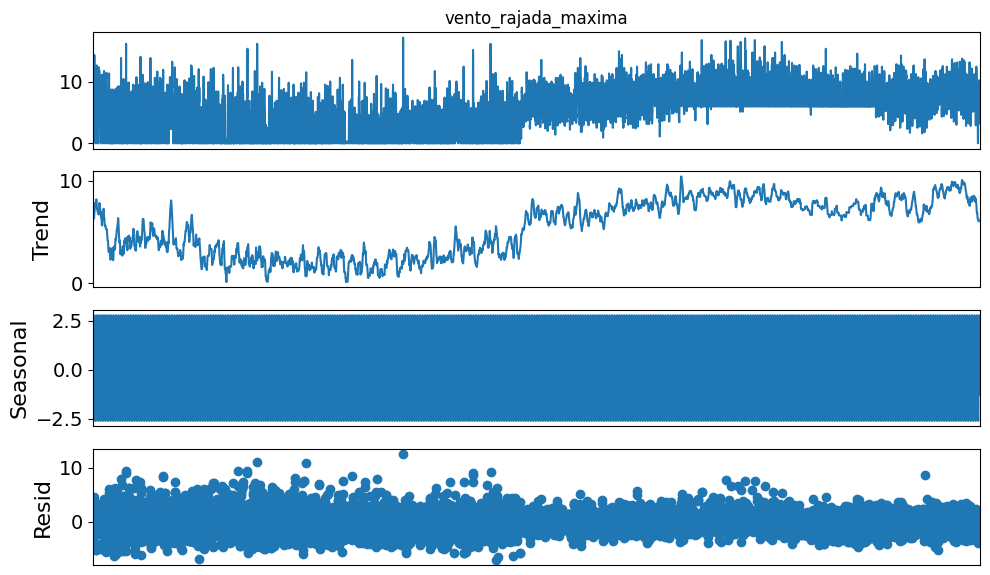

In [198]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.9.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [199]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

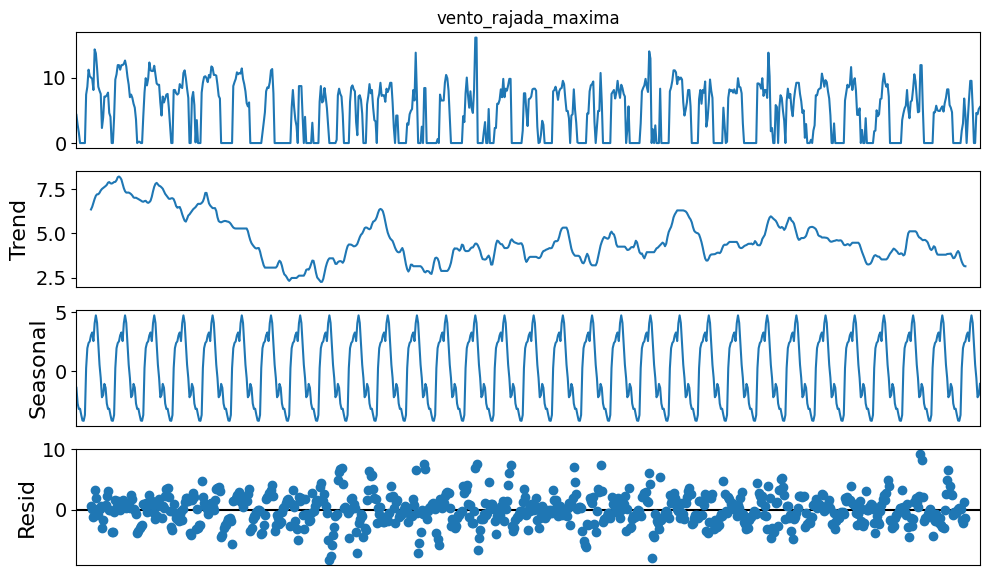

In [200]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.9.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [201]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

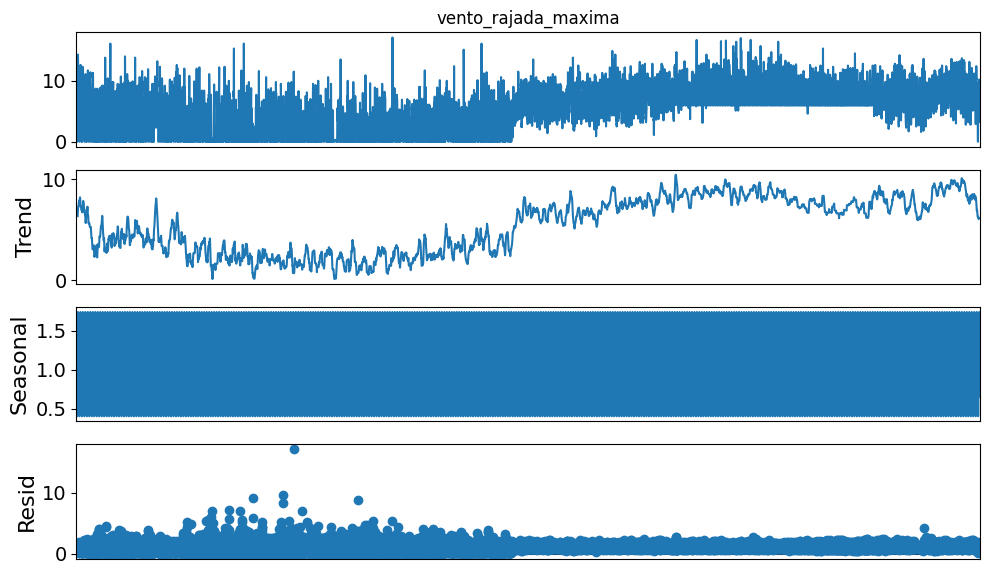

In [202]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.9.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [203]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

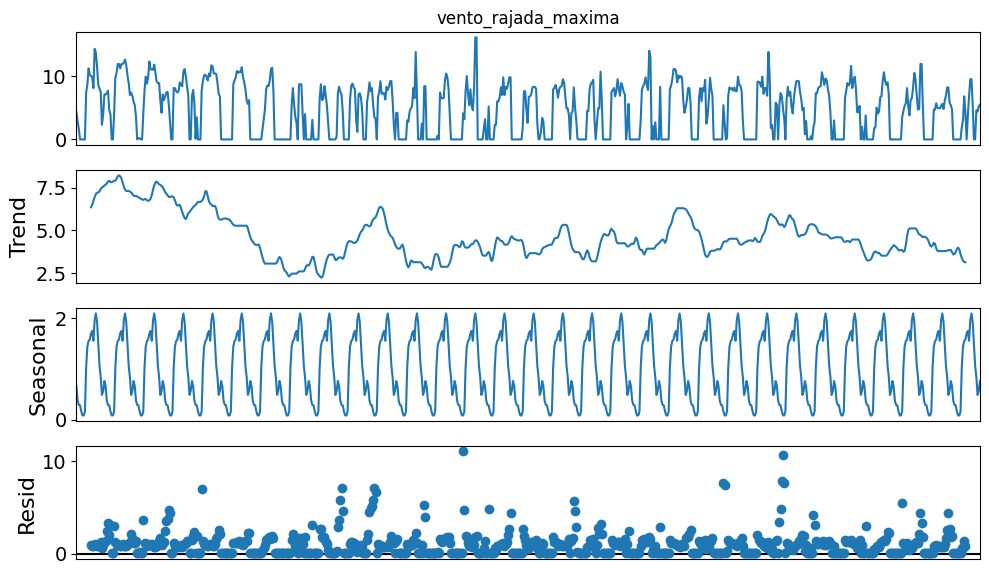

In [204]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Modelo aditivo com menores resíduos
- Sazonalidade verificada

#### 2.9.9. Análise de Autocorrelação

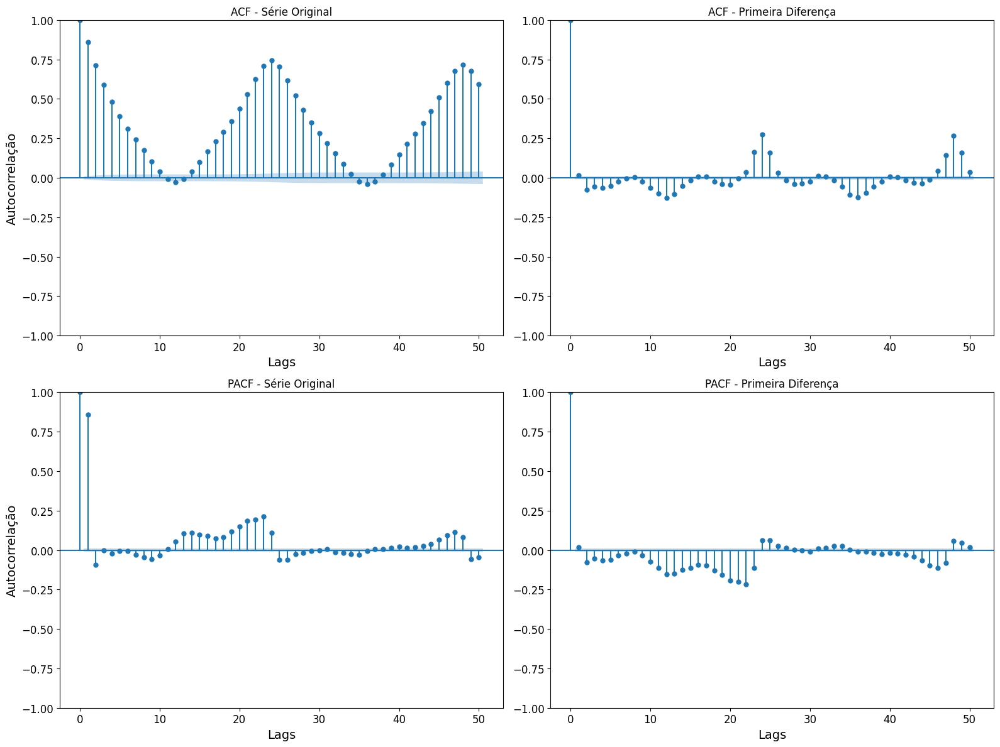

In [205]:
plot_acf_pacf(data, variavel)

- Mais uma vez, conseguimos identificar a sazonalidade dos dados

In [206]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.10. Velocidade do Vento - EDA univariada

In [207]:
variavel = "vento_velocidade_horaria"
label = "Velocidade do Vento (m/s)"

#### 2.10.1 Estatísticas descritivas

In [208]:
data[variavel].describe()

count    43824.000000
mean         2.045874
std          1.975889
min          0.010000
25%          0.010000
50%          1.910000
75%          3.510000
max          9.210000
Name: vento_velocidade_horaria, dtype: float64

#### 2.10.2. Coeficiente de Variação

In [209]:
print(calcula_cv(data, variavel))

96.57918696065269


#### 2.10.3. Visualização de perfil

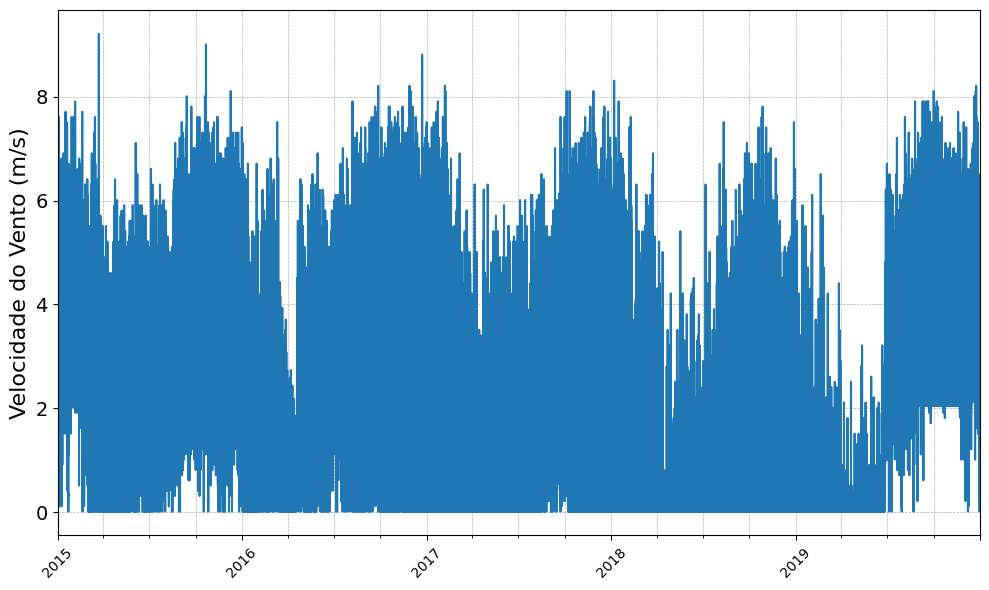

In [210]:
plota_perfil_geral(data, variavel, label)

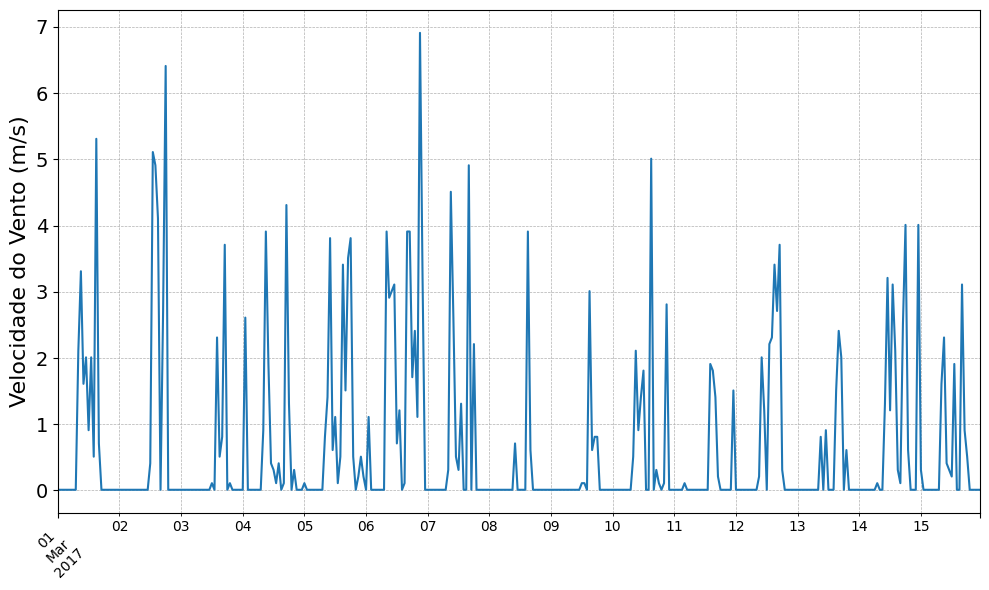

In [211]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

- Vemos o perfil sazonal anual e um leve perfil diário

#### 2.10.4. Média móvel e desvio padrão móvel

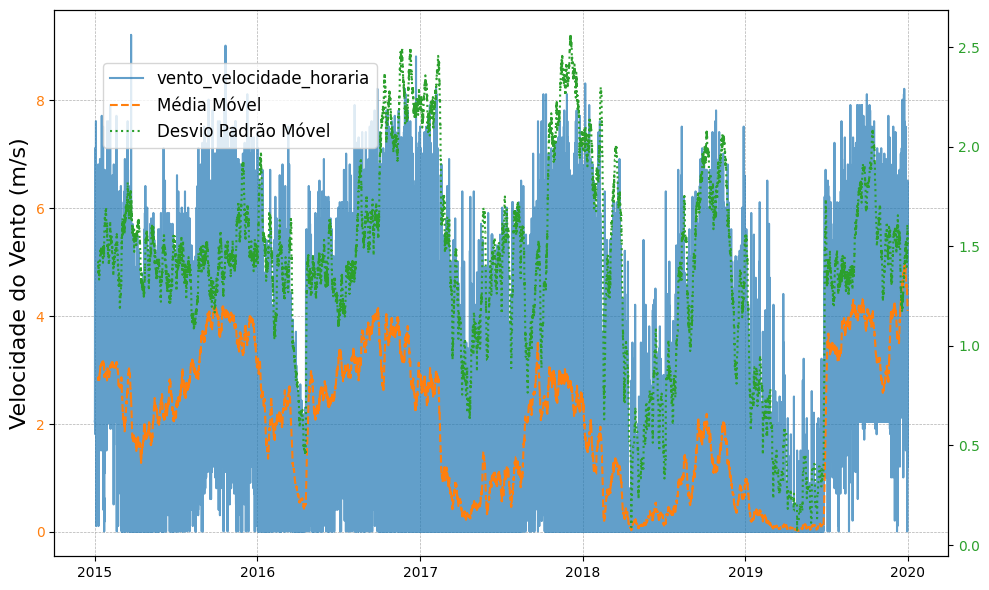

In [212]:
show_estat_moveis(data, variavel, label)

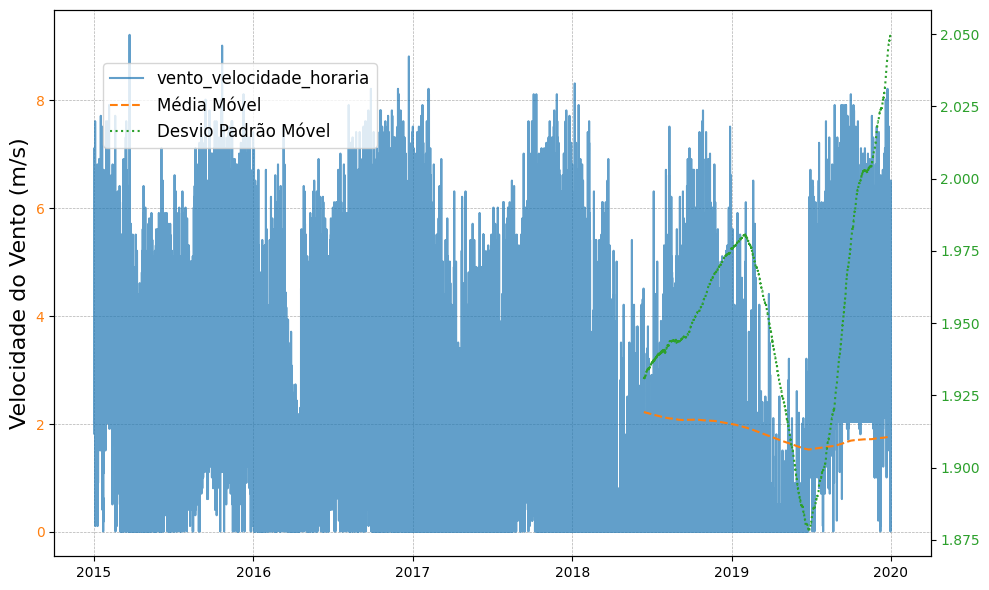

In [213]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

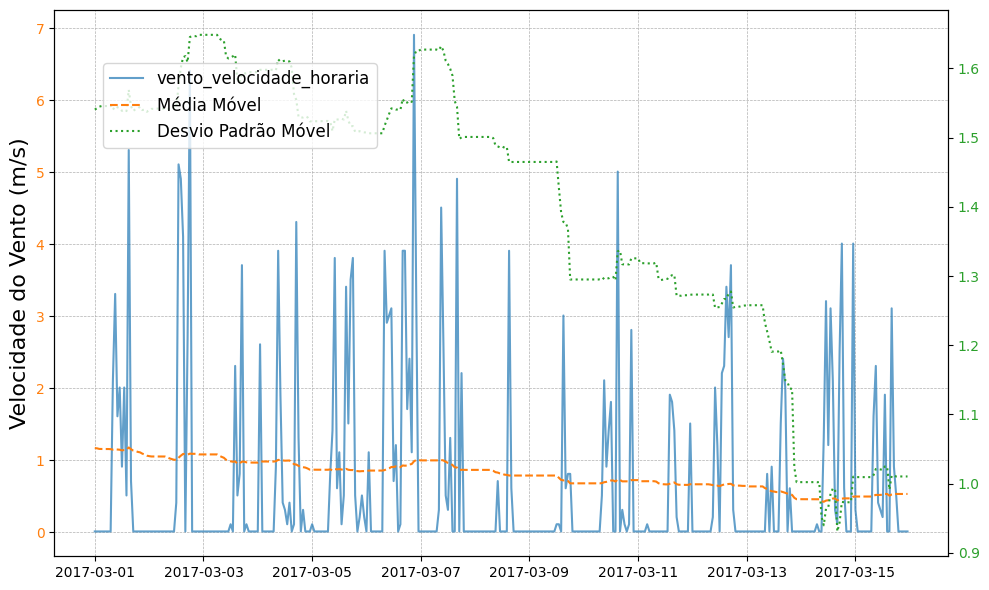

In [214]:
show_estat_moveis(data, variavel, label, inicio, fim)

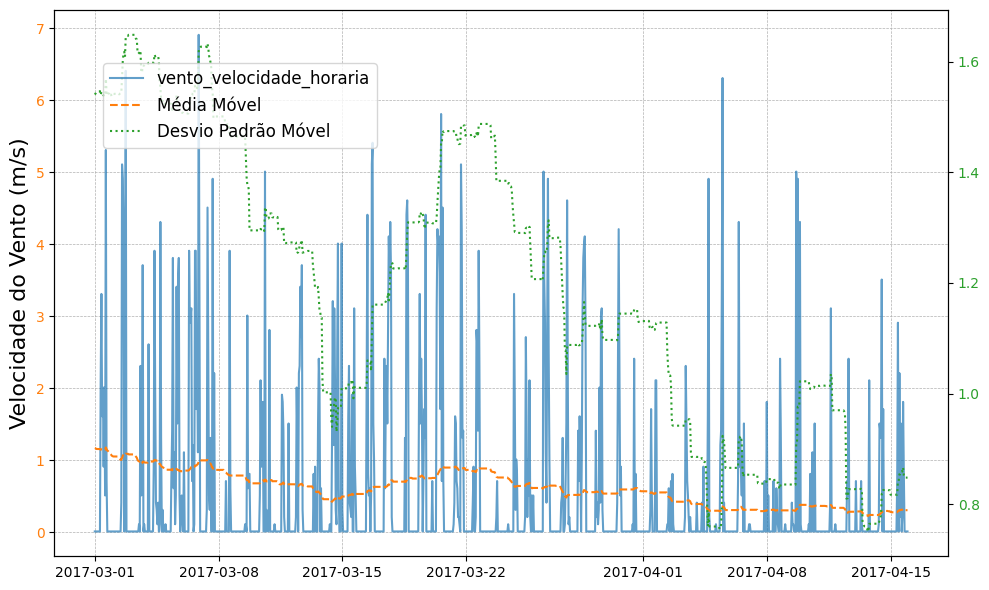

In [215]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

- Valores parecem ter uma tendência de queda no passar dos anos

#### 2.10.5. Boxplot geral

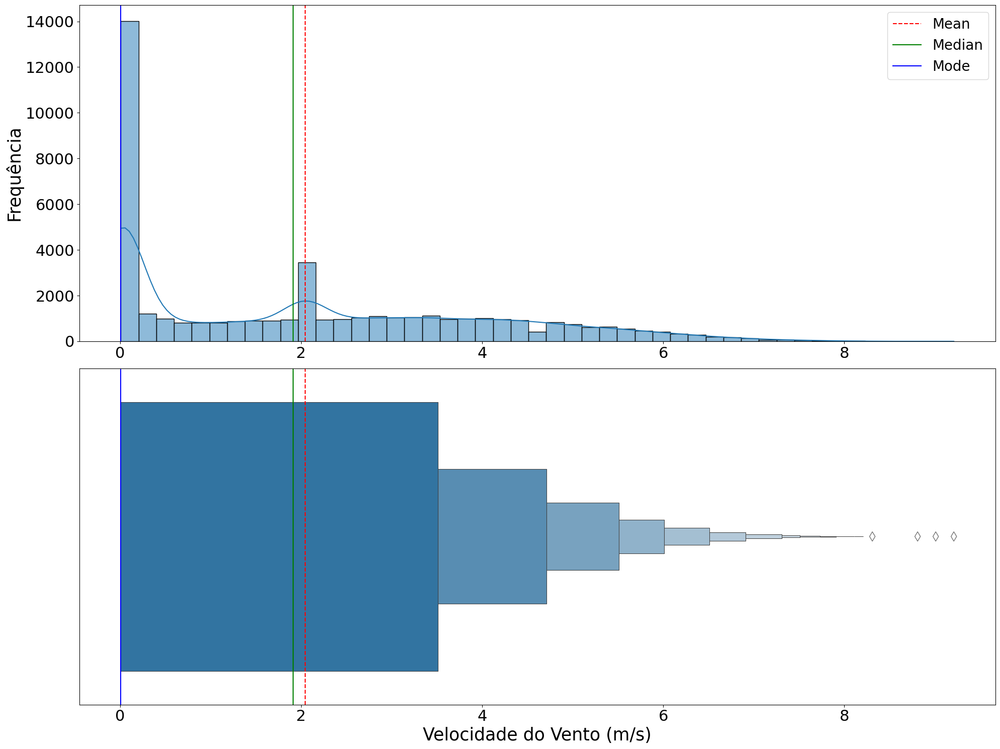

In [216]:
plota_boxplot_geral(data, variavel, label)

- Confirmamos a assimetria
- Maior parte dos valores é 0

#### 2.10.6. Boxplot por semana e hora do dia

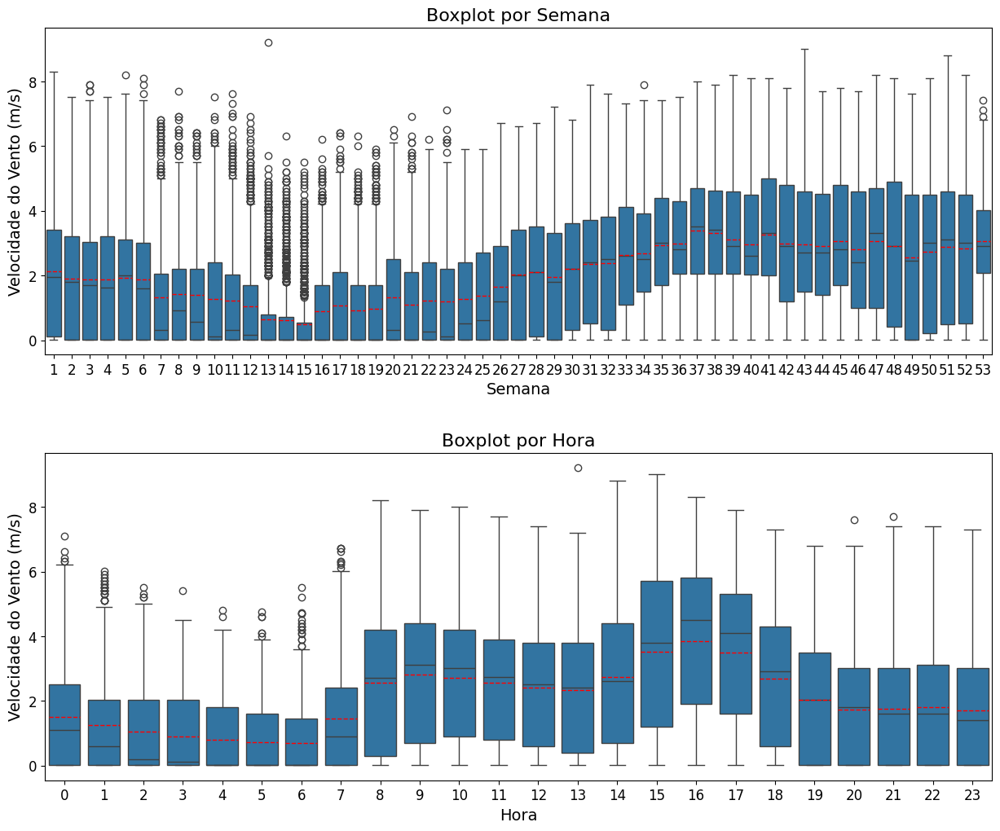

In [217]:
plota_boxplot_semana_hora(data, variavel, label)

- Temos maiores valores no segundo semetre do ano
- Maiores valores (com maior variação tbm) à tarde e noite

#### 2.10.7. Teste de Estacionariedade (Dickey-Fuller)

In [218]:
dickey_fuller(data, variavel)

ADF Statistic: -5.619522
p-value: 0.000001
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [219]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -50.892012
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [220]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -63.710835
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Distribuição estacionária ou tendência-estacionária

#### 2.10.8. Decomposição em Tendência e Sazonalidade

##### 2.10.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [221]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

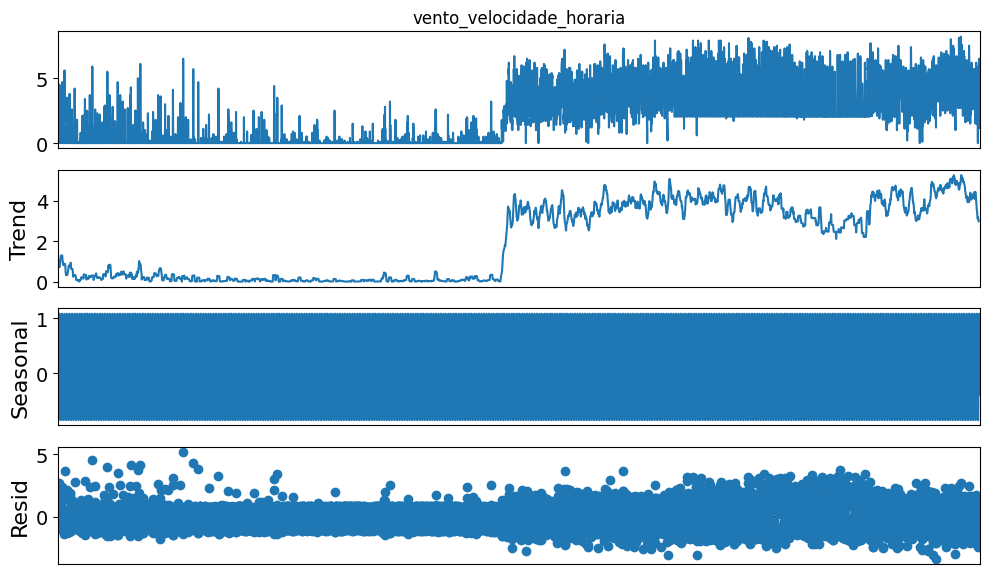

In [222]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.10.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [223]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

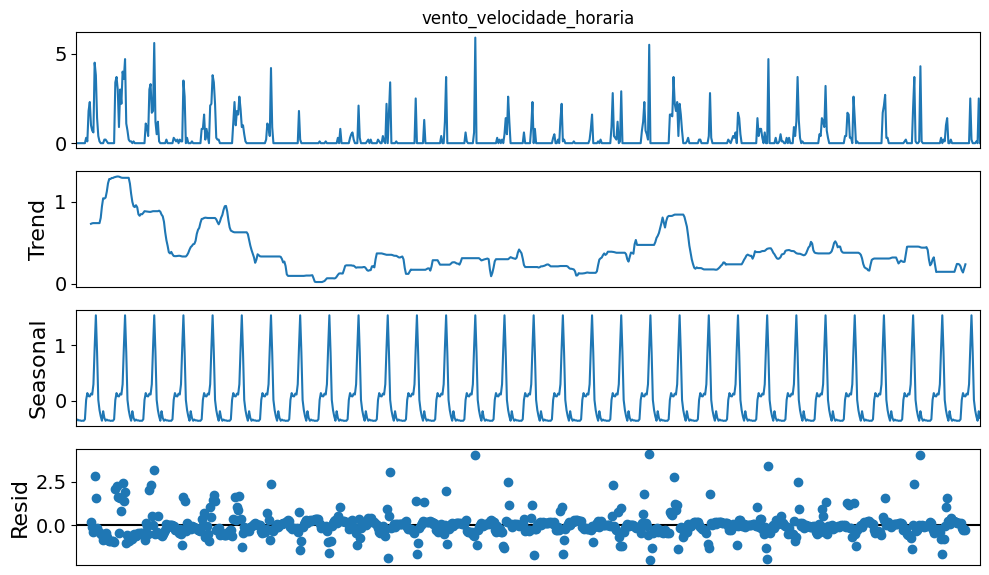

In [224]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.10.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [225]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

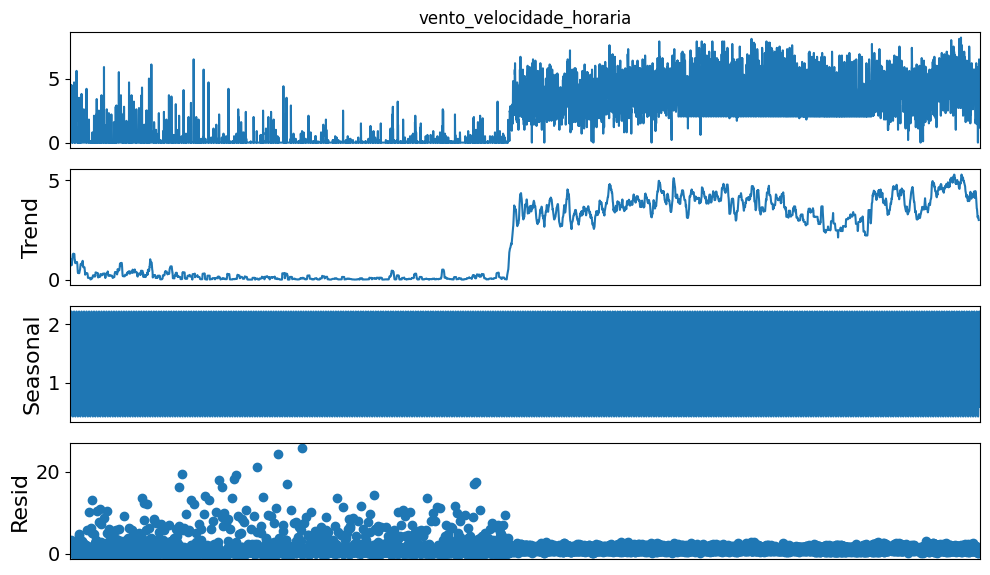

In [226]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.10.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [227]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

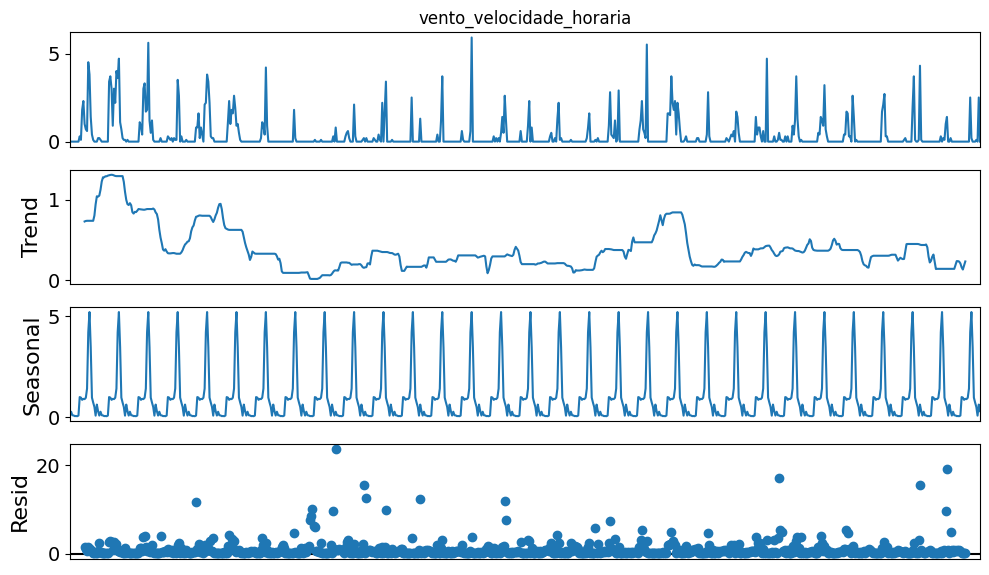

In [228]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

- Modelo aditivo reduziu mais os resíduos
- Vemos a tendência decrescente dos valores e a sazonalidade diária

#### 2.10.9. Análise de Autocorrelação

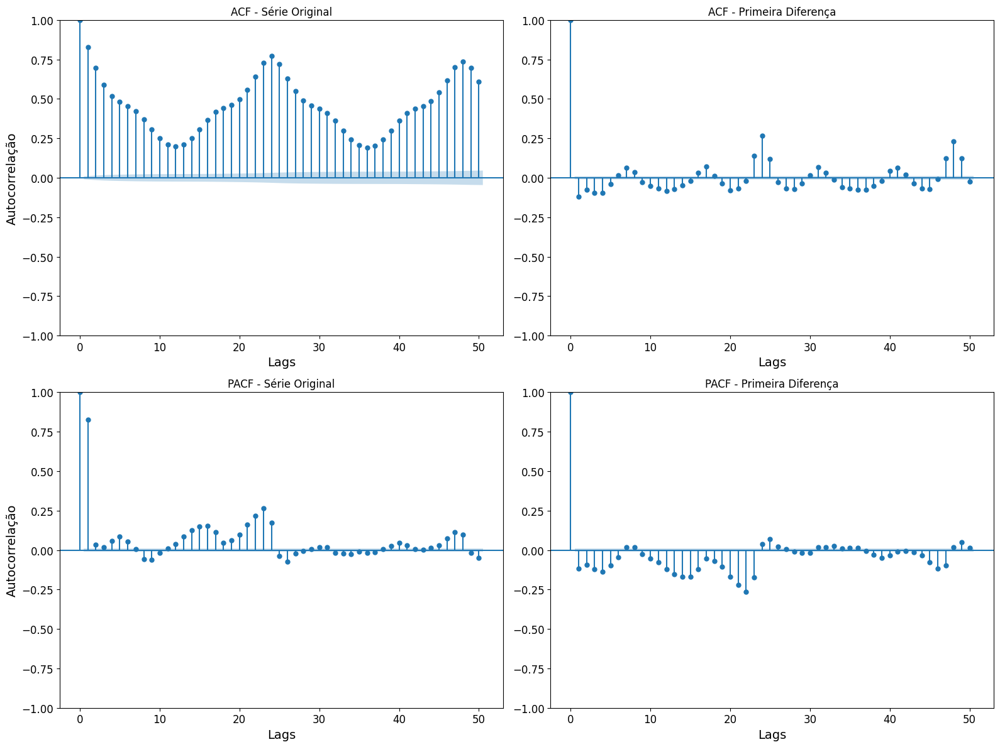

In [229]:
plot_acf_pacf(data, variavel)

- Vemos a sazonalidade

In [230]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43824 entries, 2015-01-01 00:00:00 to 2019-12-31 23:00:00
Data columns (total 13 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   precipitacao_total_horario                 43824 non-null  float64
 1   pressao_atmosferica_nivel_estacao_horaria  43816 non-null  float64
 2   temperatura_ar_bulbo_seco_horaria          43824 non-null  float64
 3   umidade_relativa_ar_horaria                43824 non-null  float64
 4   vento_direcao_horaria                      43816 non-null  float64
 5   vento_rajada_maxima                        43824 non-null  float64
 6   vento_velocidade_horaria                   43824 non-null  float64
 7   radiacao_global                            43824 non-null  float64
 8   year                                       43824 non-null  int64  
 9   hora                                       43824 non-null  

### 2.11. Radiação Global - EDA univariada

In [231]:
variavel = "radiacao_global"
label = "Radiação Global (kW/m²)"

#### 2.11.1 Estatísticas descritivas

In [232]:
data[variavel].describe()

count    43824.000000
mean       881.375056
std       1144.538929
min          0.010000
25%          0.010000
50%         65.760000
75%       1741.110000
max       4457.610000
Name: radiacao_global, dtype: float64

#### 2.11.2. Coeficiente de Variação

In [233]:
print(calcula_cv(data, variavel))

129.85832995062555


#### 2.11.3. Visualização de perfil

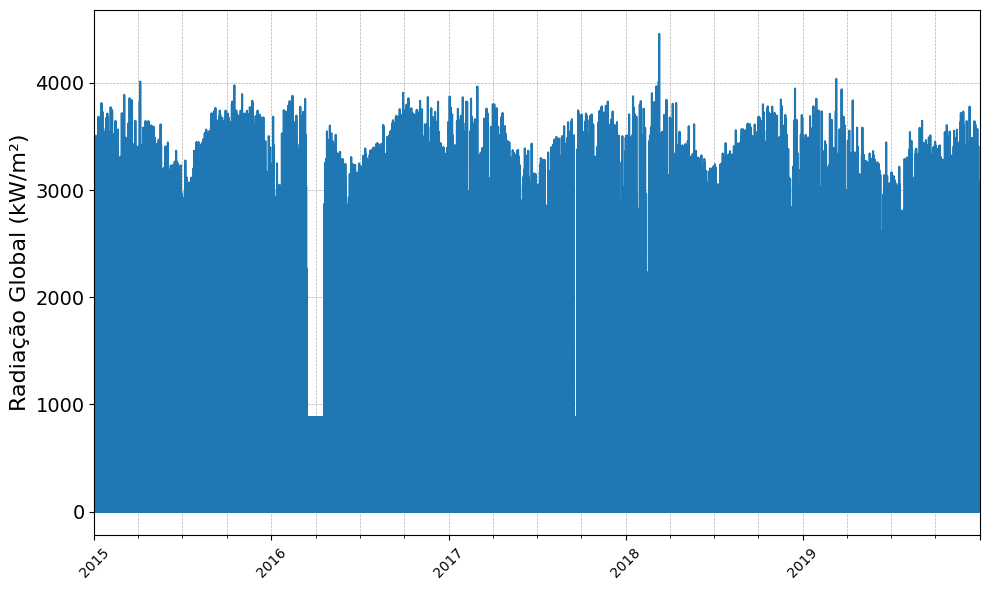

In [234]:
plota_perfil_geral(data, variavel, label)

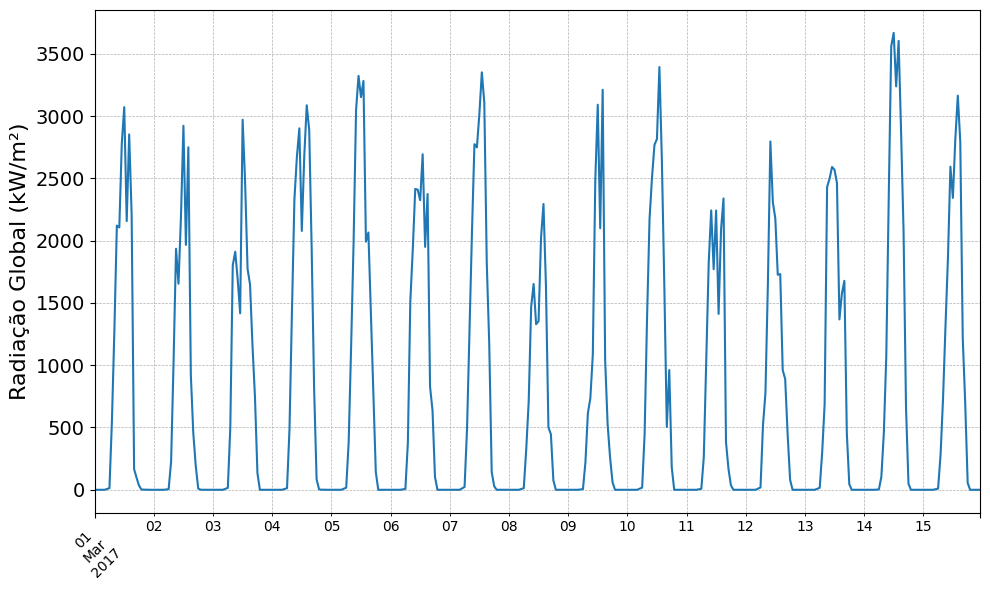

In [235]:
inicio = "2017-03-01"
fim = "2017-03-15"

plota_perfil_geral(data, variavel, label, inicio, fim)

#### 2.11.4. Média móvel e desvio padrão móvel

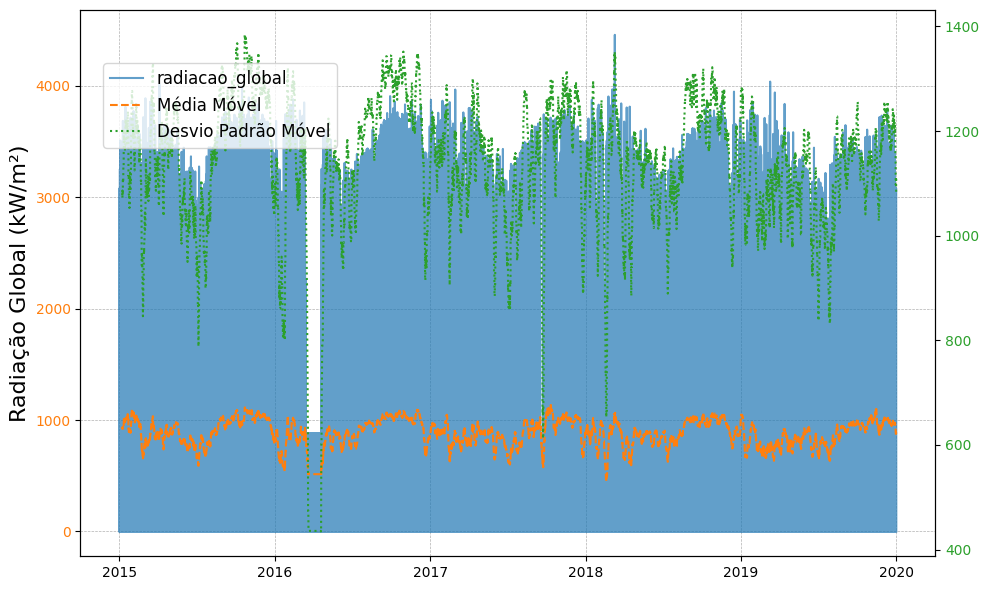

In [236]:
show_estat_moveis(data, variavel, label)

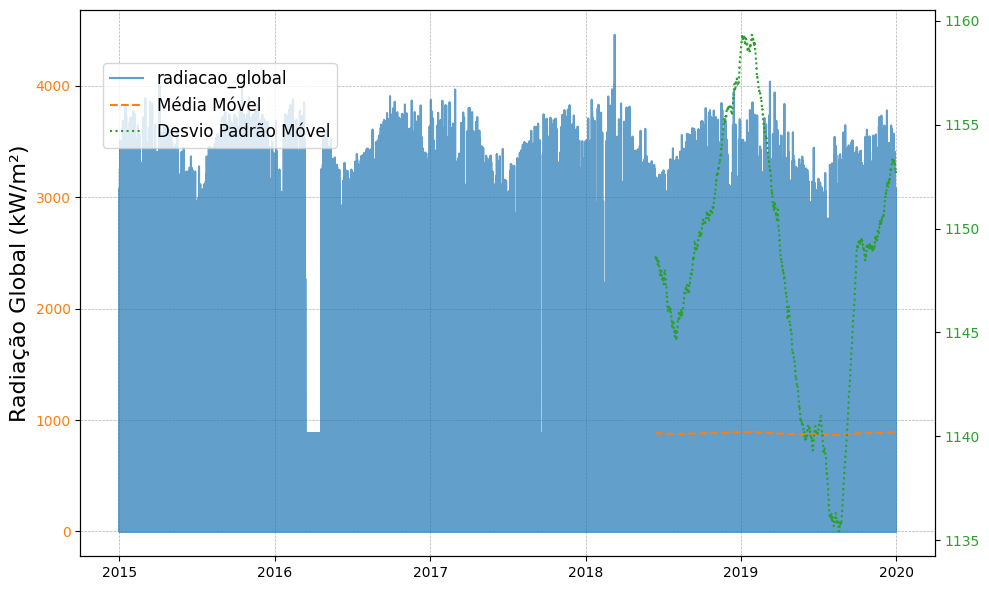

In [237]:
window = 24 * 7 * 180
show_estat_moveis(data, variavel, label, window=window)

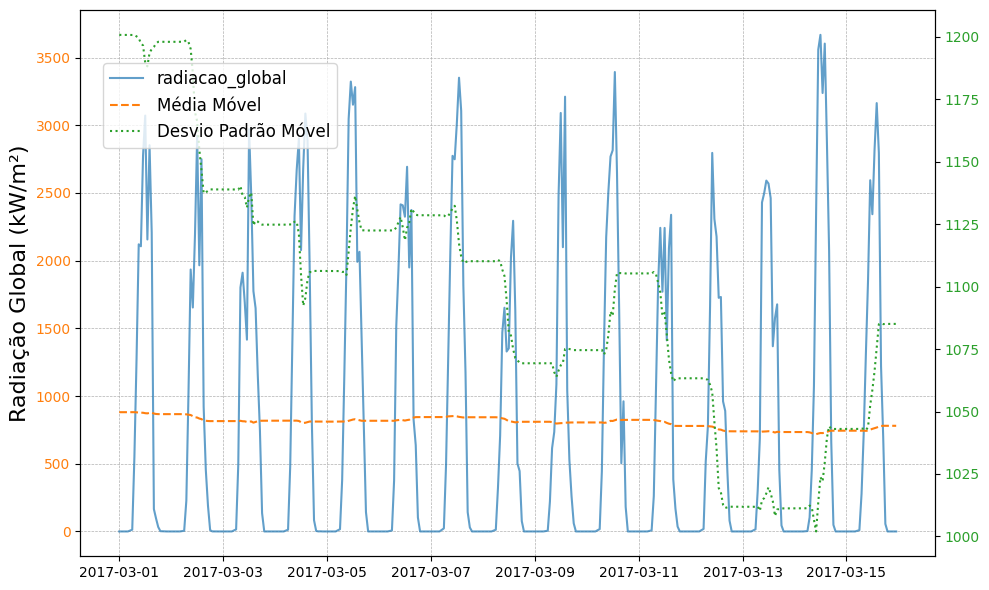

In [238]:
show_estat_moveis(data, variavel, label, inicio, fim)

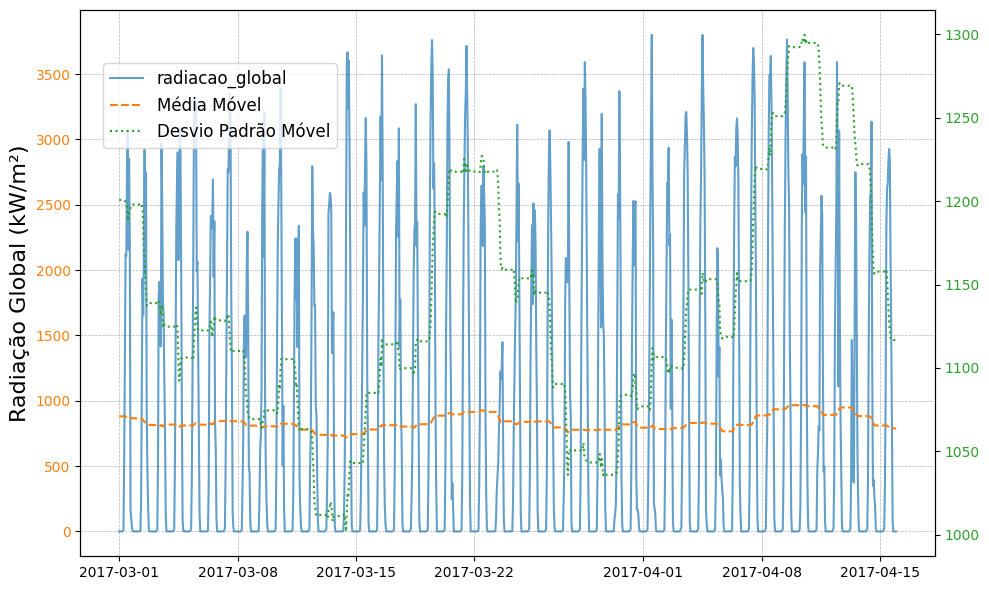

In [239]:
fim = "2017-04-15"
show_estat_moveis(data, variavel, label, inicio, fim)

#### 2.11.5. Boxplot geral

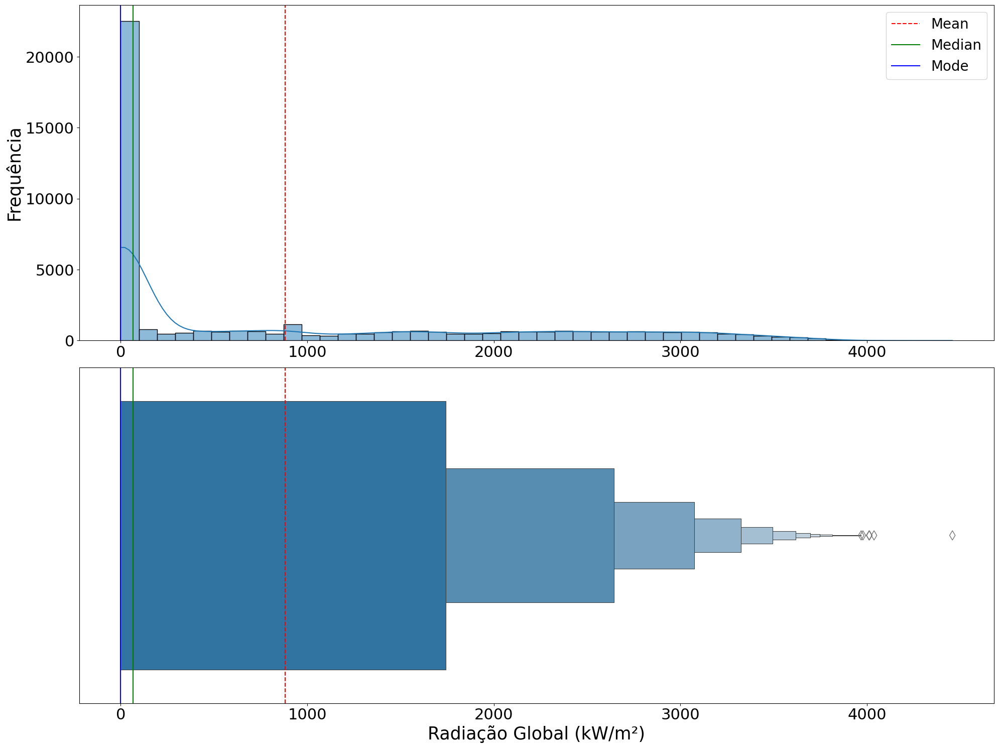

In [240]:
plota_boxplot_geral(data, variavel, label)

#### 2.11.6. Boxplot por semana e hora do dia

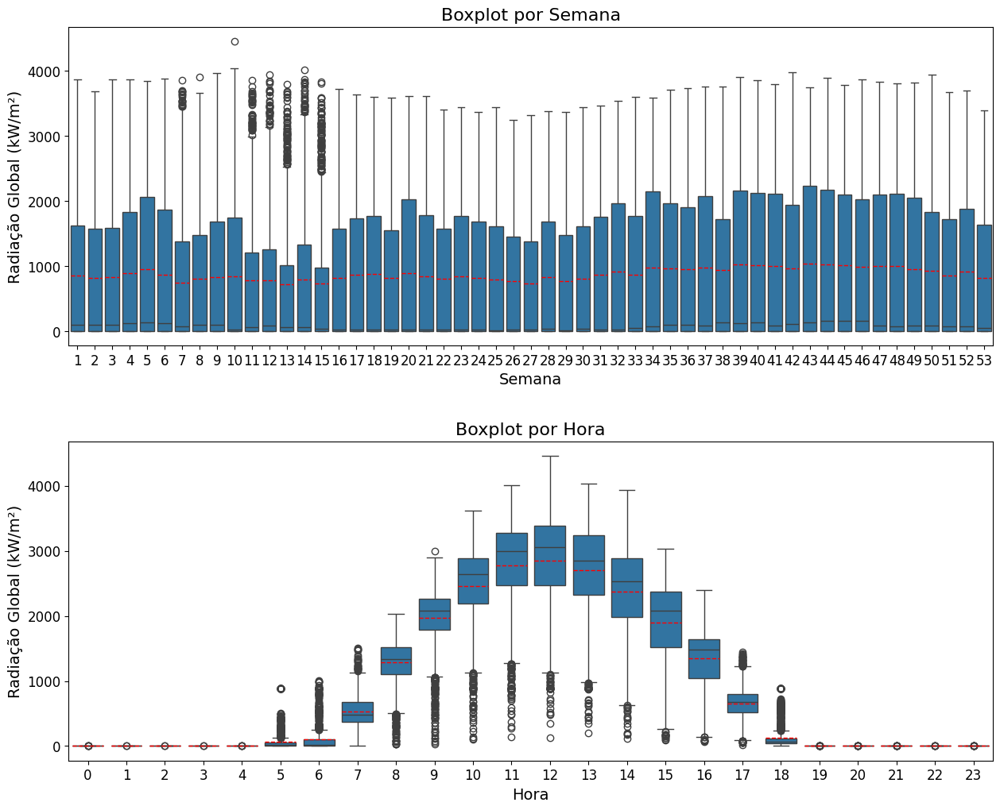

In [241]:
plota_boxplot_semana_hora(data, variavel, label)

#### 2.11.7. Teste de Estacionariedade (Dickey-Fuller)

In [242]:
dickey_fuller(data, variavel)

ADF Statistic: -17.624423
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [243]:
# Teste para primeira diferença
dickey_fuller(data, variavel, tipo="1_diff")

ADF Statistic: -50.892012
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


In [244]:
# Teste para segunda diferença
dickey_fuller(data, variavel, tipo="2_diff")

ADF Statistic: -63.710835
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


#### 2.11.8. Decomposição em Tendência e Sazonalidade

##### 2.11.8.1. Modelo Aditivo reduzido (1 ano de dados)

In [245]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "additive"

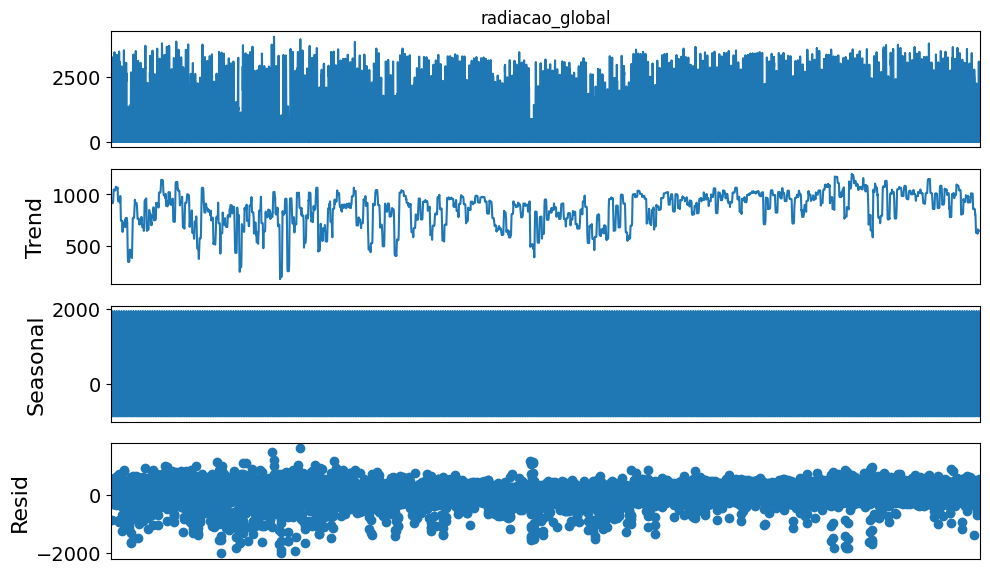

In [246]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.11.8.2. Modelo Aditivo reduzido (1 mês de dados)

In [247]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

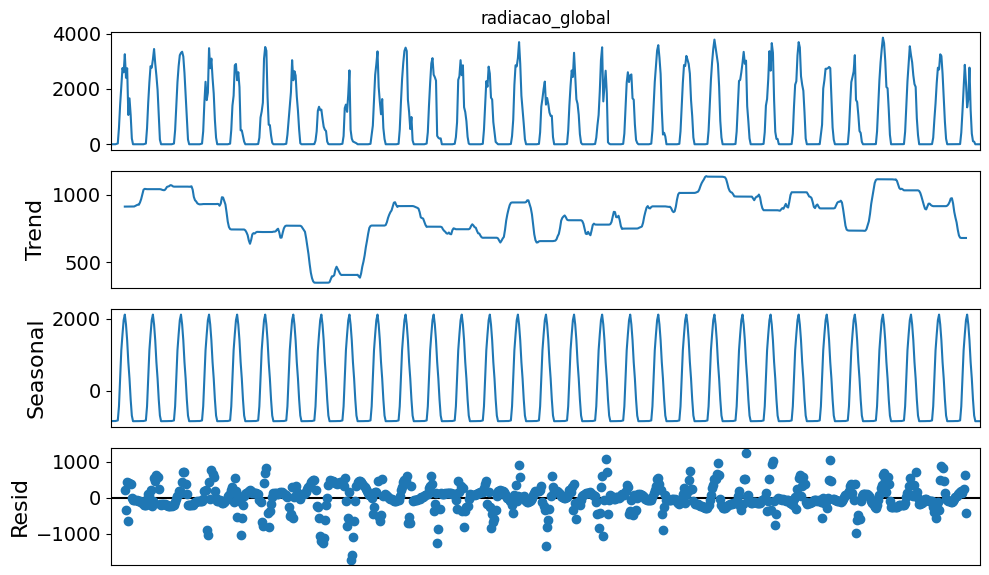

In [248]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.11.8.3. Modelo multiplicativo reduzido (1 ano de dados)

In [249]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-12-31 23:00:00"
tipo = "multiplicative"

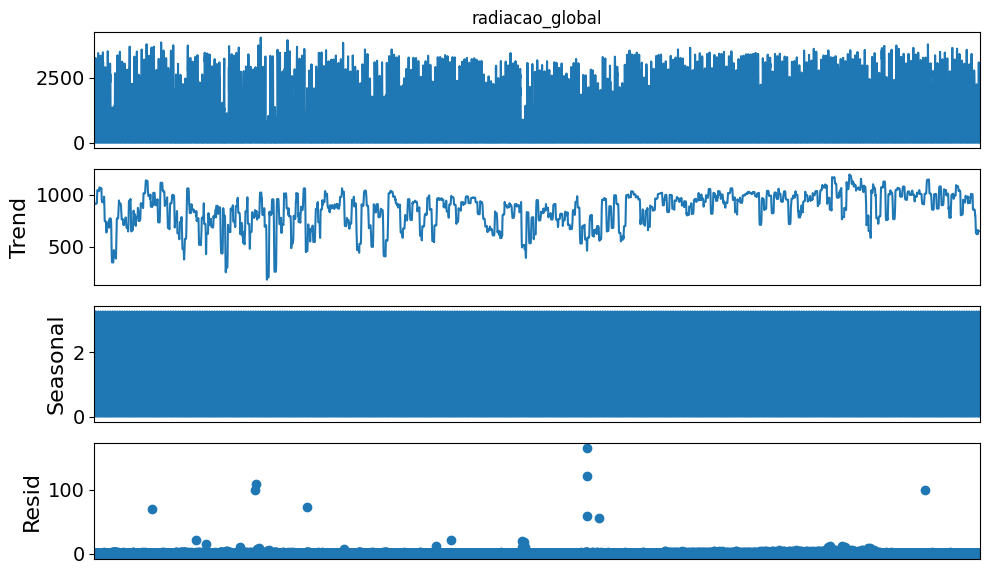

In [250]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

##### 2.11.8.4. Modelo multiplicativo reduzido (1 mês de dados)

In [251]:
inicio_decomp = "2019-01-01 00:00:00"
fim_decomp = "2019-01-31 23:00:00"

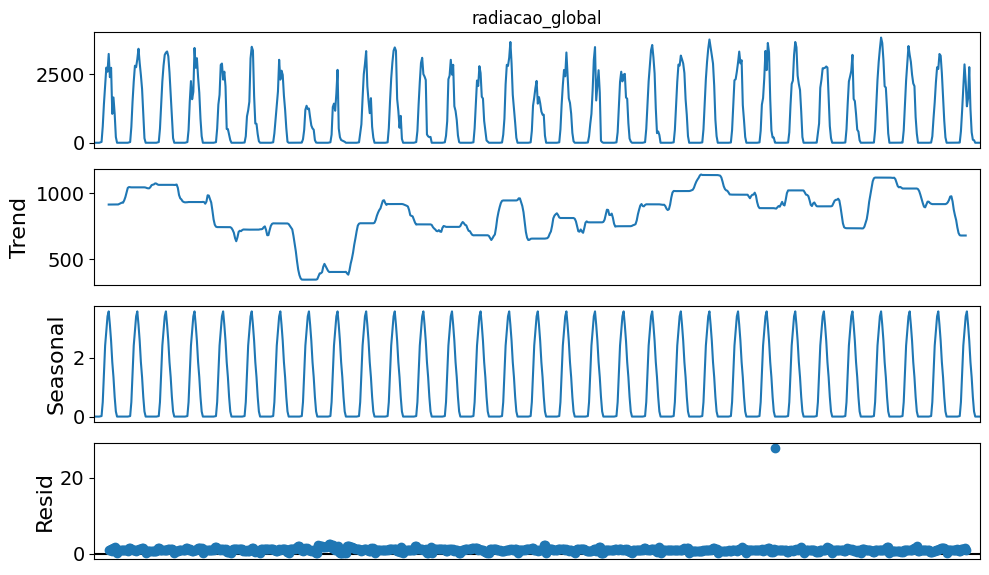

In [252]:
decompoe_tendencia_sazonalidade(
    data, variavel, tipo, inicio=inicio_decomp, fim=fim_decomp
)

#### 2.11.9. Análise de Autocorrelação

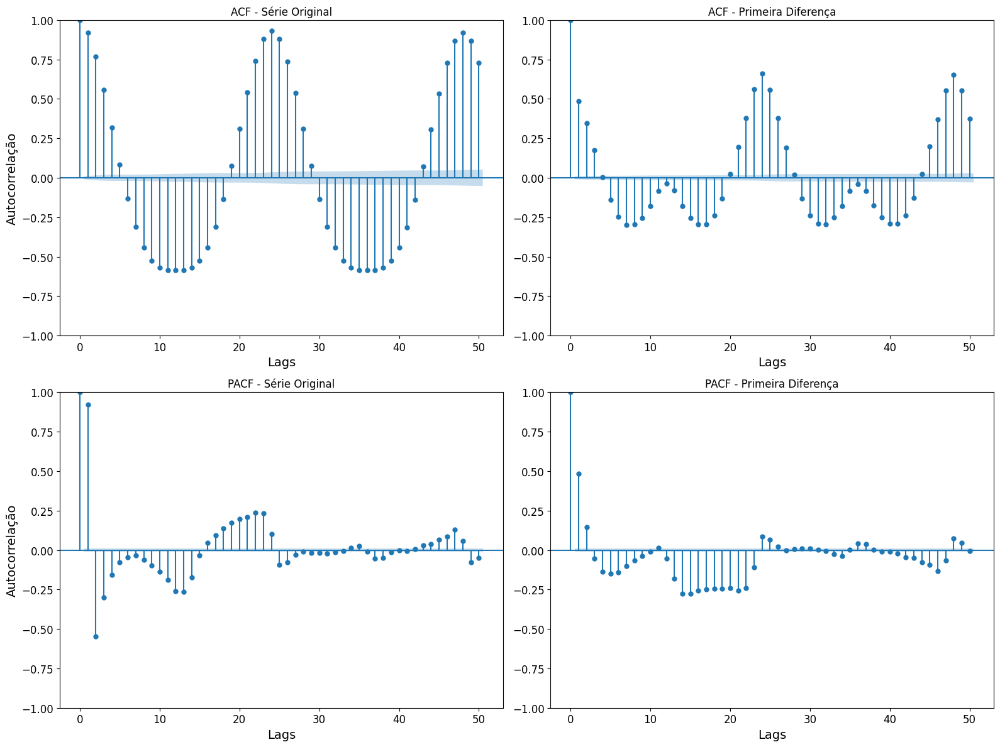

In [253]:
plot_acf_pacf(data, variavel)